<B> Implemeting Libraries <B>

In [1]:
import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

<b>Part a : Preprocessing data and assigning signs to the edges according to GoldStein Scale.<b>

In [2]:
gdelt = pd.read_csv("Azerbijan_Armenia_conflict.csv")

/home/amiable/.local/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3146: DtypeWarning: Columns (24) have mixed types.Specify dtype option on import or set low_memory=False.
  has_raised = await self.run_ast_nodes(code_ast.body, cell_name,


In [3]:
gdelt

,GLOBALEVENTID,SQLDATE,MonthYear,Year,FractionDate,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor1EthnicCode,...,Actor2Geo_FeatureID,ActionGeo_Type,ActionGeo_FullName,ActionGeo_CountryCode,ActionGeo_ADM1Code,ActionGeo_Lat,ActionGeo_Long,ActionGeo_FeatureID,DATEADDED,SOURCEURL
0,950095871,20201004,202010,2020,2020.7507,AZE,AZERBAIJAN,AZE,NaN,NaN,...,AJ,1,Azerbaijan,AJ,AJ,40.5000,47.5000,AJ,20201004,https://www.kyivpost.com/world/deutsche-welle-...
1,950096184,20201004,202010,2020,2020.7507,DEU,DEUTSCHE,DEU,NaN,NaN,...,AJ,1,Azerbaijan,AJ,AJ,40.5000,47.5000,AJ,20201004,https://www.kyivpost.com/world/deutsche-welle-...
2,950097897,20201004,202010,2020,2020.7507,ARM,ARMENIA,ARM,NaN,NaN,...,AJ,1,Armenia,AM,AM,40.0000,45.0000,AM,20201004,https://www.reuters.com/article/idUSKBN26O0IF
3,950097955,20201004,202010,2020,2020.7507,AZE,AZERBAIJAN,AZE,NaN,NaN,...,AJ,1,Armenia,AM,AM,40.0000,45.0000,AM,20201004,https://www.reuters.com/article/idUSKBN26O0IF
4,950108624,20201004,202010,2020,2020.7507,AZE,AZERBAIJAN,AZE,NaN,NaN,...,AJ,4,"Yerevan, Yerevan*, Armenia",AM,AM11,40.1811,44.5136,-2325645,20201004,https://fr.reuters.com/article/us-armenia-azer...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53569,951014428,20201009,202010,2020,2020.7644,TUR,TURKEY,TUR,NaN,NaN,...,1971513,3,"Massachusetts State House, Massachusetts, Unit...",US,USMA,42.3587,-71.0637,1971513,20201009,https://www.bostonglobe.com/2020/10/09/metro/b...
53570,951014783,20201009,202010,2020,2020.7644,USA,UNITED STATES,USA,NaN,NaN,...,617565,3,"Boston, Massachusetts, United States",US,USMA,42.3584,-71.0598,617565,20201009,https://www.bostonglobe.com/2020/10/09/metro/b...
53571,951014782,20201009,202010,2020,2020.7644,USA,UNITED STATES,USA,NaN,NaN,...,1971513,3,"Massachusetts State House, Massachusetts, Unit...",US,USMA,42.3587,-71.0637,1971513,20201009,https://www.bostonglobe.com/2020/10/09/metro/b...
53572,950913462,20201009,202010,2020,2020.7644,FRA,FRANCE,FRA,NaN,NaN,...,962754,3,"Rockland, New York, United States",US,USNY,41.9454,-74.9129,962754,20201009,http://freerepublic.com/tag/*/index?more=3891940


<b> Changing positive goldstein to +1 and negative goldstein to -1 <b>

In [4]:
gdelt.loc[gdelt['GoldsteinScale'] > 0, 'GoldsteinScale'] = +1
gdelt.loc[gdelt['GoldsteinScale'] < 0, 'GoldsteinScale'] = -1
gdelt['GoldsteinScale'].head()

0   -1.0
1   -1.0
2   -1.0
3   -1.0
4   -1.0
Name: GoldsteinScale, dtype: float64

<b> Making graph of the complete dataset using [Actor1Name,Actor2Name,GOldsteinScale<b>
    

In [5]:
gdeltnetwork = nx.Graph()

In [6]:
gdelt.head()

,GLOBALEVENTID,SQLDATE,MonthYear,Year,FractionDate,Actor1Code,Actor1Name,Actor1CountryCode,Actor1KnownGroupCode,Actor1EthnicCode,...,Actor2Geo_FeatureID,ActionGeo_Type,ActionGeo_FullName,ActionGeo_CountryCode,ActionGeo_ADM1Code,ActionGeo_Lat,ActionGeo_Long,ActionGeo_FeatureID,DATEADDED,SOURCEURL
0,950095871,20201004,202010,2020,2020.7507,AZE,AZERBAIJAN,AZE,NaN,NaN,...,AJ,1,Azerbaijan,AJ,AJ,40.5000,47.5000,AJ,20201004,https://www.kyivpost.com/world/deutsche-welle-...
1,950096184,20201004,202010,2020,2020.7507,DEU,DEUTSCHE,DEU,NaN,NaN,...,AJ,1,Azerbaijan,AJ,AJ,40.5000,47.5000,AJ,20201004,https://www.kyivpost.com/world/deutsche-welle-...
2,950097897,20201004,202010,2020,2020.7507,ARM,ARMENIA,ARM,NaN,NaN,...,AJ,1,Armenia,AM,AM,40.0000,45.0000,AM,20201004,https://www.reuters.com/article/idUSKBN26O0IF
3,950097955,20201004,202010,2020,2020.7507,AZE,AZERBAIJAN,AZE,NaN,NaN,...,AJ,1,Armenia,AM,AM,40.0000,45.0000,AM,20201004,https://www.reuters.com/article/idUSKBN26O0IF
4,950108624,20201004,202010,2020,2020.7507,AZE,AZERBAIJAN,AZE,NaN,NaN,...,AJ,4,"Yerevan, Yerevan*, Armenia",AM,AM11,40.1811,44.5136,-2325645,20201004,https://fr.reuters.com/article/us-armenia-azer...


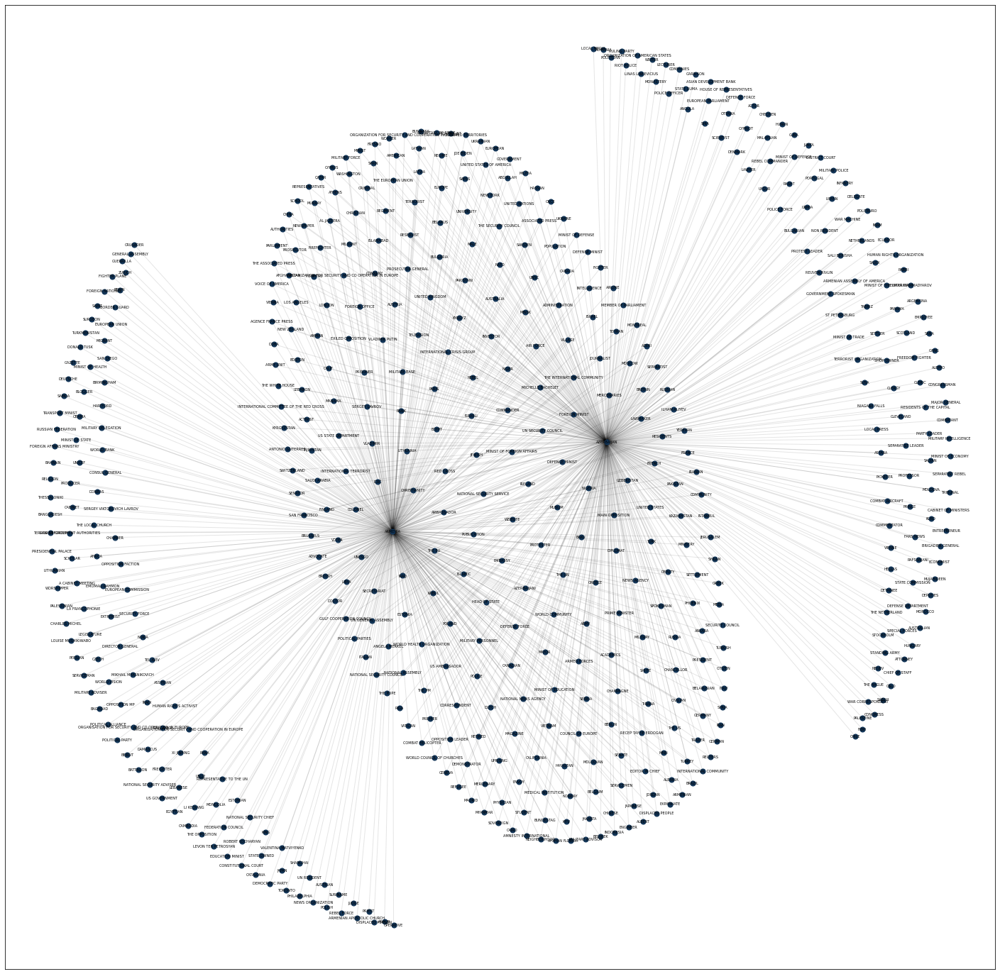

In [7]:
gdeltnetwork = nx.from_pandas_edgelist(gdelt,"Actor1Name","Actor2Name","GoldsteinScale")
pos = nx.kamada_kawai_layout(gdeltnetwork)
nodes = gdeltnetwork.nodes()
fig, axs = plt.subplots(1, 1, figsize=(25,25))
el = nx.draw_networkx_edges(gdeltnetwork, pos, alpha=0.1, ax=axs)
nl = nx.draw_networkx_nodes(gdeltnetwork, pos, nodelist=nodes, node_color='#123456', node_size=50, ax=axs)
ll = nx.draw_networkx_labels(gdeltnetwork, pos, font_size=5, font_family='sans-serif')

<b> Assigning edge labels using Goldstein Score <b>

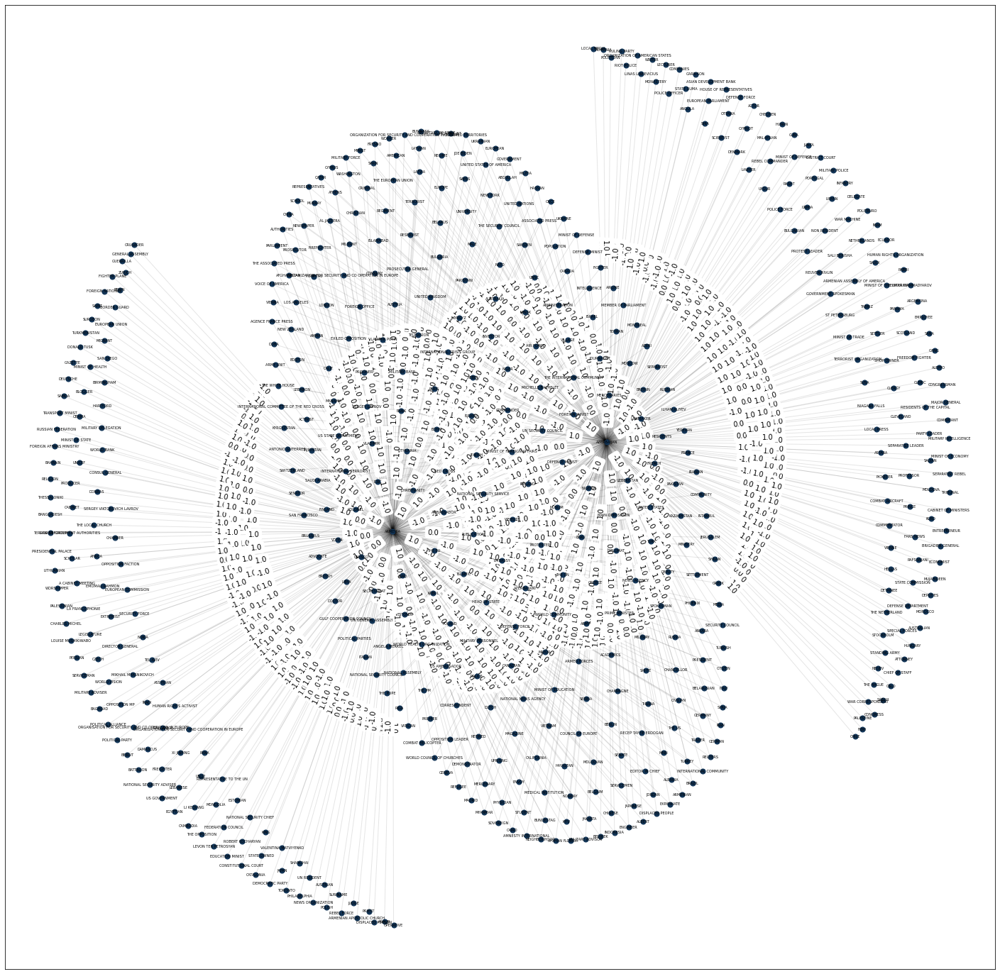

In [8]:
edge_label = {x: gdeltnetwork.edges[x]['GoldsteinScale'] for x in gdeltnetwork.edges}
gdeltnetwork = nx.from_pandas_edgelist(gdelt,"Actor1Name","Actor2Name","GoldsteinScale")
pos = nx.kamada_kawai_layout(gdeltnetwork)
nodes = gdeltnetwork.nodes()
fig, axs = plt.subplots(1, 1, figsize=(25,25))
el = nx.draw_networkx_edges(gdeltnetwork, pos, alpha=0.1, ax=axs)
nl = nx.draw_networkx_nodes(gdeltnetwork, pos, nodelist=nodes, node_color='#123456', node_size=50, ax=axs)
ll = nx.draw_networkx_labels(gdeltnetwork, pos, font_size=5, font_family='sans-serif')
kl = nx.draw_networkx_edge_labels(gdeltnetwork,pos,edge_labels=edge_label)

<b> Getting the triangles from graph and their goldstein score <b>
    

In [9]:
import numpy as np
triangles = [c for c in nx.cycle_basis(gdeltnetwork) if len(c)==3]
triangle_types={}
for triangle in triangles:
    tri=nx.subgraph(gdeltnetwork,triangle)
    #take the product of the edge relationships. If there are an odd number of -1s, the triangle is unbalanced.
    triangle_types[tuple(tri.nodes())]=np.product([x[2]['GoldsteinScale'] for x in tri.edges(data=True)])
print(triangle_types)


{('AZERBAIJAN', 'MICHELLE BACHELET', 'ARMENIA'): 1.0, ('AZERBAIJAN', 'HAYASTAN', 'ARMENIA'): 1.0, ('AZERBAIJAN', 'PHOENIX', 'ARMENIA'): -1.0, ('ENVOY', 'AZERBAIJAN', 'ARMENIA'): -1.0, ('AZERBAIJAN', 'ARMENIA', 'MEDICAL INSTITUTION'): 1.0, ('AZERBAIJAN', 'VOTER', 'ARMENIA'): 0.0, ('AZERBAIJAN', 'MAIN OPPOSITION', 'ARMENIA'): -1.0, ('ATHENS', 'AZERBAIJAN', 'ARMENIA'): -1.0, ('REGIMENT', 'AZERBAIJAN', 'ARMENIA'): -1.0, ('AZERBAIJAN', 'CHANCELLOR', 'ARMENIA'): 1.0, ('AZERBAIJAN', 'TRADER', 'ARMENIA'): 1.0, ('AZERBAIJAN', 'INVESTOR', 'ARMENIA'): -1.0, ('SOVEREIGN', 'AZERBAIJAN', 'ARMENIA'): 1.0, ('IRELAND', 'AZERBAIJAN', 'ARMENIA'): 1.0, ('AZERBAIJAN', 'MARI', 'ARMENIA'): 1.0, ('MONTREAL', 'AZERBAIJAN', 'ARMENIA'): -1.0, ('CHAMPAGNE', 'AZERBAIJAN', 'ARMENIA'): 1.0, ('AZERBAIJAN', 'NEIGHBORHOOD', 'ARMENIA'): 1.0, ('AZERBAIJAN', 'ARMENIA', 'MILITARY ADVISOR'): 1.0, ('AZERBAIJAN', 'ACADEMICS', 'ARMENIA'): 0.0, ('AZERBAIJAN', 'MAYOR', 'ARMENIA'): 1.0, ('PAKISTANI', 'AZERBAIJAN', 'ARMENIA'): -1.

<b>Getting positive and negative triangles of the graph<b>

In [10]:
positive = []
for (i,j) in triangle_types.items():
    if(j==1.0):
        positive.append(j)


negative = []
for (l,k) in triangle_types.items():
    if(k<=0.0):
        negative.append(k)
print('The positive triangles in the complete graph are',positive.count(1.0))
print('The negative triangles in the complete graph are',negative.count(-1.0))




The positive triangles in the complete graph are 152
The negative triangles in the complete graph are 91


In [11]:
nx.triangles(gdeltnetwork)

{'AZERBAIJAN': 304,
 'ARMENIA': 304,
 'DEUTSCHE': 0,
 'SERVICEMEN': 1,
 'ARMENIAN': 1,
 'CIVILIAN': 1,
 'ASIAN DEVELOPMENT BANK': 0,
 'SHIITE': 1,
 'ARMED FORCES': 1,
 'THE US': 1,
 'TURKEY': 1,
 'INTERNATIONAL COMMUNITY': 1,
 'AZERBAIJANI': 1,
 'MILITARY': 1,
 'LOCAL MEDIA': 0,
 'RUSSIA': 1,
 'PRIME MINISTER': 1,
 'REUTERS': 1,
 'GERMAN': 1,
 'GERMANY': 1,
 'IRAN': 1,
 'SYRIA': 1,
 'BELARUSIAN': 1,
 'ITALY': 1,
 'ANKARA': 1,
 'TURKISH': 1,
 'SECURITY COUNCIL': 1,
 'CITIZEN': 1,
 'MEDIA': 1,
 'SYRIAN': 1,
 'SPOKESMAN': 1,
 'GREECE': 1,
 'ARMY': 1,
 'GUERRILLA': 0,
 'PRESIDENT': 1,
 'NEWS AGENCY': 1,
 'SETTLEMENT': 1,
 'BAKU': 1,
 'PROTESTER': 1,
 'BENIN': 0,
 'DEPUTY': 1,
 'UNITED STATES': 1,
 'GREEK': 1,
 'KAZAKHSTAN': 1,
 'NIGERIA': 1,
 'THE UN': 1,
 'TURKMENISTAN': 0,
 'UZBEKISTAN': 1,
 'THE INTERNATIONAL COMMUNITY': 1,
 'TURK': 1,
 'JERUSALEM': 1,
 'MINISTRY': 1,
 'IRANIAN': 1,
 'COMMUNITY': 1,
 'FRANCE': 1,
 'YEREVAN': 1,
 'FRENCH': 1,
 'ILHAM ALIYEV': 1,
 'RESIDENTS': 1,
 'BRITAI

<b>Part b) Investigating network according to days and evaluating balancing states with the upcoming nodes 
    
    &
   Part C) Investigating network w.r.t to 2 theories and conclude results accordingly/prediction by status 
    &     balance<b>


<b>Making graph of 4 OCT 2020<b>

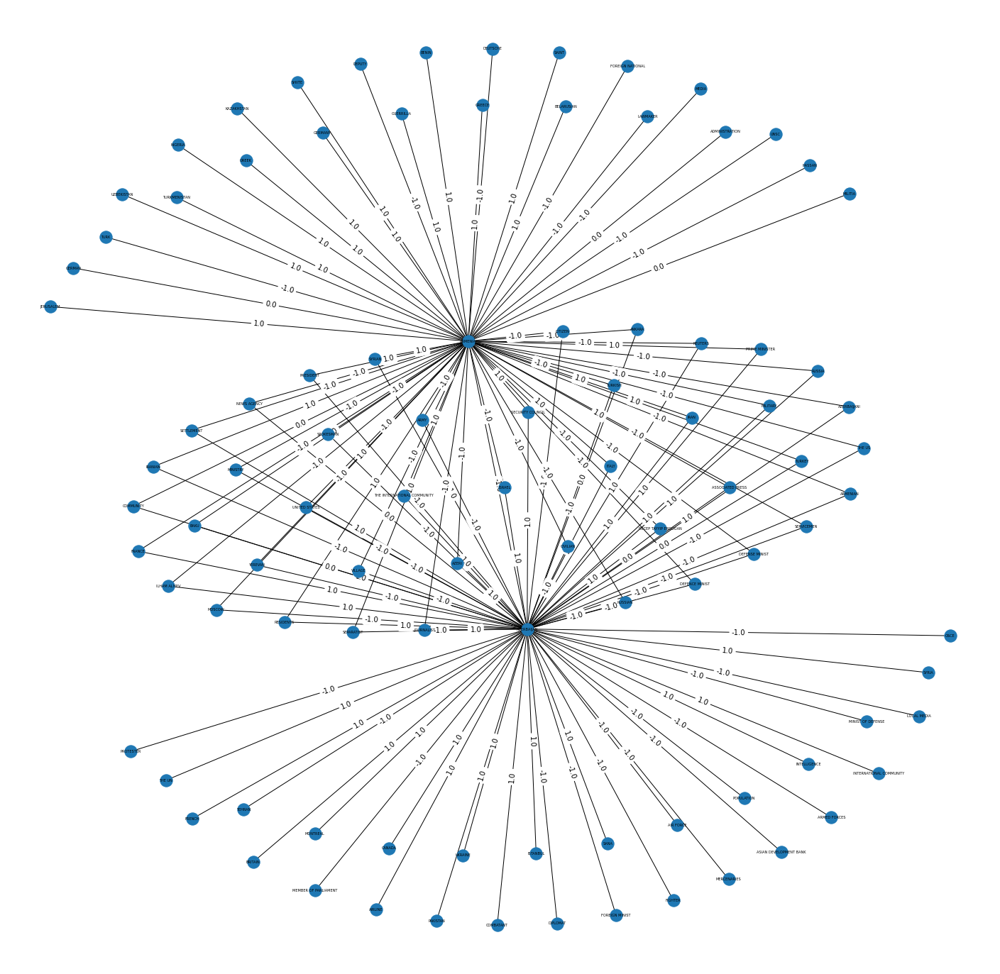

In [12]:
gdelt_day_wise_network = nx.Graph()
gdelt_date = gdelt.loc[gdelt['SQLDATE'] == 20201004]
gdelt_day_wise_network = nx.from_pandas_edgelist(gdelt_date,"Actor1Name","Actor2Name","GoldsteinScale")
pos = nx.kamada_kawai_layout(gdelt_day_wise_network)
nodes = gdelt_day_wise_network.nodes()
fig, axs = plt.subplots(1, 1, figsize=(25,25))
nx.draw(gdelt_day_wise_network,pos)
nx.draw_networkx_labels(gdelt_day_wise_network, pos, font_size=5, font_family='sans-serif')
labels = {e: gdelt_day_wise_network.edges[e]['GoldsteinScale'] for e in gdelt_day_wise_network.edges}
kl = nx.draw_networkx_edge_labels(gdelt_day_wise_network,pos,edge_labels=labels)

<b>Triangles with goldstein score on 4 OCT 2020<b>
    

In [13]:
import numpy as np
triangles = [c for c in nx.cycle_basis(gdelt_day_wise_network) if len(c)==3]
triangle_types={}
for triangle in triangles:
    tri=nx.subgraph(gdelt_day_wise_network,triangle)
    #take the product of the edge relationships. If there are an odd number of -1s, the triangle is unbalanced.
    triangle_types[tuple(tri.nodes())]=np.product([x[2]['GoldsteinScale'] for x in tri.edges(data=True)])
print(triangle_types)
print(tri.edges)


{('RESIDENTS', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('ARMENIA', 'NEWS AGENCY', 'AZERBAIJAN'): 0.0, ('ARMENIA', 'RECEP TAYYIP ERDOGAN', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'ASSOCIATED PRESS', 'AZERBAIJAN'): -0.0, ('ARMENIA', 'DEFENSE MINIST', 'AZERBAIJAN'): -1.0, ('DEFENCE MINIST', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('SPOKESMAN', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('IRANIAN', 'ARMENIA', 'AZERBAIJAN'): 1.0, ('RUSSIAN', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('ARMENIA', 'AZERBAIJAN', 'VILLAGE'): -1.0, ('ARMENIA', 'ISRAEL', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'UNITED STATES', 'AZERBAIJAN'): -1.0, ('SEPARATIST', 'ARMENIA', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'ARMY', 'AZERBAIJAN'): -1.0, ('ARMENIA', 'SETTLEMENT', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'AZERI', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'AZERBAIJAN', 'JOURNALIST'): 1.0, ('ARMENIA', 'MOSCOW', 'AZERBAIJAN'): -1.0, ('ARMENIA', 'ILHAM ALIYEV', 'AZERBAIJAN'): 1.0, ('SYRIAN', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('YEREVAN', 'ARMENIA', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'FRANCE', 'AZERBA

<b>Positive and Negative Triangles on 4 OCT 2020 <b>

In [14]:
positive = []
for (i,j) in triangle_types.items():
    if(j==1.0):
        positive.append(j)


negative = []
for (l,k) in triangle_types.items():
    if(k<=0.0):
        negative.append(k)
print('The positive triangles in the complete graph are',positive.count(1.0))
print('The negative triangles in the complete graph are',negative.count(-1.0))




The positive triangles in the complete graph are 16
The negative triangles in the complete graph are 22


<b>Making graph of 5 OCT 2020<b>

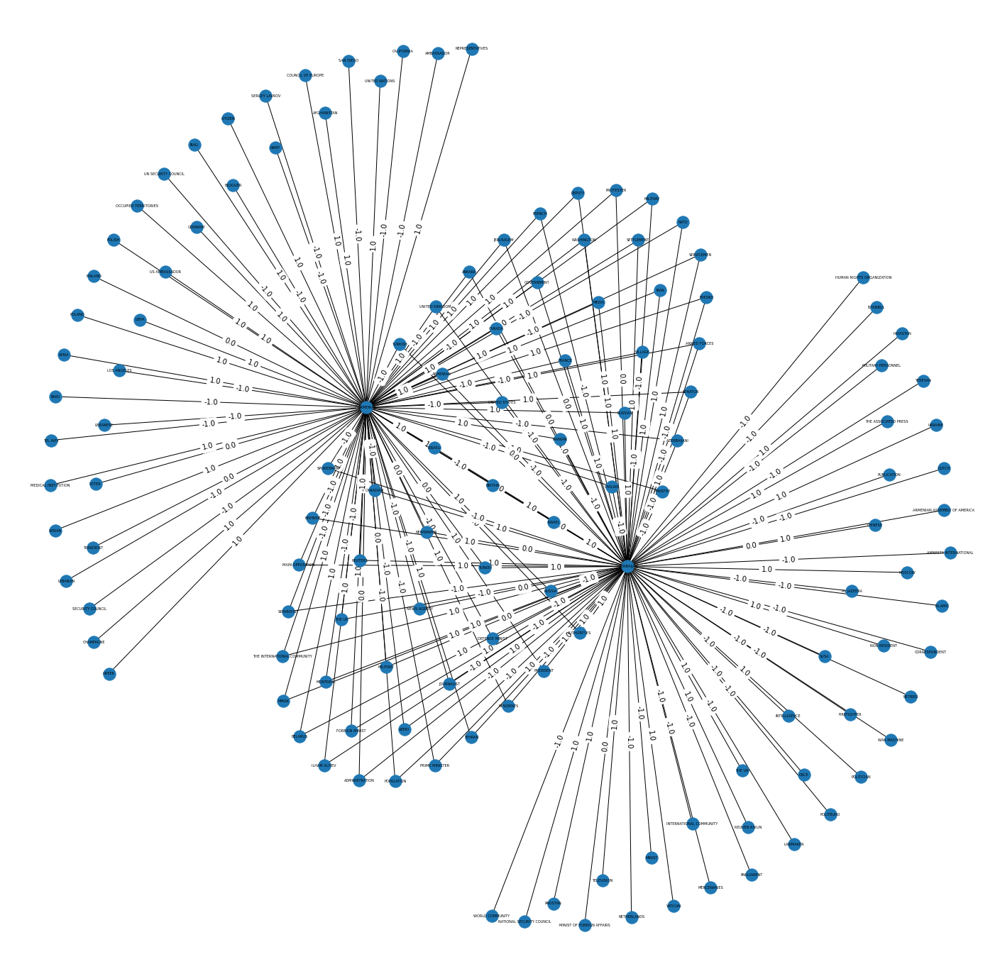

In [15]:
gdelt_day_wise_network_2 = nx.Graph()
gdelt_date = gdelt.loc[gdelt['SQLDATE'] == 20201005]
gdelt_day_wise_network_2 = nx.from_pandas_edgelist(gdelt_date,"Actor1Name","Actor2Name","GoldsteinScale")
pos = nx.kamada_kawai_layout(gdelt_day_wise_network_2)
fig, axs = plt.subplots(1, 1, figsize=(25,25))
nx.draw(gdelt_day_wise_network_2,pos)
nx.draw_networkx_labels(gdelt_day_wise_network_2, pos, font_size=5, font_family='sans-serif')
labels = {e: gdelt_day_wise_network_2.edges[e]['GoldsteinScale'] for e in gdelt_day_wise_network_2.edges}
kl = nx.draw_networkx_edge_labels(gdelt_day_wise_network_2,pos,edge_labels=labels)

<b> Traingles with goldstein score on 5 OCT 2020 <b>

In [16]:
import numpy as np
triangles = [c for c in nx.cycle_basis(gdelt_day_wise_network_2) if len(c)==3]
triangle_types={}
for triangle in triangles:
    tri=nx.subgraph(gdelt_day_wise_network_2,triangle)
    #take the product of the edge relationships. If there are an odd number of -1s, the triangle is unbalanced.
    triangle_types[tuple(tri.nodes())]=np.product([x[2]['GoldsteinScale'] for x in tri.edges(data=True)])
print(triangle_types)



{('ARMENIA', 'NEWS AGENCY', 'AZERBAIJAN'): 0.0, ('ARMENIA', 'ADMINISTRATION', 'AZERBAIJAN'): 0.0, ('ARMENIA', 'AZERI', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'AZERBAIJAN', 'NEWSPAPER'): -0.0, ('ARMENIA', 'CANADIAN', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'REUTERS', 'AZERBAIJAN'): 1.0, ('MINISTRY', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('ARMENIA', 'AUTHORITIES', 'AZERBAIJAN'): 1.0, ('DEFENCE MINIST', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('RESIDENTS', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('ARMENIA', 'MAIN OPPOSITION', 'AZERBAIJAN'): 1.0, ('SPOKESMAN', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('ARMENIA', 'AZERBAIJAN', 'TEHRAN'): 1.0, ('ARMENIA', 'PRIME MINISTER', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'ILHAM ALIYEV', 'AZERBAIJAN'): 1.0, ('MINSK', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('POPULATION', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('ARMENIA', 'AZERBAIJAN', 'JOURNALIST'): -1.0, ('ARMENIA', 'FOREIGN MINIST', 'AZERBAIJAN'): -1.0, ('MONTREAL', 'ARMENIA', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'MILITANT', 'AZERBAIJAN'): -0.0, ('BELARUS', 'ARMENIA', 'AZ

<b> Positive and Negative triangles on 5 Oct 2020 <b>

In [17]:
positive = []
for (i,j) in triangle_types.items():
    if(j==1.0):
        positive.append(j)


negative = []
for (l,k) in triangle_types.items():
    if(k<=0.0):
        negative.append(k)
print('The positive triangles in the complete graph are',positive.count(1.0))
print('The negative triangles in the complete graph are',negative.count(-1.0))




The positive triangles in the complete graph are 24
The negative triangles in the complete graph are 25


<b> Combining both 4 OCT and 5 OCT graph for checking the balancing status <b>

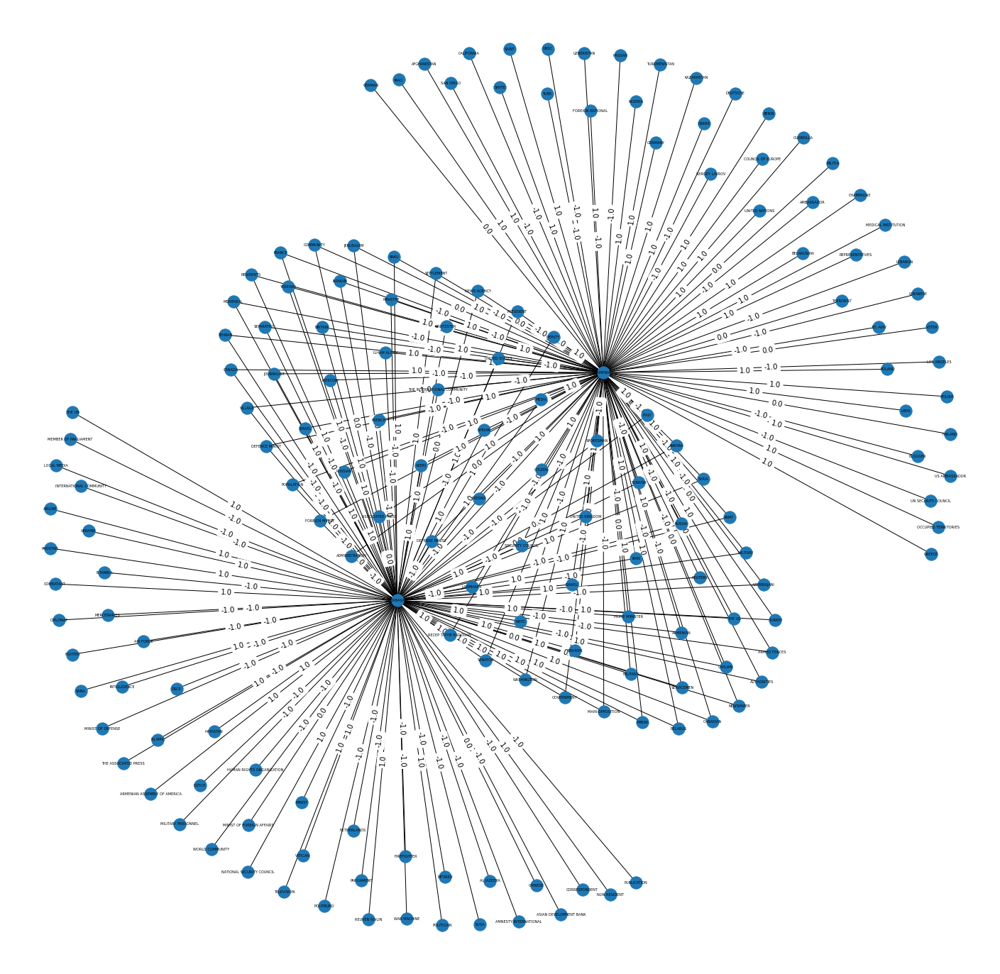

In [18]:
F = nx.compose(gdelt_day_wise_network,gdelt_day_wise_network_2)

pos = nx.kamada_kawai_layout(F)
fig, axs = plt.subplots(1, 1, figsize=(25,25))
nx.draw(F,pos)
nx.draw_networkx_labels(F, pos, font_size=5, font_family='sans-serif')
labels = {e: F.edges[e]['GoldsteinScale'] for e in F.edges}
kl = nx.draw_networkx_edge_labels(F,pos,edge_labels=labels)

<b> Triangles with goldstein score of 4 OCT and 5th OCT combined <b>

In [19]:
import numpy as np
triangles = [c for c in nx.cycle_basis(F) if len(c)==3]
triangle_types={}
for triangle in triangles:
    tri=nx.subgraph(F,triangle)
    #take the product of the edge relationships. If there are an odd number of -1s, the triangle is unbalanced.
    triangle_types[tuple(tri.nodes())]=np.product([x[2]['GoldsteinScale'] for x in tri.edges(data=True)])
print(triangle_types)


{('ARMENIA', 'ADMINISTRATION', 'AZERBAIJAN'): 0.0, ('ARMENIA', 'AZERBAIJAN', 'NEWSPAPER'): -0.0, ('ARMENIA', 'CANADIAN', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'AUTHORITIES', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'MAIN OPPOSITION', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'LAWMAKER', 'AZERBAIJAN'): -1.0, ('MINSK', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('ARMENIA', 'MILITANT', 'AZERBAIJAN'): -0.0, ('BELARUS', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('JERUSALEM', 'ARMENIA', 'AZERBAIJAN'): -0.0, ('ARMENIA', 'BISHKEK', 'AZERBAIJAN'): -1.0, ('ISRAELI', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('UNITED KINGDOM', 'ARMENIA', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'AZERBAIJAN', 'WASHINGTON'): -1.0, ('MEDIA', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('ARMENIA', 'GOVERNMENT', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'DEPUTY', 'AZERBAIJAN'): -1.0, ('ARMENIA', 'NATO', 'AZERBAIJAN'): 1.0, ('ARMENIA', 'FRESNO', 'AZERBAIJAN'): 1.0, ('SENATOR', 'ARMENIA', 'AZERBAIJAN'): -1.0, ('ARMENIA', 'NEWS AGENCY', 'AZERBAIJAN'): 0.0, ('ARMENIA', 'RECEP TAYYIP ERDOGAN', 'AZERBAIJAN'):

<b> Positive and negative triangles of combined 4th and 5th OCT graph<b>

In [20]:
positive = []
for (i,j) in triangle_types.items():
    if(j==1.0):
        positive.append(j)


negative = []
for (l,k) in triangle_types.items():
    if(k<=0.0):
        negative.append(k)
print('The positive triangles in the complete graph are',positive.count(1.0))
print('The negative triangles in the complete graph are',negative.count(-1.0))




The positive triangles in the complete graph are 30
The negative triangles in the complete graph are 31


<b>Part d) Investigating network w.r.t to vote rank algorithm and  predict signs of hidden edge using adamic_adar_index<b>

In [21]:
preds = nx.adamic_adar_index(gdeltnetwork)
for u, v, p in preds:
    print(f"({u}, {v}) -> {p:.8f}")

(DIRECTOR GENERAL, IRAQ) -> 0.16510412
(DIRECTOR GENERAL, RESIDENTS) -> 0.16510412
(DIRECTOR GENERAL, ANTONIO GUTERRES) -> 0.16510412
(DIRECTOR GENERAL, REBEL COMMANDER) -> 0.00000000
(DIRECTOR GENERAL, MILITARY) -> 0.16510412
(DIRECTOR GENERAL, SPECIAL FORCES) -> 0.00000000
(DIRECTOR GENERAL, THE SECURITY COUNCIL) -> 0.16510412
(DIRECTOR GENERAL, MINIST OF FOREIGN AFFAIRS) -> 0.16510412
(DIRECTOR GENERAL, NATO) -> 0.16510412
(DIRECTOR GENERAL, AUTHORITIES) -> 0.16510412
(DIRECTOR GENERAL, FRESNO) -> 0.16510412
(DIRECTOR GENERAL, FOREIGN OFFICE) -> 0.16510412
(DIRECTOR GENERAL, HUMAN RIGHTS ORGANIZATION) -> 0.00000000
(DIRECTOR GENERAL, THE PM) -> 0.16510412
(DIRECTOR GENERAL, LIBYA) -> 0.16510412
(DIRECTOR GENERAL, CATALONIA) -> 0.16510412
(DIRECTOR GENERAL, SETTLEMENT) -> 0.16510412
(DIRECTOR GENERAL, ISRAEL) -> 0.16510412
(DIRECTOR GENERAL, MILITIA) -> 0.16510412
(DIRECTOR GENERAL, SHIITE) -> 0.16510412
(DIRECTOR GENERAL, XI JINPING) -> 0.16510412
(DIRECTOR GENERAL, INVESTOR) -> 0.1

(RESIDENTS, BATTALION) -> 0.16510412
(RESIDENTS, MONASTERY) -> 0.16459968
(RESIDENTS, SAUDI ARABIA) -> 0.32970380
(RESIDENTS, VOTER) -> 0.32970380
(RESIDENTS, MILITARY FORCE) -> 0.32970380
(RESIDENTS, ASSOCIATED PRESS) -> 0.32970380
(RESIDENTS, OCCUPIED TERRITORIES) -> 0.32970380
(RESIDENTS, POLITICIAN) -> 0.16459968
(RESIDENTS, LOUISE MUSHIKIWABO) -> 0.16510412
(RESIDENTS, TURKEY) -> 0.32970380
(RESIDENTS, BAHRAIN) -> 0.16510412
(RESIDENTS, CHAMPAGNE) -> 0.32970380
(RESIDENTS, REFUGEE) -> 0.32970380
(RESIDENTS, AIR FORCE) -> 0.32970380
(RESIDENTS, HOSPITAL) -> 0.32970380
(RESIDENTS, LINAS LINKEVICIUS) -> 0.16459968
(RESIDENTS, WAR CORRESPONDENT) -> 0.16459968
(RESIDENTS, PARLIAMENT) -> 0.32970380
(RESIDENTS, HUNAN) -> 0.16459968
(RESIDENTS, CHANCELLOR) -> 0.32970380
(RESIDENTS, FLORIDA) -> 0.32970380
(RESIDENTS, MAJOR GENERAL) -> 0.16459968
(RESIDENTS, ABDULLAH) -> 0.32970380
(RESIDENTS, CITIZEN) -> 0.32970380
(RESIDENTS, HEAD OF STATE) -> 0.32970380
(RESIDENTS, CAMBODIA) -> 0.1651041

(MILITARY, REGIMENT) -> 0.32970380
(MILITARY, PRESIDENT) -> 0.32970380
(MILITARY, SCHOOL) -> 0.32970380
(MILITARY, HUNGARY) -> 0.16459968
(MILITARY, RUSSIAN) -> 0.32970380
(MILITARY, FREIGHTER) -> 0.16510412
(MILITARY, TERRORIST ORGANIZATION) -> 0.16459968
(MILITARY, MAIN OPPOSITION) -> 0.32970380
(MILITARY, LOCAL PRESS) -> 0.16459968
(MILITARY, ARMY) -> 0.32970380
(MILITARY, ILHAM ALIYEV) -> 0.32970380
(MILITARY, PALESTINIAN) -> 0.16510412
(MILITARY, AFGHAN) -> 0.32970380
(MILITARY, BRITISH) -> 0.32970380
(MILITARY, MURRAY) -> 0.32970380
(MILITARY, LI KEQIANG) -> 0.16510412
(MILITARY, EMOMALI RAHMON) -> 0.16510412
(MILITARY, JAKARTA) -> 0.32970380
(MILITARY, ADVOCATE) -> 0.32970380
(MILITARY, SCHOLAR) -> 0.16510412
(MILITARY, WORSHIPPER) -> 0.16510412
(MILITARY, PERSIAN) -> 0.16510412
(MILITARY, COMMANDER) -> 0.32970380
(MILITARY, POLICE FORCE) -> 0.16459968
(MILITARY, TABRIZ) -> 0.16459968
(MILITARY, SAUDI) -> 0.16459968
(MILITARY, REPRESENTATIVES) -> 0.32970380
(MILITARY, ALBERT) ->

(THE SECURITY COUNCIL, SAUDI ARABIA) -> 0.32970380
(THE SECURITY COUNCIL, VOTER) -> 0.32970380
(THE SECURITY COUNCIL, MILITARY FORCE) -> 0.32970380
(THE SECURITY COUNCIL, ASSOCIATED PRESS) -> 0.32970380
(THE SECURITY COUNCIL, OCCUPIED TERRITORIES) -> 0.32970380
(THE SECURITY COUNCIL, POLITICIAN) -> 0.16459968
(THE SECURITY COUNCIL, LOUISE MUSHIKIWABO) -> 0.16510412
(THE SECURITY COUNCIL, TURKEY) -> 0.32970380
(THE SECURITY COUNCIL, BAHRAIN) -> 0.16510412
(THE SECURITY COUNCIL, CHAMPAGNE) -> 0.32970380
(THE SECURITY COUNCIL, REFUGEE) -> 0.32970380
(THE SECURITY COUNCIL, AIR FORCE) -> 0.32970380
(THE SECURITY COUNCIL, HOSPITAL) -> 0.32970380
(THE SECURITY COUNCIL, LINAS LINKEVICIUS) -> 0.16459968
(THE SECURITY COUNCIL, WAR CORRESPONDENT) -> 0.16459968
(THE SECURITY COUNCIL, PARLIAMENT) -> 0.32970380
(THE SECURITY COUNCIL, HUNAN) -> 0.16459968
(THE SECURITY COUNCIL, CHANCELLOR) -> 0.32970380
(THE SECURITY COUNCIL, FLORIDA) -> 0.32970380
(THE SECURITY COUNCIL, MAJOR GENERAL) -> 0.16459968


(AUTHORITIES, EUROPEAN PARLIAMENT) -> 0.16459968
(AUTHORITIES, UKRAINIAN) -> 0.32970380
(AUTHORITIES, STATE DUMA) -> 0.16459968
(AUTHORITIES, DEMOCRATIC PARTY) -> 0.16510412
(AUTHORITIES, GOVERNMENT) -> 0.32970380
(AUTHORITIES, MINIST OF DEFENCE) -> 0.16459968
(AUTHORITIES, AUSTRALIAN) -> 0.16459968
(AUTHORITIES, ORGANIZATION OF AMERICAN STATES) -> 0.16459968
(AUTHORITIES, ASIAN DEVELOPMENT BANK) -> 0.16459968
(AUTHORITIES, JEWISH) -> 0.32970380
(AUTHORITIES, EUROPE) -> 0.32970380
(AUTHORITIES, BUSINESS) -> 0.32970380
(AUTHORITIES, RELIGION) -> 0.16510412
(AUTHORITIES, ENVOY) -> 0.32970380
(AUTHORITIES, SERGEY VIKTOROVICH LAVROV) -> 0.16510412
(AUTHORITIES, HAYASTAN) -> 0.32970380
(AUTHORITIES, JOE BIDEN) -> 0.32970380
(AUTHORITIES, DEFENSE FORCE) -> 0.32970380
(AUTHORITIES, WORLD COUNCIL OF CHURCHES) -> 0.32970380
(AUTHORITIES, KURD) -> 0.16459968
(AUTHORITIES, UN SECURITY COUNCIL) -> 0.32970380
(AUTHORITIES, SECURITY FORCE) -> 0.16510412
(AUTHORITIES, SENATOR) -> 0.32970380
(AUTHORIT

(HUMAN RIGHTS ORGANIZATION, PRESIDENTIAL PALACE) -> 0.00000000
(HUMAN RIGHTS ORGANIZATION, LOS ANGELES) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, WORLD BANK) -> 0.00000000
(HUMAN RIGHTS ORGANIZATION, ASSYRIAN) -> 0.00000000
(HUMAN RIGHTS ORGANIZATION, HASSAN) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, GAZETTE) -> 0.00000000
(HUMAN RIGHTS ORGANIZATION, UNITED STATES OF AMERICA) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, CHINA) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, DELEGATE) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, UNITED KINGDOM) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, AMMAN) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, RASHT) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, LEGISLATURE) -> 0.00000000
(HUMAN RIGHTS ORGANIZATION, CLERGY) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, CONGRESS) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, SUSA) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, SHIA) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, PORTUGAL) -> 0.16459968
(HUMAN RIGHTS ORGANIZATION, MOLDOVA) -> 0.164

(LIBYA, POLAND) -> 0.32970380
(LIBYA, SPAIN) -> 0.32970380
(LIBYA, ORGANIZATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.32970380
(LIBYA, OPERATIVE) -> 0.16510412
(LIBYA, BRITAIN) -> 0.32970380
(LIBYA, VOICE OF AMERICA) -> 0.32970380
(LIBYA, HELLAS) -> 0.16459968
(LIBYA, GOVERNMENT SPOKESMAN) -> 0.16459968
(LIBYA, TORONTO) -> 0.16510412
(LIBYA, FRENCH) -> 0.32970380
(LIBYA, MINIST OF STATE) -> 0.16510412
(LIBYA, SEPARATIST) -> 0.32970380
(LIBYA, TELEVISION) -> 0.32970380
(LIBYA, OTTAWA) -> 0.16459968
(LIBYA, MILITARY PERSONNEL) -> 0.32970380
(LIBYA, PREMIER) -> 0.32970380
(LIBYA, LEVON TER PETROSYAN) -> 0.16510412
(LIBYA, VIENNA) -> 0.32970380
(LIBYA, UKRAINE) -> 0.32970380
(LIBYA, SRI LANKA) -> 0.16510412
(LIBYA, SYRIA) -> 0.32970380
(LIBYA, THESSALONIKI) -> 0.16510412
(LIBYA, EDUCATION MINIST) -> 0.16510412
(LIBYA, ASTARA) -> 0.16459968
(LIBYA, NETHERLANDS) -> 0.16459968
(LIBYA, ARGENTINA) -> 0.16459968
(LIBYA, STANDING ARMY) -> 0.16459968
(LIBYA, JUDGE) -> 0.16510412
(LIBYA, ST

(ISRAEL, WORKER) -> 0.32970380
(ISRAEL, IRAQI) -> 0.16510412
(ISRAEL, ATHENS) -> 0.32970380
(ISRAEL, RECEP TAYYIP ERDOGAN) -> 0.32970380
(ISRAEL, EGYPT) -> 0.32970380
(ISRAEL, MILITARY DELEGATION) -> 0.16510412
(ISRAEL, MIGRANT) -> 0.16510412
(ISRAEL, AMBASSADOR) -> 0.32970380
(ISRAEL, SHANGHAI) -> 0.16510412
(ISRAEL, AUSTRIAN) -> 0.16510412
(ISRAEL, MILITARY ADVISER) -> 0.16510412
(ISRAEL, DEFENSE MINIST) -> 0.32970380
(ISRAEL, OPPOSITION FACTION) -> 0.16510412
(ISRAEL, JAPANESE) -> 0.32970380
(ISRAEL, CRIMINAL) -> 0.32970380
(ISRAEL, WASHINGTON) -> 0.32970380
(ISRAEL, PHYSICIAN) -> 0.32970380
(ISRAEL, STATE OWNED) -> 0.16510412
(ISRAEL, GERMANY) -> 0.32970380
(ISRAEL, NOKIA) -> 0.16510412
(ISRAEL, CONSTITUTIONAL COURT) -> 0.16510412
(ISRAEL, A CABINET MEETING) -> 0.16510412
(ISRAEL, SAN FRANCISCO) -> 0.32970380
(ISRAEL, CHRISTIAN) -> 0.32970380
(ISRAEL, MADRID) -> 0.32970380
(ISRAEL, ARMENIAN) -> 0.32970380
(ISRAEL, POLISH) -> 0.16510412
(ISRAEL, SURGEON) -> 0.16510412
(ISRAEL, IRANI

(XI JINPING, BEIRUT) -> 0.16510412
(XI JINPING, FARS NEWS) -> 0.00000000
(XI JINPING, ASHUR) -> 0.16510412
(XI JINPING, MONTREAL) -> 0.16510412
(XI JINPING, ITALY) -> 0.16510412
(XI JINPING, TIRANA) -> 0.16510412
(XI JINPING, UN GENERAL ASSEMBLY) -> 0.16510412
(XI JINPING, CZECH) -> 0.16510412
(XI JINPING, POLICE OFFICER) -> 0.00000000
(XI JINPING, UNITED NATIONS) -> 0.16510412
(XI JINPING, EUROPEAN) -> 0.16510412
(XI JINPING, COMPANIES) -> 0.00000000
(XI JINPING, OPPOSITION LEADER) -> 0.16510412
(XI JINPING, JERUSALEM) -> 0.16510412
(XI JINPING, REUVEN RIVLIN) -> 0.00000000
(XI JINPING, ALBANIA) -> 0.16510412
(XI JINPING, MILITANT) -> 0.16510412
(XI JINPING, LOCAL MEDIA) -> 0.00000000
(XI JINPING, MEDIA) -> 0.16510412
(XI JINPING, DIPLOMAT) -> 0.16510412
(XI JINPING, EUROPEAN COMMISSION) -> 0.16510412
(XI JINPING, FEDERATION COUNCIL) -> 0.16510412
(XI JINPING, SCIENTIST) -> 0.00000000
(XI JINPING, SALI BERISHA) -> 0.00000000
(XI JINPING, FINLAND) -> 0.16510412
(XI JINPING, EXTREMIST) 

(CYPRUS, HASSAN) -> 0.32970380
(CYPRUS, GAZETTE) -> 0.16510412
(CYPRUS, UNITED STATES OF AMERICA) -> 0.32970380
(CYPRUS, CHINA) -> 0.32970380
(CYPRUS, DELEGATE) -> 0.16459968
(CYPRUS, UNITED KINGDOM) -> 0.32970380
(CYPRUS, AMMAN) -> 0.32970380
(CYPRUS, RASHT) -> 0.16459968
(CYPRUS, LEGISLATURE) -> 0.16510412
(CYPRUS, CLERGY) -> 0.16459968
(CYPRUS, CONGRESS) -> 0.16459968
(CYPRUS, SUSA) -> 0.16459968
(CYPRUS, SHIA) -> 0.16459968
(CYPRUS, PORTUGAL) -> 0.16459968
(CYPRUS, MOLDOVA) -> 0.16459968
(CYPRUS, RETIRED) -> 0.32970380
(CYPRUS, ESTONIAN) -> 0.16510412
(CYPRUS, ACTOR) -> 0.16459968
(CYPRUS, MONGOLIA) -> 0.16510412
(CYPRUS, NATIONAL SECURITY CHIEF) -> 0.16510412
(CYPRUS, BLOGGER) -> 0.16510412
(CYPRUS, THE UN) -> 0.32970380
(CYPRUS, MOROCCO) -> 0.16459968
(CYPRUS, MEDICAL INSTITUTION) -> 0.32970380
(CYPRUS, LAWMAKER) -> 0.32970380
(CYPRUS, ENGINEER) -> 0.32970380
(CYPRUS, MEMBER OF PARLIAMENT) -> 0.32970380
(CYPRUS, BANGLADESH) -> 0.16510412
(CYPRUS, BORDER GUARD) -> 0.16510412
(CYPR

(ACTIVIST, SCOTLAND) -> 0.16459968
(ACTIVIST, RUSSIAN FEDERATION) -> 0.16510412
(ACTIVIST, POLITICAL ALLIANCE) -> 0.16510412
(ACTIVIST, MANAMA) -> 0.32970380
(ACTIVIST, SURINAME) -> 0.16510412
(ACTIVIST, CALIF) -> 0.32970380
(ACTIVIST, LONDON) -> 0.32970380
(ACTIVIST, FOREIGN AFFAIRS MINISTRY) -> 0.16510412
(ACTIVIST, MILITARY POLICE) -> 0.16459968
(ACTIVIST, INTERNATIONAL CRISIS GROUP) -> 0.32970380
(ACTIVIST, ANGOLA) -> 0.16459968
(ACTIVIST, US AMBASSADOR) -> 0.32970380
(ACTIVIST, PALESTINE) -> 0.16459968
(ACTIVIST, DEUTSCHE) -> 0.16510412
(ACTIVIST, SERVICEMEN) -> 0.32970380
(ACTIVIST, EXPATRIATE) -> 0.32970380
(ACTIVIST, SETTLER) -> 0.16459968
(ACTIVIST, MINIST) -> 0.32970380
(ACTIVIST, FRANCE) -> 0.32970380
(ACTIVIST, RED CROSS) -> 0.32970380
(ACTIVIST, NEWS AGENCY) -> 0.32970380
(ACTIVIST, CONGRESSMAN) -> 0.16459968
(ACTIVIST, URMIA) -> 0.16459968
(ACTIVIST, DOCTOR) -> 0.32970380
(ACTIVIST, INTERNATIONAL COMMITTEE OF THE RED CROSS) -> 0.32970380
(ACTIVIST, PARTY LEADER) -> 0.1645

(HARTFORD, UKRAINIAN) -> 0.16510412
(HARTFORD, STATE DUMA) -> 0.00000000
(HARTFORD, DEMOCRATIC PARTY) -> 0.16510412
(HARTFORD, GOVERNMENT) -> 0.16510412
(HARTFORD, MINIST OF DEFENCE) -> 0.00000000
(HARTFORD, AUSTRALIAN) -> 0.00000000
(HARTFORD, ORGANIZATION OF AMERICAN STATES) -> 0.00000000
(HARTFORD, ASIAN DEVELOPMENT BANK) -> 0.00000000
(HARTFORD, JEWISH) -> 0.16510412
(HARTFORD, EUROPE) -> 0.16510412
(HARTFORD, BUSINESS) -> 0.16510412
(HARTFORD, RELIGION) -> 0.16510412
(HARTFORD, ENVOY) -> 0.16510412
(HARTFORD, SERGEY VIKTOROVICH LAVROV) -> 0.16510412
(HARTFORD, HAYASTAN) -> 0.16510412
(HARTFORD, JOE BIDEN) -> 0.16510412
(HARTFORD, DEFENSE FORCE) -> 0.16510412
(HARTFORD, WORLD COUNCIL OF CHURCHES) -> 0.16510412
(HARTFORD, KURD) -> 0.00000000
(HARTFORD, UN SECURITY COUNCIL) -> 0.16510412
(HARTFORD, SECURITY FORCE) -> 0.16510412
(HARTFORD, SENATOR) -> 0.16510412
(HARTFORD, ECUADOR) -> 0.00000000
(HARTFORD, AUSTRIA) -> 0.16510412
(HARTFORD, NEW ZEALAND) -> 0.16510412
(HARTFORD, THE EUR

(NIGERIA, CHAMPAGNE) -> 0.32970380
(NIGERIA, REFUGEE) -> 0.32970380
(NIGERIA, AIR FORCE) -> 0.32970380
(NIGERIA, HOSPITAL) -> 0.32970380
(NIGERIA, LINAS LINKEVICIUS) -> 0.16459968
(NIGERIA, WAR CORRESPONDENT) -> 0.16459968
(NIGERIA, PARLIAMENT) -> 0.32970380
(NIGERIA, HUNAN) -> 0.16459968
(NIGERIA, CHANCELLOR) -> 0.32970380
(NIGERIA, FLORIDA) -> 0.32970380
(NIGERIA, MAJOR GENERAL) -> 0.16459968
(NIGERIA, ABDULLAH) -> 0.32970380
(NIGERIA, CITIZEN) -> 0.32970380
(NIGERIA, HEAD OF STATE) -> 0.32970380
(NIGERIA, CAMBODIA) -> 0.16510412
(NIGERIA, PROTEST LEADER) -> 0.16459968
(NIGERIA, SAMOA) -> 0.16510412
(NIGERIA, UNESCO) -> 0.32970380
(NIGERIA, RAFSANJANI) -> 0.16459968
(NIGERIA, MUSLIM) -> 0.32970380
(NIGERIA, MINIST OF THE INTERIOR) -> 0.16459968
(NIGERIA, MINSK) -> 0.32970380
(NIGERIA, VLADIMIR PUTIN) -> 0.32970380
(NIGERIA, BRUSSELS) -> 0.32970380
(NIGERIA, ANGELA MERKEL) -> 0.32970380
(SECRETARY OF STATE, COMBAT HELICOPTER) -> 0.32970380
(SECRETARY OF STATE, CHECHEN) -> 0.16459968
(

(CHECHEN, FREEDOM FIGHTER) -> 0.16459968
(CHECHEN, MIKHAIL MYASNIKOVICH) -> 0.00000000
(CHECHEN, GREECE) -> 0.16459968
(CHECHEN, IRELAND) -> 0.16459968
(CHECHEN, SECRETARIAT) -> 0.16459968
(CHECHEN, BRAZIL) -> 0.16459968
(CHECHEN, UNDP) -> 0.00000000
(CHECHEN, STATE COMMISSION) -> 0.16459968
(CHECHEN, PROSECUTOR GENERAL) -> 0.16459968
(CHECHEN, REBEL) -> 0.16459968
(CHECHEN, MARI) -> 0.16459968
(CHECHEN, FIREFIGHTER) -> 0.16459968
(CHECHEN, WRITER) -> 0.16459968
(CHECHEN, TAJIKISTAN) -> 0.16459968
(CHECHEN, BANK) -> 0.16459968
(CHECHEN, BENIN) -> 0.00000000
(CHECHEN, INFANTRY) -> 0.16459968
(CHECHEN, REBEL FORCE) -> 0.00000000
(CHECHEN, DONBAS) -> 0.00000000
(CHECHEN, ROBERT KOCHARYAN) -> 0.00000000
(CHECHEN, FIGHTER PLANE) -> 0.00000000
(CHECHEN, RANA) -> 0.00000000
(CHECHEN, COMPANY) -> 0.16459968
(CHECHEN, TEL AVIV) -> 0.00000000
(CHECHEN, DAMASCUS) -> 0.00000000
(CHECHEN, ESTONIA) -> 0.16459968
(CHECHEN, COUNCIL OF EUROPE) -> 0.16459968
(CHECHEN, LAW ENFORCEMENT AUTHORITIES) -> 0.0

(EMBASSY, CHRISTIAN) -> 0.32970380
(EMBASSY, MADRID) -> 0.32970380
(EMBASSY, ARMENIAN) -> 0.32970380
(EMBASSY, POLISH) -> 0.16510412
(EMBASSY, SURGEON) -> 0.16510412
(EMBASSY, IRANIAN) -> 0.32970380
(EMBASSY, CALIFORNIA) -> 0.32970380
(EMBASSY, BELARUS) -> 0.32970380
(EMBASSY, ENTREPRENEUR) -> 0.16459968
(EMBASSY, NATIONAL SECURITY SERVICE) -> 0.32970380
(EMBASSY, DOHA) -> 0.32970380
(EMBASSY, KABUL) -> 0.32970380
(EMBASSY, GENERAL ASSEMBLY) -> 0.16510412
(EMBASSY, CIVILIAN) -> 0.32970380
(EMBASSY, THE POPE) -> 0.32970380
(EMBASSY, BAKU) -> 0.32970380
(EMBASSY, LEBANESE) -> 0.16510412
(EMBASSY, RESIDENTS OF THE CAPITAL) -> 0.16459968
(EMBASSY, ISRAELI) -> 0.32970380
(EMBASSY, DISPLACED PEOPLE) -> 0.32970380
(EMBASSY, COMBATANT) -> 0.16459968
(EMBASSY, RIOT POLICE) -> 0.16459968
(EMBASSY, CLERIC) -> 0.16459968
(EMBASSY, RABBI) -> 0.16459968
(EMBASSY, BIRMINGHAM) -> 0.16510412
(EMBASSY, ROMANIA) -> 0.16459968
(EMBASSY, ISLAMIC) -> 0.32970380
(EMBASSY, CAIRO) -> 0.32970380
(EMBASSY, COMBA

(DEFENSE DEPARTMENT, BERLIN) -> 0.16459968
(DEFENSE DEPARTMENT, FIDH) -> 0.16459968
(DEFENSE DEPARTMENT, CHRISTIANITY) -> 0.16459968
(DEFENSE DEPARTMENT, UPRISING) -> 0.16459968
(DEFENSE DEPARTMENT, ICRC) -> 0.16459968
(DEFENSE DEPARTMENT, TERRORIST GROUP) -> 0.00000000
(DEFENSE DEPARTMENT, AGENCE FRANCE PRESS) -> 0.16459968
(DEFENSE DEPARTMENT, THE INTERNATIONAL COMMUNITY) -> 0.16459968
(DEFENSE DEPARTMENT, SANA) -> 0.16459968
(DEFENSE DEPARTMENT, ARMED FORCES) -> 0.16459968
(DEFENSE DEPARTMENT, NATIONAL ASSEMBLY) -> 0.16459968
(DEFENSE DEPARTMENT, MOSCOW) -> 0.16459968
(DEFENSE DEPARTMENT, PRISONER) -> 0.16459968
(DEFENSE DEPARTMENT, OSCE) -> 0.16459968
(DEFENSE DEPARTMENT, CUBA) -> 0.16459968
(DEFENSE DEPARTMENT, JORDAN) -> 0.16459968
(DEFENSE DEPARTMENT, COMMENTATOR) -> 0.16459968
(DEFENSE DEPARTMENT, INDONESIA) -> 0.16459968
(DEFENSE DEPARTMENT, AZERBAIJANI) -> 0.16459968
(DEFENSE DEPARTMENT, AMERICAN) -> 0.16459968
(DEFENSE DEPARTMENT, UYGUR) -> 0.16459968
(DEFENSE DEPARTMENT, DE

(SWITZERLAND, NETHERLANDS) -> 0.16459968
(SWITZERLAND, ARGENTINA) -> 0.16459968
(SWITZERLAND, STANDING ARMY) -> 0.16459968
(SWITZERLAND, JUDGE) -> 0.16510412
(SWITZERLAND, STUDENT) -> 0.32970380
(SWITZERLAND, ACADEMICS) -> 0.32970380
(SWITZERLAND, OBAMA) -> 0.16510412
(SWITZERLAND, POLITBURO) -> 0.16459968
(SWITZERLAND, ALEPPO) -> 0.16459968
(SWITZERLAND, PRIEST) -> 0.16510412
(SWITZERLAND, BAGHDAD) -> 0.16510412
(SWITZERLAND, SCOTLAND) -> 0.16459968
(SWITZERLAND, RUSSIAN FEDERATION) -> 0.16510412
(SWITZERLAND, POLITICAL ALLIANCE) -> 0.16510412
(SWITZERLAND, MANAMA) -> 0.32970380
(SWITZERLAND, SURINAME) -> 0.16510412
(SWITZERLAND, CALIF) -> 0.32970380
(SWITZERLAND, LONDON) -> 0.32970380
(SWITZERLAND, FOREIGN AFFAIRS MINISTRY) -> 0.16510412
(SWITZERLAND, MILITARY POLICE) -> 0.16459968
(SWITZERLAND, INTERNATIONAL CRISIS GROUP) -> 0.32970380
(SWITZERLAND, ANGOLA) -> 0.16459968
(SWITZERLAND, US AMBASSADOR) -> 0.32970380
(SWITZERLAND, PALESTINE) -> 0.16459968
(SWITZERLAND, DEUTSCHE) -> 0.16

(WORLD HEALTH ORGANIZATION, GREEK) -> 0.32970380
(WORLD HEALTH ORGANIZATION, GENEVA) -> 0.32970380
(WORLD HEALTH ORGANIZATION, PRODUCER) -> 0.16510412
(WORLD HEALTH ORGANIZATION, LEBANON) -> 0.32970380
(WORLD HEALTH ORGANIZATION, CHIEF OF STAFF) -> 0.16459968
(WORLD HEALTH ORGANIZATION, JAPAN) -> 0.16510412
(WORLD HEALTH ORGANIZATION, POLAND) -> 0.32970380
(WORLD HEALTH ORGANIZATION, SPAIN) -> 0.32970380
(WORLD HEALTH ORGANIZATION, ORGANIZATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.32970380
(WORLD HEALTH ORGANIZATION, OPERATIVE) -> 0.16510412
(WORLD HEALTH ORGANIZATION, BRITAIN) -> 0.32970380
(WORLD HEALTH ORGANIZATION, VOICE OF AMERICA) -> 0.32970380
(WORLD HEALTH ORGANIZATION, HELLAS) -> 0.16459968
(WORLD HEALTH ORGANIZATION, GOVERNMENT SPOKESMAN) -> 0.16459968
(WORLD HEALTH ORGANIZATION, TORONTO) -> 0.16510412
(WORLD HEALTH ORGANIZATION, FRENCH) -> 0.32970380
(WORLD HEALTH ORGANIZATION, MINIST OF STATE) -> 0.16510412
(WORLD HEALTH ORGANIZATION, SEPARATIST) -> 0.32970380
(WOR

(LOS ANGELES, DONALD TUSK) -> 0.16510412
(LOS ANGELES, NON RESIDENT) -> 0.16459968
(LOS ANGELES, WORKER) -> 0.32970380
(LOS ANGELES, IRAQI) -> 0.16510412
(LOS ANGELES, ATHENS) -> 0.32970380
(LOS ANGELES, RECEP TAYYIP ERDOGAN) -> 0.32970380
(LOS ANGELES, EGYPT) -> 0.32970380
(LOS ANGELES, MILITARY DELEGATION) -> 0.16510412
(LOS ANGELES, FREEDOM FIGHTER) -> 0.16459968
(LOS ANGELES, MIGRANT) -> 0.16510412
(LOS ANGELES, AMBASSADOR) -> 0.32970380
(LOS ANGELES, MIKHAIL MYASNIKOVICH) -> 0.16510412
(LOS ANGELES, GREECE) -> 0.32970380
(LOS ANGELES, IRELAND) -> 0.32970380
(LOS ANGELES, SHANGHAI) -> 0.16510412
(LOS ANGELES, SECRETARIAT) -> 0.32970380
(LOS ANGELES, BRAZIL) -> 0.32970380
(LOS ANGELES, UNDP) -> 0.16510412
(LOS ANGELES, AUSTRIAN) -> 0.16510412
(LOS ANGELES, STATE COMMISSION) -> 0.16459968
(LOS ANGELES, PROSECUTOR GENERAL) -> 0.32970380
(LOS ANGELES, MILITARY ADVISER) -> 0.16510412
(LOS ANGELES, REBEL) -> 0.32970380
(LOS ANGELES, MARI) -> 0.32970380
(LOS ANGELES, DEFENSE MINIST) -> 0.

(HASSAN, GENEVA) -> 0.32970380
(HASSAN, EXILED OPPOSITION) -> 0.32970380
(HASSAN, BEIRUT) -> 0.16510412
(HASSAN, PRODUCER) -> 0.16510412
(HASSAN, LEBANON) -> 0.32970380
(HASSAN, FARS NEWS) -> 0.16459968
(HASSAN, ASHUR) -> 0.16510412
(HASSAN, CHIEF OF STAFF) -> 0.16459968
(HASSAN, MONTREAL) -> 0.32970380
(HASSAN, ITALY) -> 0.32970380
(HASSAN, TIRANA) -> 0.32970380
(HASSAN, UN GENERAL ASSEMBLY) -> 0.32970380
(HASSAN, JAPAN) -> 0.16510412
(HASSAN, CZECH) -> 0.16510412
(HASSAN, POLAND) -> 0.32970380
(HASSAN, POLICE OFFICER) -> 0.16459968
(HASSAN, SPAIN) -> 0.32970380
(HASSAN, UNITED NATIONS) -> 0.32970380
(HASSAN, ORGANIZATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.32970380
(HASSAN, EUROPEAN) -> 0.32970380
(HASSAN, COMPANIES) -> 0.16459968
(HASSAN, OPPOSITION LEADER) -> 0.32970380
(HASSAN, OPERATIVE) -> 0.16510412
(HASSAN, BRITAIN) -> 0.32970380
(HASSAN, JERUSALEM) -> 0.32970380
(HASSAN, VOICE OF AMERICA) -> 0.32970380
(HASSAN, REUVEN RIVLIN) -> 0.16459968
(HASSAN, HELLAS) -> 0.1645

(CHINA, NETHERLANDS) -> 0.16459968
(CHINA, ARGENTINA) -> 0.16459968
(CHINA, VIENNE) -> 0.16459968
(CHINA, OSLO) -> 0.16459968
(CHINA, MINIST OF EDUCATION) -> 0.32970380
(CHINA, STANDING ARMY) -> 0.16459968
(CHINA, SERBIA) -> 0.32970380
(CHINA, MOLDOVAN) -> 0.32970380
(CHINA, UNITED STATES) -> 0.32970380
(CHINA, JUDGE) -> 0.16510412
(CHINA, STUDENT) -> 0.32970380
(CHINA, MAGAZINE) -> 0.32970380
(CHINA, GERMAN) -> 0.32970380
(CHINA, SENATE) -> 0.32970380
(CHINA, MERCENARIES) -> 0.32970380
(CHINA, AZERI) -> 0.32970380
(CHINA, MALE) -> 0.32970380
(CHINA, NATIONAL SECURITY ADVISER) -> 0.16510412
(CHINA, REPRESENTATIVE TO THE UN) -> 0.16510412
(CHINA, SHOP OWNER) -> 0.16459968
(CHINA, ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE) -> 0.32970380
(CHINA, ACADEMICS) -> 0.32970380
(CHINA, OBAMA) -> 0.16510412
(CHINA, INTERNATIONAL COMMUNITY) -> 0.32970380
(CHINA, BERLIN) -> 0.32970380
(CHINA, POLITBURO) -> 0.16459968
(CHINA, FIDH) -> 0.16459968
(CHINA, ALEPPO) -> 0.16459968
(CHINA, CHRISTI

(AMMAN, BAGHDAD) -> 0.16510412
(AMMAN, TERRORIST GROUP) -> 0.16510412
(AMMAN, AGENCE FRANCE PRESS) -> 0.32970380
(AMMAN, SCOTLAND) -> 0.16459968
(AMMAN, THE INTERNATIONAL COMMUNITY) -> 0.32970380
(AMMAN, RUSSIAN FEDERATION) -> 0.16510412
(AMMAN, POLITICAL ALLIANCE) -> 0.16510412
(AMMAN, SANA) -> 0.16459968
(AMMAN, MANAMA) -> 0.32970380
(AMMAN, ARMED FORCES) -> 0.32970380
(AMMAN, NATIONAL ASSEMBLY) -> 0.32970380
(AMMAN, SURINAME) -> 0.16510412
(AMMAN, CALIF) -> 0.32970380
(AMMAN, LONDON) -> 0.32970380
(AMMAN, MOSCOW) -> 0.32970380
(AMMAN, FOREIGN AFFAIRS MINISTRY) -> 0.16510412
(AMMAN, PRISONER) -> 0.32970380
(AMMAN, OSCE) -> 0.32970380
(AMMAN, CUBA) -> 0.16459968
(AMMAN, JORDAN) -> 0.32970380
(AMMAN, MILITARY POLICE) -> 0.16459968
(AMMAN, INTERNATIONAL CRISIS GROUP) -> 0.32970380
(AMMAN, ANGOLA) -> 0.16459968
(AMMAN, US AMBASSADOR) -> 0.32970380
(AMMAN, COMMENTATOR) -> 0.16459968
(AMMAN, INDONESIA) -> 0.32970380
(AMMAN, PALESTINE) -> 0.16459968
(AMMAN, DEUTSCHE) -> 0.16510412
(AMMAN, S

(CLERGY, STUDENT) -> 0.16459968
(CLERGY, MAGAZINE) -> 0.16459968
(CLERGY, GERMAN) -> 0.16459968
(CLERGY, SENATE) -> 0.16459968
(CLERGY, MERCENARIES) -> 0.16459968
(CLERGY, AZERI) -> 0.16459968
(CLERGY, MALE) -> 0.16459968
(CLERGY, NATIONAL SECURITY ADVISER) -> 0.00000000
(CLERGY, REPRESENTATIVE TO THE UN) -> 0.00000000
(CLERGY, SHOP OWNER) -> 0.16459968
(CLERGY, ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE) -> 0.16459968
(CLERGY, ACADEMICS) -> 0.16459968
(CLERGY, OBAMA) -> 0.00000000
(CLERGY, INTERNATIONAL COMMUNITY) -> 0.16459968
(CLERGY, BERLIN) -> 0.16459968
(CLERGY, POLITBURO) -> 0.16459968
(CLERGY, FIDH) -> 0.16459968
(CLERGY, ALEPPO) -> 0.16459968
(CLERGY, CHRISTIANITY) -> 0.16459968
(CLERGY, UPRISING) -> 0.16459968
(CLERGY, PRIEST) -> 0.00000000
(CLERGY, ICRC) -> 0.16459968
(CLERGY, BAGHDAD) -> 0.00000000
(CLERGY, TERRORIST GROUP) -> 0.00000000
(CLERGY, AGENCE FRANCE PRESS) -> 0.16459968
(CLERGY, SCOTLAND) -> 0.16459968
(CLERGY, THE INTERNATIONAL COMMUNITY) -> 0.16459968


(SHIA, NATIONAL ASSEMBLY) -> 0.16459968
(SHIA, SURINAME) -> 0.00000000
(SHIA, CALIF) -> 0.16459968
(SHIA, LONDON) -> 0.16459968
(SHIA, MOSCOW) -> 0.16459968
(SHIA, FOREIGN AFFAIRS MINISTRY) -> 0.00000000
(SHIA, PRISONER) -> 0.16459968
(SHIA, OSCE) -> 0.16459968
(SHIA, CUBA) -> 0.16459968
(SHIA, JORDAN) -> 0.16459968
(SHIA, MILITARY POLICE) -> 0.16459968
(SHIA, INTERNATIONAL CRISIS GROUP) -> 0.16459968
(SHIA, ANGOLA) -> 0.16459968
(SHIA, US AMBASSADOR) -> 0.16459968
(SHIA, COMMENTATOR) -> 0.16459968
(SHIA, INDONESIA) -> 0.16459968
(SHIA, PALESTINE) -> 0.16459968
(SHIA, DEUTSCHE) -> 0.00000000
(SHIA, SERVICEMEN) -> 0.16459968
(SHIA, AZERBAIJANI) -> 0.16459968
(SHIA, EXPATRIATE) -> 0.16459968
(SHIA, SETTLER) -> 0.16459968
(SHIA, MINIST) -> 0.16459968
(SHIA, FRANCE) -> 0.16459968
(SHIA, AMERICAN) -> 0.16459968
(SHIA, UYGUR) -> 0.16459968
(SHIA, DEFENCE FORCE) -> 0.16459968
(SHIA, DEFENCE MINIST) -> 0.16459968
(SHIA, MINISTRY) -> 0.16459968
(SHIA, KYRGYZ) -> 0.16459968
(SHIA, ATTORNEY) -> 0

(RETIRED, PRIEST) -> 0.16510412
(RETIRED, ICRC) -> 0.32970380
(RETIRED, BAGHDAD) -> 0.16510412
(RETIRED, TERRORIST GROUP) -> 0.16510412
(RETIRED, AGENCE FRANCE PRESS) -> 0.32970380
(RETIRED, SCOTLAND) -> 0.16459968
(RETIRED, THE INTERNATIONAL COMMUNITY) -> 0.32970380
(RETIRED, RUSSIAN FEDERATION) -> 0.16510412
(RETIRED, POLITICAL ALLIANCE) -> 0.16510412
(RETIRED, SANA) -> 0.16459968
(RETIRED, MANAMA) -> 0.32970380
(RETIRED, ARMED FORCES) -> 0.32970380
(RETIRED, NATIONAL ASSEMBLY) -> 0.32970380
(RETIRED, SURINAME) -> 0.16510412
(RETIRED, CALIF) -> 0.32970380
(RETIRED, LONDON) -> 0.32970380
(RETIRED, MOSCOW) -> 0.32970380
(RETIRED, FOREIGN AFFAIRS MINISTRY) -> 0.16510412
(RETIRED, PRISONER) -> 0.32970380
(RETIRED, OSCE) -> 0.32970380
(RETIRED, CUBA) -> 0.16459968
(RETIRED, JORDAN) -> 0.32970380
(RETIRED, MILITARY POLICE) -> 0.16459968
(RETIRED, INTERNATIONAL CRISIS GROUP) -> 0.32970380
(RETIRED, ANGOLA) -> 0.16459968
(RETIRED, US AMBASSADOR) -> 0.32970380
(RETIRED, COMMENTATOR) -> 0.1645

(MONGOLIA, VIETNAM) -> 0.16510412
(MONGOLIA, TRANSPORT MINIST) -> 0.16510412
(MONGOLIA, CONGRESSMAN) -> 0.00000000
(MONGOLIA, URMIA) -> 0.00000000
(MONGOLIA, DOCTOR) -> 0.16510412
(MONGOLIA, INTERNATIONAL COMMITTEE OF THE RED CROSS) -> 0.16510412
(MONGOLIA, PARTY LEADER) -> 0.00000000
(MONGOLIA, PRINCE) -> 0.00000000
(MONGOLIA, KING) -> 0.16510412
(MONGOLIA, NEWS ORGANIZATION) -> 0.16510412
(MONGOLIA, MILITARY BASE) -> 0.16510412
(MONGOLIA, THE EU) -> 0.16510412
(MONGOLIA, GULF COOPERATION COUNCIL) -> 0.16510412
(MONGOLIA, DONALD TUSK) -> 0.16510412
(MONGOLIA, NON RESIDENT) -> 0.00000000
(MONGOLIA, WORKER) -> 0.16510412
(MONGOLIA, IRAQI) -> 0.16510412
(MONGOLIA, ATHENS) -> 0.16510412
(MONGOLIA, RECEP TAYYIP ERDOGAN) -> 0.16510412
(MONGOLIA, EGYPT) -> 0.16510412
(MONGOLIA, MILITARY DELEGATION) -> 0.16510412
(MONGOLIA, FREEDOM FIGHTER) -> 0.00000000
(MONGOLIA, MIGRANT) -> 0.16510412
(MONGOLIA, AMBASSADOR) -> 0.16510412
(MONGOLIA, MIKHAIL MYASNIKOVICH) -> 0.16510412
(MONGOLIA, GREECE) -> 

(MOROCCO, QATAR) -> 0.16459968
(MOROCCO, FIGHTER JET) -> 0.16459968
(MOROCCO, CABINET) -> 0.00000000
(MOROCCO, WAR MACHINE) -> 0.16459968
(MOROCCO, AFGHANISTAN) -> 0.16459968
(MOROCCO, REGIME) -> 0.16459968
(MOROCCO, ISTANBUL) -> 0.16459968
(MOROCCO, LECTURER) -> 0.16459968
(MOROCCO, SOVEREIGN) -> 0.16459968
(MOROCCO, CANADIAN) -> 0.16459968
(MOROCCO, WORLD COMMUNITY) -> 0.16459968
(MOROCCO, GARRISON) -> 0.16459968
(MOROCCO, DISPLACED PERSON) -> 0.00000000
(MOROCCO, SPOKESMAN) -> 0.16459968
(MOROCCO, YEREVAN) -> 0.16459968
(MOROCCO, CONSUL GENERAL) -> 0.00000000
(MOROCCO, AUSTRALIA) -> 0.16459968
(MOROCCO, RESERVIST) -> 0.16459968
(MOROCCO, TERRORIST) -> 0.16459968
(MOROCCO, SERGEY LAVROV) -> 0.16459968
(MOROCCO, HOUSE OF REPRESENTATIVES) -> 0.16459968
(MOROCCO, NEIGHBORHOOD) -> 0.16459968
(MOROCCO, RULING PARTY) -> 0.16459968
(MOROCCO, BRIGADIER GENERAL) -> 0.16459968
(MOROCCO, IRAN) -> 0.16459968
(MOROCCO, MAYOR) -> 0.16459968
(MOROCCO, NATIONAL SECURITY COUNCIL) -> 0.16459968
(MOROC

(ENGINEER, WORKER) -> 0.32970380
(ENGINEER, IRAQI) -> 0.16510412
(ENGINEER, ATHENS) -> 0.32970380
(ENGINEER, RECEP TAYYIP ERDOGAN) -> 0.32970380
(ENGINEER, EGYPT) -> 0.32970380
(ENGINEER, MILITARY DELEGATION) -> 0.16510412
(ENGINEER, FREEDOM FIGHTER) -> 0.16459968
(ENGINEER, MIGRANT) -> 0.16510412
(ENGINEER, AMBASSADOR) -> 0.32970380
(ENGINEER, MIKHAIL MYASNIKOVICH) -> 0.16510412
(ENGINEER, GREECE) -> 0.32970380
(ENGINEER, IRELAND) -> 0.32970380
(ENGINEER, SHANGHAI) -> 0.16510412
(ENGINEER, SECRETARIAT) -> 0.32970380
(ENGINEER, BRAZIL) -> 0.32970380
(ENGINEER, UNDP) -> 0.16510412
(ENGINEER, AUSTRIAN) -> 0.16510412
(ENGINEER, STATE COMMISSION) -> 0.16459968
(ENGINEER, PROSECUTOR GENERAL) -> 0.32970380
(ENGINEER, MILITARY ADVISER) -> 0.16510412
(ENGINEER, REBEL) -> 0.32970380
(ENGINEER, MARI) -> 0.32970380
(ENGINEER, DEFENSE MINIST) -> 0.32970380
(ENGINEER, FIREFIGHTER) -> 0.32970380
(ENGINEER, WRITER) -> 0.16459968
(ENGINEER, OPPOSITION FACTION) -> 0.16510412
(ENGINEER, JAPANESE) -> 0.3

(BORDER GUARD, JAPAN) -> 0.16510412
(BORDER GUARD, CZECH) -> 0.16510412
(BORDER GUARD, POLAND) -> 0.16510412
(BORDER GUARD, POLICE OFFICER) -> 0.00000000
(BORDER GUARD, SPAIN) -> 0.16510412
(BORDER GUARD, UNITED NATIONS) -> 0.16510412
(BORDER GUARD, ORGANIZATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.16510412
(BORDER GUARD, EUROPEAN) -> 0.16510412
(BORDER GUARD, COMPANIES) -> 0.00000000
(BORDER GUARD, OPPOSITION LEADER) -> 0.16510412
(BORDER GUARD, OPERATIVE) -> 0.16510412
(BORDER GUARD, BRITAIN) -> 0.16510412
(BORDER GUARD, JERUSALEM) -> 0.16510412
(BORDER GUARD, VOICE OF AMERICA) -> 0.16510412
(BORDER GUARD, REUVEN RIVLIN) -> 0.00000000
(BORDER GUARD, HELLAS) -> 0.00000000
(BORDER GUARD, GOVERNMENT SPOKESMAN) -> 0.00000000
(BORDER GUARD, TORONTO) -> 0.16510412
(BORDER GUARD, FRENCH) -> 0.16510412
(BORDER GUARD, ALBANIA) -> 0.16510412
(BORDER GUARD, MINIST OF STATE) -> 0.16510412
(BORDER GUARD, SEPARATIST) -> 0.16510412
(BORDER GUARD, MILITANT) -> 0.16510412
(BORDER GUARD, LOCA

(CABINET, NEWS ORGANIZATION) -> 0.16510412
(CABINET, MILITARY BASE) -> 0.16510412
(CABINET, THE EU) -> 0.16510412
(CABINET, GULF COOPERATION COUNCIL) -> 0.16510412
(CABINET, DONALD TUSK) -> 0.16510412
(CABINET, NON RESIDENT) -> 0.00000000
(CABINET, WORKER) -> 0.16510412
(CABINET, IRAQI) -> 0.16510412
(CABINET, ATHENS) -> 0.16510412
(CABINET, RECEP TAYYIP ERDOGAN) -> 0.16510412
(CABINET, EGYPT) -> 0.16510412
(CABINET, MILITARY DELEGATION) -> 0.16510412
(CABINET, FREEDOM FIGHTER) -> 0.00000000
(CABINET, MIGRANT) -> 0.16510412
(CABINET, AMBASSADOR) -> 0.16510412
(CABINET, MIKHAIL MYASNIKOVICH) -> 0.16510412
(CABINET, GREECE) -> 0.16510412
(CABINET, IRELAND) -> 0.16510412
(CABINET, SHANGHAI) -> 0.16510412
(CABINET, SECRETARIAT) -> 0.16510412
(CABINET, BRAZIL) -> 0.16510412
(CABINET, UNDP) -> 0.16510412
(CABINET, AUSTRIAN) -> 0.16510412
(CABINET, STATE COMMISSION) -> 0.00000000
(CABINET, PROSECUTOR GENERAL) -> 0.16510412
(CABINET, MILITARY ADVISER) -> 0.16510412
(CABINET, REBEL) -> 0.165104

(SOVEREIGN, TAJIKISTAN) -> 0.32970380
(SOVEREIGN, BANK) -> 0.32970380
(SOVEREIGN, WASHINGTON) -> 0.32970380
(SOVEREIGN, PHYSICIAN) -> 0.32970380
(SOVEREIGN, BENIN) -> 0.16510412
(SOVEREIGN, INFANTRY) -> 0.16459968
(SOVEREIGN, REBEL FORCE) -> 0.16510412
(SOVEREIGN, STATE OWNED) -> 0.16510412
(SOVEREIGN, DONBAS) -> 0.16510412
(SOVEREIGN, ROBERT KOCHARYAN) -> 0.16510412
(SOVEREIGN, FIGHTER PLANE) -> 0.16510412
(SOVEREIGN, RANA) -> 0.16510412
(SOVEREIGN, GERMANY) -> 0.32970380
(SOVEREIGN, NOKIA) -> 0.16510412
(SOVEREIGN, COMPANY) -> 0.32970380
(SOVEREIGN, TEL AVIV) -> 0.16510412
(SOVEREIGN, CONSTITUTIONAL COURT) -> 0.16510412
(SOVEREIGN, DAMASCUS) -> 0.16510412
(SOVEREIGN, ESTONIA) -> 0.32970380
(SOVEREIGN, COUNCIL OF EUROPE) -> 0.32970380
(SOVEREIGN, LAW ENFORCEMENT AUTHORITIES) -> 0.16510412
(SOVEREIGN, A CABINET MEETING) -> 0.16510412
(SOVEREIGN, SAN FRANCISCO) -> 0.32970380
(SOVEREIGN, CHRISTIAN) -> 0.32970380
(SOVEREIGN, UN RESIDENT) -> 0.16510412
(SOVEREIGN, UNIVERSITY) -> 0.32970380

(RESERVIST, TRADER) -> 0.32970380
(RESERVIST, POLICE FORCE) -> 0.16459968
(RESERVIST, TABRIZ) -> 0.16459968
(RESERVIST, SAUDI) -> 0.16459968
(RESERVIST, SWISS) -> 0.32970380
(RESERVIST, CRUSADER) -> 0.16510412
(RESERVIST, MERCENARY) -> 0.32970380
(RESERVIST, MINIST OF DEFENSE) -> 0.32970380
(RESERVIST, REPRESENTATIVES) -> 0.32970380
(RESERVIST, CYPRIOT) -> 0.16459968
(RESERVIST, ALBERT) -> 0.32970380
(RESERVIST, VALENTINA MATVIYENKO) -> 0.16510412
(RESERVIST, GREEK) -> 0.32970380
(RESERVIST, GENEVA) -> 0.32970380
(RESERVIST, EXILED OPPOSITION) -> 0.32970380
(RESERVIST, BEIRUT) -> 0.16510412
(RESERVIST, PRODUCER) -> 0.16510412
(RESERVIST, LEBANON) -> 0.32970380
(RESERVIST, FARS NEWS) -> 0.16459968
(RESERVIST, ASHUR) -> 0.16510412
(RESERVIST, CHIEF OF STAFF) -> 0.16459968
(RESERVIST, MONTREAL) -> 0.32970380
(RESERVIST, ITALY) -> 0.32970380
(RESERVIST, TIRANA) -> 0.32970380
(RESERVIST, UN GENERAL ASSEMBLY) -> 0.32970380
(RESERVIST, JAPAN) -> 0.16510412
(RESERVIST, CZECH) -> 0.16510412
(RE

(RULING PARTY, DEFENSE MINIST) -> 0.16459968
(RULING PARTY, FIREFIGHTER) -> 0.16459968
(RULING PARTY, WRITER) -> 0.16459968
(RULING PARTY, OPPOSITION FACTION) -> 0.00000000
(RULING PARTY, JAPANESE) -> 0.16459968
(RULING PARTY, CRIMINAL) -> 0.16459968
(RULING PARTY, TAJIKISTAN) -> 0.16459968
(RULING PARTY, BANK) -> 0.16459968
(RULING PARTY, WASHINGTON) -> 0.16459968
(RULING PARTY, PHYSICIAN) -> 0.16459968
(RULING PARTY, BENIN) -> 0.00000000
(RULING PARTY, INFANTRY) -> 0.16459968
(RULING PARTY, REBEL FORCE) -> 0.00000000
(RULING PARTY, STATE OWNED) -> 0.00000000
(RULING PARTY, DONBAS) -> 0.00000000
(RULING PARTY, ROBERT KOCHARYAN) -> 0.00000000
(RULING PARTY, FIGHTER PLANE) -> 0.00000000
(RULING PARTY, RANA) -> 0.00000000
(RULING PARTY, GERMANY) -> 0.16459968
(RULING PARTY, NOKIA) -> 0.00000000
(RULING PARTY, COMPANY) -> 0.16459968
(RULING PARTY, TEL AVIV) -> 0.00000000
(RULING PARTY, CONSTITUTIONAL COURT) -> 0.00000000
(RULING PARTY, DAMASCUS) -> 0.00000000
(RULING PARTY, ESTONIA) -> 0.

(MUJAHIDEEN, MERCENARY) -> 0.16459968
(MUJAHIDEEN, MINIST OF DEFENSE) -> 0.16459968
(MUJAHIDEEN, REPRESENTATIVES) -> 0.16459968
(MUJAHIDEEN, CYPRIOT) -> 0.16459968
(MUJAHIDEEN, ALBERT) -> 0.16459968
(MUJAHIDEEN, VALENTINA MATVIYENKO) -> 0.00000000
(MUJAHIDEEN, GREEK) -> 0.16459968
(MUJAHIDEEN, GENEVA) -> 0.16459968
(MUJAHIDEEN, EXILED OPPOSITION) -> 0.16459968
(MUJAHIDEEN, BEIRUT) -> 0.00000000
(MUJAHIDEEN, PRODUCER) -> 0.00000000
(MUJAHIDEEN, LEBANON) -> 0.16459968
(MUJAHIDEEN, FARS NEWS) -> 0.16459968
(MUJAHIDEEN, ASHUR) -> 0.00000000
(MUJAHIDEEN, CHIEF OF STAFF) -> 0.16459968
(MUJAHIDEEN, MONTREAL) -> 0.16459968
(MUJAHIDEEN, ITALY) -> 0.16459968
(MUJAHIDEEN, TIRANA) -> 0.16459968
(MUJAHIDEEN, UN GENERAL ASSEMBLY) -> 0.16459968
(MUJAHIDEEN, JAPAN) -> 0.00000000
(MUJAHIDEEN, CZECH) -> 0.00000000
(MUJAHIDEEN, POLAND) -> 0.16459968
(MUJAHIDEEN, POLICE OFFICER) -> 0.16459968
(MUJAHIDEEN, SPAIN) -> 0.16459968
(MUJAHIDEEN, UNITED NATIONS) -> 0.16459968
(MUJAHIDEEN, ORGANIZATION FOR SECURIT

(REGIMENT, STATE COMMISSION) -> 0.16459968
(REGIMENT, PROSECUTOR GENERAL) -> 0.32970380
(REGIMENT, MILITARY ADVISER) -> 0.16510412
(REGIMENT, REBEL) -> 0.32970380
(REGIMENT, MARI) -> 0.32970380
(REGIMENT, DEFENSE MINIST) -> 0.32970380
(REGIMENT, FIREFIGHTER) -> 0.32970380
(REGIMENT, WRITER) -> 0.16459968
(REGIMENT, OPPOSITION FACTION) -> 0.16510412
(REGIMENT, JAPANESE) -> 0.32970380
(REGIMENT, CRIMINAL) -> 0.32970380
(REGIMENT, TAJIKISTAN) -> 0.32970380
(REGIMENT, BANK) -> 0.32970380
(REGIMENT, WASHINGTON) -> 0.32970380
(REGIMENT, PHYSICIAN) -> 0.32970380
(REGIMENT, BENIN) -> 0.16510412
(REGIMENT, INFANTRY) -> 0.16459968
(REGIMENT, REBEL FORCE) -> 0.16510412
(REGIMENT, STATE OWNED) -> 0.16510412
(REGIMENT, DONBAS) -> 0.16510412
(REGIMENT, ROBERT KOCHARYAN) -> 0.16510412
(REGIMENT, FIGHTER PLANE) -> 0.16510412
(REGIMENT, RANA) -> 0.16510412
(REGIMENT, GERMANY) -> 0.32970380
(REGIMENT, NOKIA) -> 0.16510412
(REGIMENT, COMPANY) -> 0.32970380
(REGIMENT, TEL AVIV) -> 0.16510412
(REGIMENT, CO

(HUNGARY, EUROPEAN COMMISSION) -> 0.00000000
(HUNGARY, FEDERATION COUNCIL) -> 0.00000000
(HUNGARY, TELEVISION) -> 0.16459968
(HUNGARY, SCIENTIST) -> 0.16459968
(HUNGARY, OTTAWA) -> 0.16459968
(HUNGARY, SALI BERISHA) -> 0.16459968
(HUNGARY, FINLAND) -> 0.16459968
(HUNGARY, EXTREMIST) -> 0.00000000
(HUNGARY, MILITARY PERSONNEL) -> 0.16459968
(HUNGARY, PREMIER) -> 0.16459968
(HUNGARY, LIBYAN) -> 0.16459968
(HUNGARY, LEVON TER PETROSYAN) -> 0.00000000
(HUNGARY, WORLD VISION) -> 0.00000000
(HUNGARY, COMMUNITY) -> 0.16459968
(HUNGARY, VIENNA) -> 0.16459968
(HUNGARY, UKRAINE) -> 0.16459968
(HUNGARY, NEWSPAPER) -> 0.16459968
(HUNGARY, SRI LANKA) -> 0.00000000
(HUNGARY, SYRIA) -> 0.16459968
(HUNGARY, THESSALONIKI) -> 0.00000000
(HUNGARY, EDUCATION MINIST) -> 0.00000000
(HUNGARY, CABINET OF MINISTERS) -> 0.16459968
(HUNGARY, ZURICH) -> 0.00000000
(HUNGARY, ASTARA) -> 0.16459968
(HUNGARY, NETHERLANDS) -> 0.16459968
(HUNGARY, ARGENTINA) -> 0.16459968
(HUNGARY, VIENNE) -> 0.16459968
(HUNGARY, OSLO)

(TERRORIST ORGANIZATION, DEPUTIES) -> 0.16459968
(TERRORIST ORGANIZATION, NATIONAL SECURITY SERVICE) -> 0.16459968
(TERRORIST ORGANIZATION, DOHA) -> 0.16459968
(TERRORIST ORGANIZATION, KABUL) -> 0.16459968
(TERRORIST ORGANIZATION, ORGANISATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.00000000
(TERRORIST ORGANIZATION, GENERAL ASSEMBLY) -> 0.00000000
(TERRORIST ORGANIZATION, LATVIAN) -> 0.16459968
(TERRORIST ORGANIZATION, CIVILIAN) -> 0.16459968
(TERRORIST ORGANIZATION, BISHKEK) -> 0.16459968
(TERRORIST ORGANIZATION, BOSTON) -> 0.16459968
(TERRORIST ORGANIZATION, THE POPE) -> 0.16459968
(TERRORIST ORGANIZATION, COLONEL) -> 0.16459968
(TERRORIST ORGANIZATION, BAKU) -> 0.16459968
(TERRORIST ORGANIZATION, LEBANESE) -> 0.00000000
(TERRORIST ORGANIZATION, RESIDENTS OF THE CAPITAL) -> 0.16459968
(TERRORIST ORGANIZATION, PRIME MINISTER) -> 0.16459968
(TERRORIST ORGANIZATION, ECONOMIST) -> 0.16459968
(TERRORIST ORGANIZATION, MILITARY INTELLIGENCE) -> 0.16459968
(TERRORIST ORGANIZATION, OPPO

(ARMY, ECONOMIST) -> 0.16459968
(ARMY, MILITARY INTELLIGENCE) -> 0.16459968
(ARMY, OPPOSITION MP) -> 0.16510412
(ARMY, THE WHITE HOUSE) -> 0.32970380
(ARMY, US STATE DEPARTMENT) -> 0.32970380
(ARMY, ISRAELI) -> 0.32970380
(ARMY, KYRGYZSTAN) -> 0.32970380
(ARMY, DISPLACED PEOPLE) -> 0.32970380
(ARMY, COMBATANT) -> 0.16459968
(ARMY, KAZAKHSTAN) -> 0.32970380
(ARMY, POPULATION) -> 0.32970380
(ARMY, RIOT POLICE) -> 0.16459968
(ARMY, CLERIC) -> 0.16459968
(ARMY, RABBI) -> 0.16459968
(ARMY, GANG) -> 0.16459968
(ARMY, TURKISH) -> 0.32970380
(ARMY, BATTALION) -> 0.16510412
(ARMY, BIRMINGHAM) -> 0.16510412
(ARMY, ROMANIA) -> 0.16459968
(ARMY, ISLAMIC) -> 0.32970380
(ARMY, CAIRO) -> 0.32970380
(ARMY, COMBAT AIRCRAFT) -> 0.16459968
(ARMY, INTERNATIONAL TERRORIST) -> 0.32970380
(ARMY, MONASTERY) -> 0.16459968
(ARMY, SAUDI ARABIA) -> 0.32970380
(ARMY, VOTER) -> 0.32970380
(ARMY, MILITARY FORCE) -> 0.32970380
(ARMY, ASSOCIATED PRESS) -> 0.32970380
(ARMY, OCCUPIED TERRITORIES) -> 0.32970380
(ARMY, PO

(AFGHAN, MYANMAR) -> 0.32970380
(AFGHAN, AIRLINE) -> 0.32970380
(AFGHAN, MINIST OF HEALTH) -> 0.16510412
(AFGHAN, MUSLIM) -> 0.32970380
(AFGHAN, DISTRICT COURT) -> 0.16459968
(AFGHAN, MICHELLE BACHELET) -> 0.32970380
(AFGHAN, MINIST OF THE INTERIOR) -> 0.16459968
(AFGHAN, MINSK) -> 0.32970380
(AFGHAN, VLADIMIR PUTIN) -> 0.32970380
(AFGHAN, KYIV) -> 0.32970380
(AFGHAN, BRUSSELS) -> 0.32970380
(AFGHAN, REUTERS) -> 0.32970380
(AFGHAN, ANGELA MERKEL) -> 0.32970380
(AFGHAN, BULGARIA) -> 0.32970380
(AFGHAN, IMAM) -> 0.16459968
(BRITISH, EUROPEAN PARLIAMENT) -> 0.16459968
(BRITISH, UKRAINIAN) -> 0.32970380
(BRITISH, STATE DUMA) -> 0.16459968
(BRITISH, DEMOCRATIC PARTY) -> 0.16510412
(BRITISH, GOVERNMENT) -> 0.32970380
(BRITISH, MINIST OF DEFENCE) -> 0.16459968
(BRITISH, AUSTRALIAN) -> 0.16459968
(BRITISH, ORGANIZATION OF AMERICAN STATES) -> 0.16459968
(BRITISH, ASIAN DEVELOPMENT BANK) -> 0.16459968
(BRITISH, JEWISH) -> 0.32970380
(BRITISH, EUROPE) -> 0.32970380
(BRITISH, BUSINESS) -> 0.329703

(EMOMALI RAHMON, MIKHAIL MYASNIKOVICH) -> 0.16510412
(EMOMALI RAHMON, GREECE) -> 0.16510412
(EMOMALI RAHMON, IRELAND) -> 0.16510412
(EMOMALI RAHMON, SHANGHAI) -> 0.16510412
(EMOMALI RAHMON, SECRETARIAT) -> 0.16510412
(EMOMALI RAHMON, BRAZIL) -> 0.16510412
(EMOMALI RAHMON, UNDP) -> 0.16510412
(EMOMALI RAHMON, AUSTRIAN) -> 0.16510412
(EMOMALI RAHMON, STATE COMMISSION) -> 0.00000000
(EMOMALI RAHMON, PROSECUTOR GENERAL) -> 0.16510412
(EMOMALI RAHMON, MILITARY ADVISER) -> 0.16510412
(EMOMALI RAHMON, REBEL) -> 0.16510412
(EMOMALI RAHMON, MARI) -> 0.16510412
(EMOMALI RAHMON, DEFENSE MINIST) -> 0.16510412
(EMOMALI RAHMON, FIREFIGHTER) -> 0.16510412
(EMOMALI RAHMON, WRITER) -> 0.00000000
(EMOMALI RAHMON, OPPOSITION FACTION) -> 0.16510412
(EMOMALI RAHMON, JAPANESE) -> 0.16510412
(EMOMALI RAHMON, CRIMINAL) -> 0.16510412
(EMOMALI RAHMON, TAJIKISTAN) -> 0.16510412
(EMOMALI RAHMON, BANK) -> 0.16510412
(EMOMALI RAHMON, WASHINGTON) -> 0.16510412
(EMOMALI RAHMON, PHYSICIAN) -> 0.16510412
(EMOMALI RAHMO

(WORSHIPPER, FRENCH) -> 0.16510412
(WORSHIPPER, ALBANIA) -> 0.16510412
(WORSHIPPER, MINIST OF STATE) -> 0.16510412
(WORSHIPPER, SEPARATIST) -> 0.16510412
(WORSHIPPER, MILITANT) -> 0.16510412
(WORSHIPPER, LOCAL MEDIA) -> 0.00000000
(WORSHIPPER, MEDIA) -> 0.16510412
(WORSHIPPER, DIPLOMAT) -> 0.16510412
(WORSHIPPER, EUROPEAN COMMISSION) -> 0.16510412
(WORSHIPPER, FEDERATION COUNCIL) -> 0.16510412
(WORSHIPPER, TELEVISION) -> 0.16510412
(WORSHIPPER, SCIENTIST) -> 0.00000000
(WORSHIPPER, OTTAWA) -> 0.00000000
(WORSHIPPER, SALI BERISHA) -> 0.00000000
(WORSHIPPER, FINLAND) -> 0.16510412
(WORSHIPPER, EXTREMIST) -> 0.16510412
(WORSHIPPER, MILITARY PERSONNEL) -> 0.16510412
(WORSHIPPER, PREMIER) -> 0.16510412
(WORSHIPPER, LIBYAN) -> 0.00000000
(WORSHIPPER, LEVON TER PETROSYAN) -> 0.16510412
(WORSHIPPER, WORLD VISION) -> 0.16510412
(WORSHIPPER, COMMUNITY) -> 0.16510412
(WORSHIPPER, VIENNA) -> 0.16510412
(WORSHIPPER, UKRAINE) -> 0.16510412
(WORSHIPPER, NEWSPAPER) -> 0.16510412
(WORSHIPPER, SRI LANKA

(POLICE FORCE, TELEVISION) -> 0.16459968
(POLICE FORCE, SCIENTIST) -> 0.16459968
(POLICE FORCE, OTTAWA) -> 0.16459968
(POLICE FORCE, SALI BERISHA) -> 0.16459968
(POLICE FORCE, FINLAND) -> 0.16459968
(POLICE FORCE, EXTREMIST) -> 0.00000000
(POLICE FORCE, MILITARY PERSONNEL) -> 0.16459968
(POLICE FORCE, PREMIER) -> 0.16459968
(POLICE FORCE, LIBYAN) -> 0.16459968
(POLICE FORCE, LEVON TER PETROSYAN) -> 0.00000000
(POLICE FORCE, WORLD VISION) -> 0.00000000
(POLICE FORCE, COMMUNITY) -> 0.16459968
(POLICE FORCE, VIENNA) -> 0.16459968
(POLICE FORCE, UKRAINE) -> 0.16459968
(POLICE FORCE, NEWSPAPER) -> 0.16459968
(POLICE FORCE, SRI LANKA) -> 0.00000000
(POLICE FORCE, SYRIA) -> 0.16459968
(POLICE FORCE, THESSALONIKI) -> 0.00000000
(POLICE FORCE, EDUCATION MINIST) -> 0.00000000
(POLICE FORCE, CABINET OF MINISTERS) -> 0.16459968
(POLICE FORCE, ZURICH) -> 0.00000000
(POLICE FORCE, ASTARA) -> 0.16459968
(POLICE FORCE, NETHERLANDS) -> 0.16459968
(POLICE FORCE, ARGENTINA) -> 0.16459968
(POLICE FORCE, V

(ALBERT, REUVEN RIVLIN) -> 0.16459968
(ALBERT, HELLAS) -> 0.16459968
(ALBERT, GOVERNMENT SPOKESMAN) -> 0.16459968
(ALBERT, TORONTO) -> 0.16510412
(ALBERT, FRENCH) -> 0.32970380
(ALBERT, ALBANIA) -> 0.32970380
(ALBERT, MINIST OF STATE) -> 0.16510412
(ALBERT, SEPARATIST) -> 0.32970380
(ALBERT, MILITANT) -> 0.32970380
(ALBERT, LOCAL MEDIA) -> 0.16459968
(ALBERT, MEDIA) -> 0.32970380
(ALBERT, DIPLOMAT) -> 0.32970380
(ALBERT, EUROPEAN COMMISSION) -> 0.16510412
(ALBERT, FEDERATION COUNCIL) -> 0.16510412
(ALBERT, TELEVISION) -> 0.32970380
(ALBERT, SCIENTIST) -> 0.16459968
(ALBERT, OTTAWA) -> 0.16459968
(ALBERT, SALI BERISHA) -> 0.16459968
(ALBERT, FINLAND) -> 0.32970380
(ALBERT, EXTREMIST) -> 0.16510412
(ALBERT, MILITARY PERSONNEL) -> 0.32970380
(ALBERT, PREMIER) -> 0.32970380
(ALBERT, LIBYAN) -> 0.16459968
(ALBERT, LEVON TER PETROSYAN) -> 0.16510412
(ALBERT, WORLD VISION) -> 0.16510412
(ALBERT, COMMUNITY) -> 0.32970380
(ALBERT, VIENNA) -> 0.32970380
(ALBERT, UKRAINE) -> 0.32970380
(ALBERT, N

(BEIRUT, DIPLOMAT) -> 0.16510412
(BEIRUT, EUROPEAN COMMISSION) -> 0.16510412
(BEIRUT, FEDERATION COUNCIL) -> 0.16510412
(BEIRUT, TELEVISION) -> 0.16510412
(BEIRUT, SCIENTIST) -> 0.00000000
(BEIRUT, OTTAWA) -> 0.00000000
(BEIRUT, SALI BERISHA) -> 0.00000000
(BEIRUT, FINLAND) -> 0.16510412
(BEIRUT, EXTREMIST) -> 0.16510412
(BEIRUT, MILITARY PERSONNEL) -> 0.16510412
(BEIRUT, PREMIER) -> 0.16510412
(BEIRUT, LIBYAN) -> 0.00000000
(BEIRUT, LEVON TER PETROSYAN) -> 0.16510412
(BEIRUT, WORLD VISION) -> 0.16510412
(BEIRUT, COMMUNITY) -> 0.16510412
(BEIRUT, VIENNA) -> 0.16510412
(BEIRUT, UKRAINE) -> 0.16510412
(BEIRUT, NEWSPAPER) -> 0.16510412
(BEIRUT, SRI LANKA) -> 0.16510412
(BEIRUT, SYRIA) -> 0.16510412
(BEIRUT, THESSALONIKI) -> 0.16510412
(BEIRUT, EDUCATION MINIST) -> 0.16510412
(BEIRUT, CABINET OF MINISTERS) -> 0.00000000
(BEIRUT, ZURICH) -> 0.16510412
(BEIRUT, ASTARA) -> 0.00000000
(BEIRUT, NETHERLANDS) -> 0.00000000
(BEIRUT, ARGENTINA) -> 0.00000000
(BEIRUT, VIENNE) -> 0.00000000
(BEIRUT, 

(MONTREAL, COMBATANT) -> 0.16459968
(MONTREAL, KAZAKHSTAN) -> 0.32970380
(MONTREAL, POPULATION) -> 0.32970380
(MONTREAL, RIOT POLICE) -> 0.16459968
(MONTREAL, CLERIC) -> 0.16459968
(MONTREAL, RABBI) -> 0.16459968
(MONTREAL, GANG) -> 0.16459968
(MONTREAL, TURKISH) -> 0.32970380
(MONTREAL, BATTALION) -> 0.16510412
(MONTREAL, BIRMINGHAM) -> 0.16510412
(MONTREAL, ROMANIA) -> 0.16459968
(MONTREAL, ISLAMIC) -> 0.32970380
(MONTREAL, CAIRO) -> 0.32970380
(MONTREAL, COMBAT AIRCRAFT) -> 0.16459968
(MONTREAL, INTERNATIONAL TERRORIST) -> 0.32970380
(MONTREAL, MONASTERY) -> 0.16459968
(MONTREAL, SAUDI ARABIA) -> 0.32970380
(MONTREAL, VOTER) -> 0.32970380
(MONTREAL, MILITARY FORCE) -> 0.32970380
(MONTREAL, ASSOCIATED PRESS) -> 0.32970380
(MONTREAL, OCCUPIED TERRITORIES) -> 0.32970380
(MONTREAL, POLITICIAN) -> 0.16459968
(MONTREAL, LOUISE MUSHIKIWABO) -> 0.16510412
(MONTREAL, TURKMENISTAN) -> 0.16510412
(MONTREAL, FIGHTER) -> 0.32970380
(MONTREAL, US GOVERNMENT) -> 0.16510412
(MONTREAL, NIAGARA FALLS

(CZECH, COMMUNITY) -> 0.16510412
(CZECH, VIENNA) -> 0.16510412
(CZECH, UKRAINE) -> 0.16510412
(CZECH, NEWSPAPER) -> 0.16510412
(CZECH, SRI LANKA) -> 0.16510412
(CZECH, SYRIA) -> 0.16510412
(CZECH, THESSALONIKI) -> 0.16510412
(CZECH, EDUCATION MINIST) -> 0.16510412
(CZECH, CABINET OF MINISTERS) -> 0.00000000
(CZECH, ZURICH) -> 0.16510412
(CZECH, ASTARA) -> 0.00000000
(CZECH, NETHERLANDS) -> 0.00000000
(CZECH, ARGENTINA) -> 0.00000000
(CZECH, VIENNE) -> 0.00000000
(CZECH, OSLO) -> 0.00000000
(CZECH, MINIST OF EDUCATION) -> 0.16510412
(CZECH, STANDING ARMY) -> 0.00000000
(CZECH, SERBIA) -> 0.16510412
(CZECH, MOLDOVAN) -> 0.16510412
(CZECH, UNITED STATES) -> 0.16510412
(CZECH, JUDGE) -> 0.16510412
(CZECH, STUDENT) -> 0.16510412
(CZECH, MAGAZINE) -> 0.16510412
(CZECH, GERMAN) -> 0.16510412
(CZECH, SENATE) -> 0.16510412
(CZECH, MERCENARIES) -> 0.16510412
(CZECH, AZERI) -> 0.16510412
(CZECH, MALE) -> 0.16510412
(CZECH, NATIONAL SECURITY ADVISER) -> 0.16510412
(CZECH, REPRESENTATIVE TO THE UN)

(EUROPEAN, BANK) -> 0.32970380
(EUROPEAN, WASHINGTON) -> 0.32970380
(EUROPEAN, PHYSICIAN) -> 0.32970380
(EUROPEAN, BENIN) -> 0.16510412
(EUROPEAN, INFANTRY) -> 0.16459968
(EUROPEAN, REBEL FORCE) -> 0.16510412
(EUROPEAN, STATE OWNED) -> 0.16510412
(EUROPEAN, DONBAS) -> 0.16510412
(EUROPEAN, ROBERT KOCHARYAN) -> 0.16510412
(EUROPEAN, FIGHTER PLANE) -> 0.16510412
(EUROPEAN, RANA) -> 0.16510412
(EUROPEAN, GERMANY) -> 0.32970380
(EUROPEAN, NOKIA) -> 0.16510412
(EUROPEAN, COMPANY) -> 0.32970380
(EUROPEAN, TEL AVIV) -> 0.16510412
(EUROPEAN, CONSTITUTIONAL COURT) -> 0.16510412
(EUROPEAN, DAMASCUS) -> 0.16510412
(EUROPEAN, ESTONIA) -> 0.32970380
(EUROPEAN, COUNCIL OF EUROPE) -> 0.32970380
(EUROPEAN, LAW ENFORCEMENT AUTHORITIES) -> 0.16510412
(EUROPEAN, A CABINET MEETING) -> 0.16510412
(EUROPEAN, SAN FRANCISCO) -> 0.32970380
(EUROPEAN, CHRISTIAN) -> 0.32970380
(EUROPEAN, UN RESIDENT) -> 0.16510412
(EUROPEAN, UNIVERSITY) -> 0.32970380
(EUROPEAN, POLITICAL PARTY) -> 0.16510412
(EUROPEAN, ST PETERS

(JERUSALEM, PROFESSOR) -> 0.16459968
(JERUSALEM, PARLIAMENT) -> 0.32970380
(JERUSALEM, AFRICA) -> 0.16510412
(JERUSALEM, PARIS) -> 0.32970380
(JERUSALEM, EGYPTIAN) -> 0.16510412
(JERUSALEM, HUNAN) -> 0.16459968
(JERUSALEM, PANAMA) -> 0.16459968
(JERUSALEM, CHANCELLOR) -> 0.32970380
(JERUSALEM, VILLAGE) -> 0.32970380
(JERUSALEM, BULGARIAN) -> 0.16459968
(JERUSALEM, INTELLIGENCE) -> 0.32970380
(JERUSALEM, FLORIDA) -> 0.32970380
(JERUSALEM, MAJOR GENERAL) -> 0.16459968
(JERUSALEM, SYRIAN) -> 0.32970380
(JERUSALEM, ABDULLAH) -> 0.32970380
(JERUSALEM, CITIZEN) -> 0.32970380
(JERUSALEM, HEAD OF STATE) -> 0.32970380
(JERUSALEM, EUROPEAN UNION) -> 0.16510412
(JERUSALEM, ARMENIAN APOSTOLIC CHURCH) -> 0.16510412
(JERUSALEM, CAMBODIA) -> 0.16510412
(JERUSALEM, THE ASSOCIATED PRESS) -> 0.32970380
(JERUSALEM, PROTEST LEADER) -> 0.16459968
(JERUSALEM, AMNESTY INTERNATIONAL) -> 0.32970380
(JERUSALEM, SAMOA) -> 0.16510412
(JERUSALEM, CHINESE) -> 0.32970380
(JERUSALEM, UNESCO) -> 0.32970380
(JERUSALEM,

(LOCAL MEDIA, BUSINESS) -> 0.16459968
(LOCAL MEDIA, RELIGION) -> 0.00000000
(LOCAL MEDIA, ENVOY) -> 0.16459968
(LOCAL MEDIA, SERGEY VIKTOROVICH LAVROV) -> 0.00000000
(LOCAL MEDIA, HAYASTAN) -> 0.16459968
(LOCAL MEDIA, JOE BIDEN) -> 0.16459968
(LOCAL MEDIA, DEFENSE FORCE) -> 0.16459968
(LOCAL MEDIA, WORLD COUNCIL OF CHURCHES) -> 0.16459968
(LOCAL MEDIA, KURD) -> 0.16459968
(LOCAL MEDIA, UN SECURITY COUNCIL) -> 0.16459968
(LOCAL MEDIA, SECURITY FORCE) -> 0.00000000
(LOCAL MEDIA, SENATOR) -> 0.16459968
(LOCAL MEDIA, ECUADOR) -> 0.16459968
(LOCAL MEDIA, AUSTRIA) -> 0.16459968
(LOCAL MEDIA, NEW ZEALAND) -> 0.16459968
(LOCAL MEDIA, THE EUROPEAN UNION) -> 0.16459968
(LOCAL MEDIA, MINIST OF TRADE) -> 0.16459968
(LOCAL MEDIA, CHARLES MICHEL) -> 0.00000000
(LOCAL MEDIA, PAKISTAN) -> 0.16459968
(LOCAL MEDIA, ANKARA) -> 0.16459968
(LOCAL MEDIA, TURK) -> 0.16459968
(LOCAL MEDIA, VLADIMIR) -> 0.16459968
(LOCAL MEDIA, UZBEKISTAN) -> 0.16459968
(LOCAL MEDIA, THE NETHERLAND) -> 0.16459968
(LOCAL MEDIA,

(EUROPEAN COMMISSION, AZERBAIJANI) -> 0.16510412
(EUROPEAN COMMISSION, EXPATRIATE) -> 0.16510412
(EUROPEAN COMMISSION, SETTLER) -> 0.00000000
(EUROPEAN COMMISSION, MINIST) -> 0.16510412
(EUROPEAN COMMISSION, FRANCE) -> 0.16510412
(EUROPEAN COMMISSION, AMERICAN) -> 0.16510412
(EUROPEAN COMMISSION, UYGUR) -> 0.00000000
(EUROPEAN COMMISSION, DEFENCE FORCE) -> 0.00000000
(EUROPEAN COMMISSION, DEFENCE MINIST) -> 0.16510412
(EUROPEAN COMMISSION, MINISTRY) -> 0.16510412
(EUROPEAN COMMISSION, KYRGYZ) -> 0.16510412
(EUROPEAN COMMISSION, ATTORNEY) -> 0.00000000
(EUROPEAN COMMISSION, RED CROSS) -> 0.16510412
(EUROPEAN COMMISSION, NEWS AGENCY) -> 0.16510412
(EUROPEAN COMMISSION, ARMENIAN ASSEMBLY OF AMERICA) -> 0.00000000
(EUROPEAN COMMISSION, UNICEF) -> 0.16510412
(EUROPEAN COMMISSION, VIETNAM) -> 0.16510412
(EUROPEAN COMMISSION, TRANSPORT MINIST) -> 0.16510412
(EUROPEAN COMMISSION, CONGRESSMAN) -> 0.00000000
(EUROPEAN COMMISSION, URMIA) -> 0.00000000
(EUROPEAN COMMISSION, DOCTOR) -> 0.16510412
(

(FINLAND, SETTLER) -> 0.16459968
(FINLAND, MINIST) -> 0.32970380
(FINLAND, FRANCE) -> 0.32970380
(FINLAND, AMERICAN) -> 0.32970380
(FINLAND, UYGUR) -> 0.16459968
(FINLAND, DEFENCE FORCE) -> 0.16459968
(FINLAND, DEFENCE MINIST) -> 0.32970380
(FINLAND, MINISTRY) -> 0.32970380
(FINLAND, KYRGYZ) -> 0.32970380
(FINLAND, ATTORNEY) -> 0.16459968
(FINLAND, RED CROSS) -> 0.32970380
(FINLAND, NEWS AGENCY) -> 0.32970380
(FINLAND, ARMENIAN ASSEMBLY OF AMERICA) -> 0.16459968
(FINLAND, UNICEF) -> 0.16510412
(FINLAND, VIETNAM) -> 0.32970380
(FINLAND, TRANSPORT MINIST) -> 0.16510412
(FINLAND, CONGRESSMAN) -> 0.16459968
(FINLAND, URMIA) -> 0.16459968
(FINLAND, DOCTOR) -> 0.32970380
(FINLAND, INTERNATIONAL COMMITTEE OF THE RED CROSS) -> 0.32970380
(FINLAND, PARTY LEADER) -> 0.16459968
(FINLAND, PRINCE) -> 0.16459968
(FINLAND, KING) -> 0.16510412
(FINLAND, NEWS ORGANIZATION) -> 0.16510412
(FINLAND, MILITARY BASE) -> 0.32970380
(FINLAND, THE EU) -> 0.32970380
(FINLAND, GULF COOPERATION COUNCIL) -> 0.32970

(COMMUNITY, SRI LANKA) -> 0.16510412
(COMMUNITY, SYRIA) -> 0.32970380
(COMMUNITY, THESSALONIKI) -> 0.16510412
(COMMUNITY, NEWSPAPER) -> 0.32970380
(COMMUNITY, EDUCATION MINIST) -> 0.16510412
(COMMUNITY, CABINET OF MINISTERS) -> 0.16459968
(COMMUNITY, ZURICH) -> 0.16510412
(COMMUNITY, ASTARA) -> 0.16459968
(COMMUNITY, NETHERLANDS) -> 0.16459968
(COMMUNITY, ARGENTINA) -> 0.16459968
(COMMUNITY, VIENNE) -> 0.16459968
(COMMUNITY, OSLO) -> 0.16459968
(COMMUNITY, MINIST OF EDUCATION) -> 0.32970380
(COMMUNITY, STANDING ARMY) -> 0.16459968
(COMMUNITY, SERBIA) -> 0.32970380
(COMMUNITY, MOLDOVAN) -> 0.32970380
(COMMUNITY, UNITED STATES) -> 0.32970380
(COMMUNITY, JUDGE) -> 0.16510412
(COMMUNITY, STUDENT) -> 0.32970380
(COMMUNITY, MAGAZINE) -> 0.32970380
(COMMUNITY, GERMAN) -> 0.32970380
(COMMUNITY, SENATE) -> 0.32970380
(COMMUNITY, MERCENARIES) -> 0.32970380
(COMMUNITY, AZERI) -> 0.32970380
(COMMUNITY, MALE) -> 0.32970380
(COMMUNITY, NATIONAL SECURITY ADVISER) -> 0.16510412
(COMMUNITY, REPRESENTAT

(ZURICH, BAKU) -> 0.16510412
(ZURICH, LEBANESE) -> 0.16510412
(ZURICH, RESIDENTS OF THE CAPITAL) -> 0.00000000
(ZURICH, PRIME MINISTER) -> 0.16510412
(ZURICH, ECONOMIST) -> 0.00000000
(ZURICH, MILITARY INTELLIGENCE) -> 0.00000000
(ZURICH, OPPOSITION MP) -> 0.16510412
(ZURICH, THE WHITE HOUSE) -> 0.16510412
(ZURICH, US STATE DEPARTMENT) -> 0.16510412
(ZURICH, ISRAELI) -> 0.16510412
(ZURICH, KYRGYZSTAN) -> 0.16510412
(ZURICH, DISPLACED PEOPLE) -> 0.16510412
(ZURICH, COMBATANT) -> 0.00000000
(ZURICH, KAZAKHSTAN) -> 0.16510412
(ZURICH, POPULATION) -> 0.16510412
(ZURICH, RIOT POLICE) -> 0.00000000
(ZURICH, CLERIC) -> 0.00000000
(ZURICH, RABBI) -> 0.00000000
(ZURICH, GANG) -> 0.00000000
(ZURICH, TURKISH) -> 0.16510412
(ZURICH, BATTALION) -> 0.16510412
(ZURICH, BIRMINGHAM) -> 0.16510412
(ZURICH, ROMANIA) -> 0.00000000
(ZURICH, ISLAMIC) -> 0.16510412
(ZURICH, CAIRO) -> 0.16510412
(ZURICH, COMBAT AIRCRAFT) -> 0.00000000
(ZURICH, INTERNATIONAL TERRORIST) -> 0.16510412
(ZURICH, MONASTERY) -> 0.00

(SERBIA, POLAND) -> 0.32970380
(SERBIA, SPAIN) -> 0.32970380
(SERBIA, ORGANIZATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.32970380
(SERBIA, OPERATIVE) -> 0.16510412
(SERBIA, BRITAIN) -> 0.32970380
(SERBIA, VOICE OF AMERICA) -> 0.32970380
(SERBIA, HELLAS) -> 0.16459968
(SERBIA, GOVERNMENT SPOKESMAN) -> 0.16459968
(SERBIA, TORONTO) -> 0.16510412
(SERBIA, FRENCH) -> 0.32970380
(SERBIA, MINIST OF STATE) -> 0.16510412
(SERBIA, SEPARATIST) -> 0.32970380
(SERBIA, TELEVISION) -> 0.32970380
(SERBIA, OTTAWA) -> 0.16459968
(SERBIA, MILITARY PERSONNEL) -> 0.32970380
(SERBIA, PREMIER) -> 0.32970380
(SERBIA, LEVON TER PETROSYAN) -> 0.16510412
(SERBIA, VIENNA) -> 0.32970380
(SERBIA, UKRAINE) -> 0.32970380
(SERBIA, SRI LANKA) -> 0.16510412
(SERBIA, SYRIA) -> 0.32970380
(SERBIA, THESSALONIKI) -> 0.16510412
(SERBIA, EDUCATION MINIST) -> 0.16510412
(SERBIA, ASTARA) -> 0.16459968
(SERBIA, NETHERLANDS) -> 0.16459968
(SERBIA, ARGENTINA) -> 0.16459968
(SERBIA, STANDING ARMY) -> 0.16459968
(SERBIA, JUD

(GERMAN, FREEDOM FIGHTER) -> 0.16459968
(GERMAN, MIGRANT) -> 0.16510412
(GERMAN, AMBASSADOR) -> 0.32970380
(GERMAN, MIKHAIL MYASNIKOVICH) -> 0.16510412
(GERMAN, GREECE) -> 0.32970380
(GERMAN, IRELAND) -> 0.32970380
(GERMAN, SHANGHAI) -> 0.16510412
(GERMAN, SECRETARIAT) -> 0.32970380
(GERMAN, BRAZIL) -> 0.32970380
(GERMAN, UNDP) -> 0.16510412
(GERMAN, AUSTRIAN) -> 0.16510412
(GERMAN, STATE COMMISSION) -> 0.16459968
(GERMAN, PROSECUTOR GENERAL) -> 0.32970380
(GERMAN, MILITARY ADVISER) -> 0.16510412
(GERMAN, REBEL) -> 0.32970380
(GERMAN, MARI) -> 0.32970380
(GERMAN, DEFENSE MINIST) -> 0.32970380
(GERMAN, FIREFIGHTER) -> 0.32970380
(GERMAN, WRITER) -> 0.16459968
(GERMAN, OPPOSITION FACTION) -> 0.16510412
(GERMAN, JAPANESE) -> 0.32970380
(GERMAN, CRIMINAL) -> 0.32970380
(GERMAN, TAJIKISTAN) -> 0.32970380
(GERMAN, BANK) -> 0.32970380
(GERMAN, WASHINGTON) -> 0.32970380
(GERMAN, PHYSICIAN) -> 0.32970380
(GERMAN, BENIN) -> 0.16510412
(GERMAN, INFANTRY) -> 0.16459968
(GERMAN, REBEL FORCE) -> 0.1

(AZERI, CHANCELLOR) -> 0.32970380
(AZERI, VILLAGE) -> 0.32970380
(AZERI, BULGARIAN) -> 0.16459968
(AZERI, INTELLIGENCE) -> 0.32970380
(AZERI, FLORIDA) -> 0.32970380
(AZERI, MAJOR GENERAL) -> 0.16459968
(AZERI, SYRIAN) -> 0.32970380
(AZERI, ABDULLAH) -> 0.32970380
(AZERI, CITIZEN) -> 0.32970380
(AZERI, HEAD OF STATE) -> 0.32970380
(AZERI, EUROPEAN UNION) -> 0.16510412
(AZERI, ARMENIAN APOSTOLIC CHURCH) -> 0.16510412
(AZERI, CAMBODIA) -> 0.16510412
(AZERI, THE ASSOCIATED PRESS) -> 0.32970380
(AZERI, PROTEST LEADER) -> 0.16459968
(AZERI, AMNESTY INTERNATIONAL) -> 0.32970380
(AZERI, SAMOA) -> 0.16510412
(AZERI, CHINESE) -> 0.32970380
(AZERI, UNESCO) -> 0.32970380
(AZERI, RIGA) -> 0.32970380
(AZERI, RAFSANJANI) -> 0.16459968
(AZERI, MYANMAR) -> 0.32970380
(AZERI, AIRLINE) -> 0.32970380
(AZERI, MINIST OF HEALTH) -> 0.16510412
(AZERI, MUSLIM) -> 0.32970380
(AZERI, DISTRICT COURT) -> 0.16459968
(AZERI, MICHELLE BACHELET) -> 0.32970380
(AZERI, MINIST OF THE INTERIOR) -> 0.16459968
(AZERI, MINSK

(ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE, SECURITY FORCE) -> 0.16510412
(ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE, SENATOR) -> 0.32970380
(ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE, ECUADOR) -> 0.16459968
(ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE, AUSTRIA) -> 0.32970380
(ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE, NEW ZEALAND) -> 0.32970380
(ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE, THE EUROPEAN UNION) -> 0.32970380
(ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE, MINIST OF TRADE) -> 0.16459968
(ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE, CHARLES MICHEL) -> 0.16510412
(ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE, PAKISTAN) -> 0.32970380
(ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE, ANKARA) -> 0.32970380
(ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE, TURK) -> 0.32970380
(ORGANIZATION FOR SECURITY AND COOPERATION IN EUROPE, VLADIMIR) -> 0.32970380
(ORGANIZATION FOR SECURITY AND COOPERATIO

(FIDH, BANK) -> 0.16459968
(FIDH, WASHINGTON) -> 0.16459968
(FIDH, PHYSICIAN) -> 0.16459968
(FIDH, BENIN) -> 0.00000000
(FIDH, INFANTRY) -> 0.16459968
(FIDH, REBEL FORCE) -> 0.00000000
(FIDH, STATE OWNED) -> 0.00000000
(FIDH, DONBAS) -> 0.00000000
(FIDH, ROBERT KOCHARYAN) -> 0.00000000
(FIDH, FIGHTER PLANE) -> 0.00000000
(FIDH, RANA) -> 0.00000000
(FIDH, GERMANY) -> 0.16459968
(FIDH, NOKIA) -> 0.00000000
(FIDH, COMPANY) -> 0.16459968
(FIDH, TEL AVIV) -> 0.00000000
(FIDH, CONSTITUTIONAL COURT) -> 0.00000000
(FIDH, DAMASCUS) -> 0.00000000
(FIDH, ESTONIA) -> 0.16459968
(FIDH, COUNCIL OF EUROPE) -> 0.16459968
(FIDH, LAW ENFORCEMENT AUTHORITIES) -> 0.00000000
(FIDH, A CABINET MEETING) -> 0.00000000
(FIDH, SAN FRANCISCO) -> 0.16459968
(FIDH, CHRISTIAN) -> 0.16459968
(FIDH, UN RESIDENT) -> 0.00000000
(FIDH, UNIVERSITY) -> 0.16459968
(FIDH, POLITICAL PARTY) -> 0.00000000
(FIDH, ST PETERSBURG) -> 0.16459968
(FIDH, MADRID) -> 0.16459968
(FIDH, DUTCH) -> 0.16459968
(FIDH, ARMENIAN) -> 0.16459968


(TERRORIST GROUP, ST PETERSBURG) -> 0.00000000
(TERRORIST GROUP, MADRID) -> 0.16510412
(TERRORIST GROUP, DUTCH) -> 0.16510412
(TERRORIST GROUP, ARMENIAN) -> 0.16510412
(TERRORIST GROUP, POLISH) -> 0.16510412
(TERRORIST GROUP, SURGEON) -> 0.16510412
(TERRORIST GROUP, LA FRANCOPHONIE) -> 0.16510412
(TERRORIST GROUP, IRANIAN) -> 0.16510412
(TERRORIST GROUP, CALIFORNIA) -> 0.16510412
(TERRORIST GROUP, BUNDESTAG) -> 0.16510412
(TERRORIST GROUP, BELARUS) -> 0.16510412
(TERRORIST GROUP, ENTREPRENEUR) -> 0.00000000
(TERRORIST GROUP, DEPUTIES) -> 0.00000000
(TERRORIST GROUP, NATIONAL SECURITY SERVICE) -> 0.16510412
(TERRORIST GROUP, DOHA) -> 0.16510412
(TERRORIST GROUP, KABUL) -> 0.16510412
(TERRORIST GROUP, ORGANISATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.16510412
(TERRORIST GROUP, GENERAL ASSEMBLY) -> 0.16510412
(TERRORIST GROUP, LATVIAN) -> 0.16510412
(TERRORIST GROUP, CIVILIAN) -> 0.16510412
(TERRORIST GROUP, BISHKEK) -> 0.16510412
(TERRORIST GROUP, BOSTON) -> 0.16510412
(TERRORIS

(ARMED FORCES, CUBA) -> 0.16459968
(ARMED FORCES, JORDAN) -> 0.32970380
(ARMED FORCES, MILITARY POLICE) -> 0.16459968
(ARMED FORCES, INTERNATIONAL CRISIS GROUP) -> 0.32970380
(ARMED FORCES, ANGOLA) -> 0.16459968
(ARMED FORCES, US AMBASSADOR) -> 0.32970380
(ARMED FORCES, COMMENTATOR) -> 0.16459968
(ARMED FORCES, INDONESIA) -> 0.32970380
(ARMED FORCES, PALESTINE) -> 0.16459968
(ARMED FORCES, DEUTSCHE) -> 0.16510412
(ARMED FORCES, SERVICEMEN) -> 0.32970380
(ARMED FORCES, AZERBAIJANI) -> 0.32970380
(ARMED FORCES, EXPATRIATE) -> 0.32970380
(ARMED FORCES, SETTLER) -> 0.16459968
(ARMED FORCES, MINIST) -> 0.32970380
(ARMED FORCES, FRANCE) -> 0.32970380
(ARMED FORCES, AMERICAN) -> 0.32970380
(ARMED FORCES, UYGUR) -> 0.16459968
(ARMED FORCES, DEFENCE FORCE) -> 0.16459968
(ARMED FORCES, DEFENCE MINIST) -> 0.32970380
(ARMED FORCES, MINISTRY) -> 0.32970380
(ARMED FORCES, KYRGYZ) -> 0.32970380
(ARMED FORCES, ATTORNEY) -> 0.16459968
(ARMED FORCES, RED CROSS) -> 0.32970380
(ARMED FORCES, NEWS AGENCY) 

(OSCE, GUERRILLA) -> 0.16510412
(OSCE, ADMINISTRATION) -> 0.32970380
(OSCE, UNSC) -> 0.32970380
(OSCE, PICKETER) -> 0.16459968
(OSCE, SWEDEN) -> 0.32970380
(OSCE, NIGER) -> 0.32970380
(OSCE, TRIBUNAL) -> 0.16459968
(OSCE, PHOENIX) -> 0.32970380
(OSCE, ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE) -> 0.16510412
(OSCE, LITHUANIAN) -> 0.16510412
(OSCE, ITALIAN) -> 0.32970380
(OSCE, AL JAZEERA) -> 0.32970380
(OSCE, STOCKHOLM) -> 0.16459968
(OSCE, SERVICEMAN) -> 0.16510412
(OSCE, AFGHANISTAN) -> 0.32970380
(OSCE, REGIME) -> 0.32970380
(OSCE, ISTANBUL) -> 0.32970380
(OSCE, WORLD COMMUNITY) -> 0.32970380
(OSCE, DISPLACED PERSON) -> 0.16510412
(OSCE, YEREVAN) -> 0.32970380
(OSCE, CONSUL GENERAL) -> 0.16510412
(OSCE, AUSTRALIA) -> 0.32970380
(OSCE, TERRORIST) -> 0.32970380
(OSCE, NEIGHBORHOOD) -> 0.32970380
(OSCE, IRAN) -> 0.32970380
(OSCE, MAYOR) -> 0.32970380
(OSCE, THE LOCAL CHURCH) -> 0.16510412
(OSCE, POLITICAL PARTIES) -> 0.32970380
(OSCE, CORRESPONDENT) -> 0.32970380
(OSCE, LITHUA

(INDONESIA, LITHUANIAN) -> 0.16510412
(INDONESIA, ITALIAN) -> 0.32970380
(INDONESIA, AL JAZEERA) -> 0.32970380
(INDONESIA, STOCKHOLM) -> 0.16459968
(INDONESIA, SERVICEMAN) -> 0.16510412
(INDONESIA, AFGHANISTAN) -> 0.32970380
(INDONESIA, REGIME) -> 0.32970380
(INDONESIA, ISTANBUL) -> 0.32970380
(INDONESIA, WORLD COMMUNITY) -> 0.32970380
(INDONESIA, DISPLACED PERSON) -> 0.16510412
(INDONESIA, YEREVAN) -> 0.32970380
(INDONESIA, CONSUL GENERAL) -> 0.16510412
(INDONESIA, AUSTRALIA) -> 0.32970380
(INDONESIA, TERRORIST) -> 0.32970380
(INDONESIA, NEIGHBORHOOD) -> 0.32970380
(INDONESIA, IRAN) -> 0.32970380
(INDONESIA, MAYOR) -> 0.32970380
(INDONESIA, THE LOCAL CHURCH) -> 0.16510412
(INDONESIA, POLITICAL PARTIES) -> 0.32970380
(INDONESIA, CORRESPONDENT) -> 0.32970380
(INDONESIA, LITHUANIA) -> 0.32970380
(INDONESIA, ELMAR MAMMADYAROV) -> 0.16459968
(INDONESIA, THE OPPOSITION) -> 0.16510412
(INDONESIA, SEPARATIST REBEL) -> 0.16459968
(INDONESIA, BELARUSIAN) -> 0.32970380
(INDONESIA, NEGEV) -> 0.16

(DEFENCE FORCE, THESSALONIKI) -> 0.00000000
(DEFENCE FORCE, EDUCATION MINIST) -> 0.00000000
(DEFENCE FORCE, ASTARA) -> 0.16459968
(DEFENCE FORCE, NETHERLANDS) -> 0.16459968
(DEFENCE FORCE, ARGENTINA) -> 0.16459968
(DEFENCE FORCE, STANDING ARMY) -> 0.16459968
(DEFENCE FORCE, JUDGE) -> 0.00000000
(DEFENCE FORCE, STUDENT) -> 0.16459968
(DEFENCE FORCE, ACADEMICS) -> 0.16459968
(DEFENCE FORCE, OBAMA) -> 0.00000000
(DEFENCE FORCE, POLITBURO) -> 0.16459968
(DEFENCE FORCE, ALEPPO) -> 0.16459968
(DEFENCE FORCE, PRIEST) -> 0.00000000
(DEFENCE FORCE, BAGHDAD) -> 0.00000000
(DEFENCE FORCE, SCOTLAND) -> 0.16459968
(DEFENCE FORCE, RUSSIAN FEDERATION) -> 0.00000000
(DEFENCE FORCE, POLITICAL ALLIANCE) -> 0.00000000
(DEFENCE FORCE, MANAMA) -> 0.16459968
(DEFENCE FORCE, SURINAME) -> 0.00000000
(DEFENCE FORCE, CALIF) -> 0.16459968
(DEFENCE FORCE, LONDON) -> 0.16459968
(DEFENCE FORCE, FOREIGN AFFAIRS MINISTRY) -> 0.00000000
(DEFENCE FORCE, MILITARY POLICE) -> 0.16459968
(DEFENCE FORCE, INTERNATIONAL CRISI

(ATTORNEY, GULF COOPERATION COUNCIL) -> 0.16459968
(ATTORNEY, DONALD TUSK) -> 0.00000000
(ATTORNEY, NON RESIDENT) -> 0.16459968
(ATTORNEY, WORKER) -> 0.16459968
(ATTORNEY, IRAQI) -> 0.00000000
(ATTORNEY, ATHENS) -> 0.16459968
(ATTORNEY, RECEP TAYYIP ERDOGAN) -> 0.16459968
(ATTORNEY, EGYPT) -> 0.16459968
(ATTORNEY, MILITARY DELEGATION) -> 0.00000000
(ATTORNEY, FREEDOM FIGHTER) -> 0.16459968
(ATTORNEY, MIGRANT) -> 0.00000000
(ATTORNEY, AMBASSADOR) -> 0.16459968
(ATTORNEY, MIKHAIL MYASNIKOVICH) -> 0.00000000
(ATTORNEY, GREECE) -> 0.16459968
(ATTORNEY, IRELAND) -> 0.16459968
(ATTORNEY, SHANGHAI) -> 0.00000000
(ATTORNEY, SECRETARIAT) -> 0.16459968
(ATTORNEY, BRAZIL) -> 0.16459968
(ATTORNEY, UNDP) -> 0.00000000
(ATTORNEY, AUSTRIAN) -> 0.00000000
(ATTORNEY, STATE COMMISSION) -> 0.16459968
(ATTORNEY, PROSECUTOR GENERAL) -> 0.16459968
(ATTORNEY, MILITARY ADVISER) -> 0.00000000
(ATTORNEY, REBEL) -> 0.16459968
(ATTORNEY, MARI) -> 0.16459968
(ATTORNEY, DEFENSE MINIST) -> 0.16459968
(ATTORNEY, FIRE

(TRANSPORT MINIST, UNDP) -> 0.16510412
(TRANSPORT MINIST, AUSTRIAN) -> 0.16510412
(TRANSPORT MINIST, STATE COMMISSION) -> 0.00000000
(TRANSPORT MINIST, PROSECUTOR GENERAL) -> 0.16510412
(TRANSPORT MINIST, MILITARY ADVISER) -> 0.16510412
(TRANSPORT MINIST, REBEL) -> 0.16510412
(TRANSPORT MINIST, MARI) -> 0.16510412
(TRANSPORT MINIST, DEFENSE MINIST) -> 0.16510412
(TRANSPORT MINIST, FIREFIGHTER) -> 0.16510412
(TRANSPORT MINIST, WRITER) -> 0.00000000
(TRANSPORT MINIST, OPPOSITION FACTION) -> 0.16510412
(TRANSPORT MINIST, JAPANESE) -> 0.16510412
(TRANSPORT MINIST, CRIMINAL) -> 0.16510412
(TRANSPORT MINIST, TAJIKISTAN) -> 0.16510412
(TRANSPORT MINIST, BANK) -> 0.16510412
(TRANSPORT MINIST, WASHINGTON) -> 0.16510412
(TRANSPORT MINIST, PHYSICIAN) -> 0.16510412
(TRANSPORT MINIST, BENIN) -> 0.16510412
(TRANSPORT MINIST, INFANTRY) -> 0.00000000
(TRANSPORT MINIST, REBEL FORCE) -> 0.16510412
(TRANSPORT MINIST, STATE OWNED) -> 0.16510412
(TRANSPORT MINIST, DONBAS) -> 0.16510412
(TRANSPORT MINIST, R

(WORKER, ECUADOR) -> 0.16459968
(WORKER, AUSTRIA) -> 0.32970380
(WORKER, NEW ZEALAND) -> 0.32970380
(WORKER, THE EUROPEAN UNION) -> 0.32970380
(WORKER, MINIST OF TRADE) -> 0.16459968
(WORKER, CHARLES MICHEL) -> 0.16510412
(WORKER, PAKISTAN) -> 0.32970380
(WORKER, ANKARA) -> 0.32970380
(WORKER, TURK) -> 0.32970380
(WORKER, VLADIMIR) -> 0.32970380
(WORKER, UZBEKISTAN) -> 0.32970380
(WORKER, THE NETHERLAND) -> 0.16459968
(WORKER, SABAH) -> 0.16459968
(WORKER, EMPLOYEE) -> 0.16459968
(WORKER, FOREIGN NATIONAL) -> 0.16510412
(WORKER, LAWYER) -> 0.16459968
(WORKER, SEPARATIST LEADER) -> 0.16459968
(WORKER, JUNTA) -> 0.16459968
(WORKER, SECURITY COUNCIL) -> 0.32970380
(WORKER, PROSECUTOR) -> 0.32970380
(WORKER, THE HAGUE) -> 0.16459968
(WORKER, SALYAN) -> 0.16459968
(WORKER, VATICAN) -> 0.32970380
(WORKER, POLICE) -> 0.32970380
(WORKER, GUERRILLA) -> 0.16510412
(WORKER, ADMINISTRATION) -> 0.32970380
(WORKER, UNSC) -> 0.32970380
(WORKER, PICKETER) -> 0.16459968
(WORKER, SWEDEN) -> 0.32970380
(

(EGYPT, VLADIMIR) -> 0.32970380
(EGYPT, UZBEKISTAN) -> 0.32970380
(EGYPT, THE NETHERLAND) -> 0.16459968
(EGYPT, SABAH) -> 0.16459968
(EGYPT, EMPLOYEE) -> 0.16459968
(EGYPT, FOREIGN NATIONAL) -> 0.16510412
(EGYPT, LAWYER) -> 0.16459968
(EGYPT, SEPARATIST LEADER) -> 0.16459968
(EGYPT, JUNTA) -> 0.16459968
(EGYPT, SECURITY COUNCIL) -> 0.32970380
(EGYPT, PROSECUTOR) -> 0.32970380
(EGYPT, THE HAGUE) -> 0.16459968
(EGYPT, SALYAN) -> 0.16459968
(EGYPT, VATICAN) -> 0.32970380
(EGYPT, POLICE) -> 0.32970380
(EGYPT, GUERRILLA) -> 0.16510412
(EGYPT, ADMINISTRATION) -> 0.32970380
(EGYPT, UNSC) -> 0.32970380
(EGYPT, PICKETER) -> 0.16459968
(EGYPT, SWEDEN) -> 0.32970380
(EGYPT, NIGER) -> 0.32970380
(EGYPT, TRIBUNAL) -> 0.16459968
(EGYPT, PHOENIX) -> 0.32970380
(EGYPT, ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE) -> 0.16510412
(EGYPT, LITHUANIAN) -> 0.16510412
(EGYPT, ITALIAN) -> 0.32970380
(EGYPT, AL JAZEERA) -> 0.32970380
(EGYPT, STOCKHOLM) -> 0.16459968
(EGYPT, SERVICEMAN) -> 0.16510412
(EG

(SHANGHAI, HOSPITAL) -> 0.16510412
(SHANGHAI, NATIONAL NEWS AGENCY) -> 0.16510412
(SHANGHAI, LINAS LINKEVICIUS) -> 0.00000000
(SHANGHAI, CANADA) -> 0.16510412
(SHANGHAI, ARMY UNIT) -> 0.16510412
(SHANGHAI, WAR CORRESPONDENT) -> 0.00000000
(SHANGHAI, DETAINEE) -> 0.00000000
(SHANGHAI, PROFESSOR) -> 0.00000000
(SHANGHAI, PARLIAMENT) -> 0.16510412
(SHANGHAI, AFRICA) -> 0.16510412
(SHANGHAI, PARIS) -> 0.16510412
(SHANGHAI, EGYPTIAN) -> 0.16510412
(SHANGHAI, HUNAN) -> 0.00000000
(SHANGHAI, PANAMA) -> 0.00000000
(SHANGHAI, CHANCELLOR) -> 0.16510412
(SHANGHAI, VILLAGE) -> 0.16510412
(SHANGHAI, BULGARIAN) -> 0.00000000
(SHANGHAI, INTELLIGENCE) -> 0.16510412
(SHANGHAI, FLORIDA) -> 0.16510412
(SHANGHAI, MAJOR GENERAL) -> 0.00000000
(SHANGHAI, SYRIAN) -> 0.16510412
(SHANGHAI, ABDULLAH) -> 0.16510412
(SHANGHAI, CITIZEN) -> 0.16510412
(SHANGHAI, HEAD OF STATE) -> 0.16510412
(SHANGHAI, EUROPEAN UNION) -> 0.16510412
(SHANGHAI, ARMENIAN APOSTOLIC CHURCH) -> 0.16510412
(SHANGHAI, CAMBODIA) -> 0.1651041

(JAPANESE, PRIME MINISTER) -> 0.32970380
(JAPANESE, ECONOMIST) -> 0.16459968
(JAPANESE, MILITARY INTELLIGENCE) -> 0.16459968
(JAPANESE, OPPOSITION MP) -> 0.16510412
(JAPANESE, THE WHITE HOUSE) -> 0.32970380
(JAPANESE, US STATE DEPARTMENT) -> 0.32970380
(JAPANESE, ISRAELI) -> 0.32970380
(JAPANESE, KYRGYZSTAN) -> 0.32970380
(JAPANESE, DISPLACED PEOPLE) -> 0.32970380
(JAPANESE, COMBATANT) -> 0.16459968
(JAPANESE, KAZAKHSTAN) -> 0.32970380
(JAPANESE, POPULATION) -> 0.32970380
(JAPANESE, RIOT POLICE) -> 0.16459968
(JAPANESE, CLERIC) -> 0.16459968
(JAPANESE, RABBI) -> 0.16459968
(JAPANESE, GANG) -> 0.16459968
(JAPANESE, TURKISH) -> 0.32970380
(JAPANESE, BATTALION) -> 0.16510412
(JAPANESE, BIRMINGHAM) -> 0.16510412
(JAPANESE, ROMANIA) -> 0.16459968
(JAPANESE, ISLAMIC) -> 0.32970380
(JAPANESE, CAIRO) -> 0.32970380
(JAPANESE, COMBAT AIRCRAFT) -> 0.16459968
(JAPANESE, INTERNATIONAL TERRORIST) -> 0.32970380
(JAPANESE, MONASTERY) -> 0.16459968
(JAPANESE, SAUDI ARABIA) -> 0.32970380
(JAPANESE, VOTE

(STATE OWNED, UNESCO) -> 0.16510412
(STATE OWNED, RIGA) -> 0.16510412
(STATE OWNED, RAFSANJANI) -> 0.00000000
(STATE OWNED, MYANMAR) -> 0.16510412
(STATE OWNED, AIRLINE) -> 0.16510412
(STATE OWNED, MINIST OF HEALTH) -> 0.16510412
(STATE OWNED, MUSLIM) -> 0.16510412
(STATE OWNED, DISTRICT COURT) -> 0.00000000
(STATE OWNED, MICHELLE BACHELET) -> 0.16510412
(STATE OWNED, MINIST OF THE INTERIOR) -> 0.00000000
(STATE OWNED, MINSK) -> 0.16510412
(STATE OWNED, VLADIMIR PUTIN) -> 0.16510412
(STATE OWNED, KYIV) -> 0.16510412
(STATE OWNED, BRUSSELS) -> 0.16510412
(STATE OWNED, REUTERS) -> 0.16510412
(STATE OWNED, ANGELA MERKEL) -> 0.16510412
(STATE OWNED, BULGARIA) -> 0.16510412
(STATE OWNED, IMAM) -> 0.00000000
(GERMANY, EUROPEAN PARLIAMENT) -> 0.16459968
(GERMANY, UKRAINIAN) -> 0.32970380
(GERMANY, STATE DUMA) -> 0.16459968
(GERMANY, DEMOCRATIC PARTY) -> 0.16510412
(GERMANY, GOVERNMENT) -> 0.32970380
(GERMANY, MINIST OF DEFENCE) -> 0.16459968
(GERMANY, AUSTRALIAN) -> 0.16459968
(GERMANY, ORGAN

(SAN FRANCISCO, NETHERLANDS) -> 0.16459968
(SAN FRANCISCO, ARGENTINA) -> 0.16459968
(SAN FRANCISCO, STANDING ARMY) -> 0.16459968
(SAN FRANCISCO, JUDGE) -> 0.16510412
(SAN FRANCISCO, STUDENT) -> 0.32970380
(SAN FRANCISCO, ACADEMICS) -> 0.32970380
(SAN FRANCISCO, OBAMA) -> 0.16510412
(SAN FRANCISCO, POLITBURO) -> 0.16459968
(SAN FRANCISCO, ALEPPO) -> 0.16459968
(SAN FRANCISCO, PRIEST) -> 0.16510412
(SAN FRANCISCO, BAGHDAD) -> 0.16510412
(SAN FRANCISCO, SCOTLAND) -> 0.16459968
(SAN FRANCISCO, RUSSIAN FEDERATION) -> 0.16510412
(SAN FRANCISCO, POLITICAL ALLIANCE) -> 0.16510412
(SAN FRANCISCO, MANAMA) -> 0.32970380
(SAN FRANCISCO, SURINAME) -> 0.16510412
(SAN FRANCISCO, CALIF) -> 0.32970380
(SAN FRANCISCO, LONDON) -> 0.32970380
(SAN FRANCISCO, FOREIGN AFFAIRS MINISTRY) -> 0.16510412
(SAN FRANCISCO, MILITARY POLICE) -> 0.16459968
(SAN FRANCISCO, INTERNATIONAL CRISIS GROUP) -> 0.32970380
(SAN FRANCISCO, ANGOLA) -> 0.16459968
(SAN FRANCISCO, US AMBASSADOR) -> 0.32970380
(SAN FRANCISCO, PALESTIN

(POLISH, DISPLACED PEOPLE) -> 0.16510412
(POLISH, COMBATANT) -> 0.00000000
(POLISH, KAZAKHSTAN) -> 0.16510412
(POLISH, POPULATION) -> 0.16510412
(POLISH, RIOT POLICE) -> 0.00000000
(POLISH, CLERIC) -> 0.00000000
(POLISH, RABBI) -> 0.00000000
(POLISH, GANG) -> 0.00000000
(POLISH, TURKISH) -> 0.16510412
(POLISH, BATTALION) -> 0.16510412
(POLISH, BIRMINGHAM) -> 0.16510412
(POLISH, ROMANIA) -> 0.00000000
(POLISH, ISLAMIC) -> 0.16510412
(POLISH, CAIRO) -> 0.16510412
(POLISH, COMBAT AIRCRAFT) -> 0.00000000
(POLISH, INTERNATIONAL TERRORIST) -> 0.16510412
(POLISH, MONASTERY) -> 0.00000000
(POLISH, SAUDI ARABIA) -> 0.16510412
(POLISH, VOTER) -> 0.16510412
(POLISH, MILITARY FORCE) -> 0.16510412
(POLISH, ASSOCIATED PRESS) -> 0.16510412
(POLISH, OCCUPIED TERRITORIES) -> 0.16510412
(POLISH, POLITICIAN) -> 0.00000000
(POLISH, LOUISE MUSHIKIWABO) -> 0.16510412
(POLISH, TURKMENISTAN) -> 0.16510412
(POLISH, FIGHTER) -> 0.16510412
(POLISH, US GOVERNMENT) -> 0.16510412
(POLISH, NIAGARA FALLS) -> 0.000000

(ENTREPRENEUR, BOSTON) -> 0.16459968
(ENTREPRENEUR, THE POPE) -> 0.16459968
(ENTREPRENEUR, COLONEL) -> 0.16459968
(ENTREPRENEUR, BAKU) -> 0.16459968
(ENTREPRENEUR, LEBANESE) -> 0.00000000
(ENTREPRENEUR, RESIDENTS OF THE CAPITAL) -> 0.16459968
(ENTREPRENEUR, PRIME MINISTER) -> 0.16459968
(ENTREPRENEUR, ECONOMIST) -> 0.16459968
(ENTREPRENEUR, MILITARY INTELLIGENCE) -> 0.16459968
(ENTREPRENEUR, OPPOSITION MP) -> 0.00000000
(ENTREPRENEUR, THE WHITE HOUSE) -> 0.16459968
(ENTREPRENEUR, US STATE DEPARTMENT) -> 0.16459968
(ENTREPRENEUR, ISRAELI) -> 0.16459968
(ENTREPRENEUR, KYRGYZSTAN) -> 0.16459968
(ENTREPRENEUR, DISPLACED PEOPLE) -> 0.16459968
(ENTREPRENEUR, COMBATANT) -> 0.16459968
(ENTREPRENEUR, KAZAKHSTAN) -> 0.16459968
(ENTREPRENEUR, POPULATION) -> 0.16459968
(ENTREPRENEUR, RIOT POLICE) -> 0.16459968
(ENTREPRENEUR, CLERIC) -> 0.16459968
(ENTREPRENEUR, RABBI) -> 0.16459968
(ENTREPRENEUR, GANG) -> 0.16459968
(ENTREPRENEUR, TURKISH) -> 0.16459968
(ENTREPRENEUR, BATTALION) -> 0.00000000
(ENT

(CIVILIAN, NEW ZEALAND) -> 0.32970380
(CIVILIAN, THE EUROPEAN UNION) -> 0.32970380
(CIVILIAN, MINIST OF TRADE) -> 0.16459968
(CIVILIAN, CHARLES MICHEL) -> 0.16510412
(CIVILIAN, PAKISTAN) -> 0.32970380
(CIVILIAN, ANKARA) -> 0.32970380
(CIVILIAN, TURK) -> 0.32970380
(CIVILIAN, VLADIMIR) -> 0.32970380
(CIVILIAN, UZBEKISTAN) -> 0.32970380
(CIVILIAN, THE NETHERLAND) -> 0.16459968
(CIVILIAN, SABAH) -> 0.16459968
(CIVILIAN, EMPLOYEE) -> 0.16459968
(CIVILIAN, FOREIGN NATIONAL) -> 0.16510412
(CIVILIAN, LAWYER) -> 0.16459968
(CIVILIAN, SEPARATIST LEADER) -> 0.16459968
(CIVILIAN, JUNTA) -> 0.16459968
(CIVILIAN, SECURITY COUNCIL) -> 0.32970380
(CIVILIAN, PROSECUTOR) -> 0.32970380
(CIVILIAN, THE HAGUE) -> 0.16459968
(CIVILIAN, SALYAN) -> 0.16459968
(CIVILIAN, VATICAN) -> 0.32970380
(CIVILIAN, POLICE) -> 0.32970380
(CIVILIAN, GUERRILLA) -> 0.16510412
(CIVILIAN, ADMINISTRATION) -> 0.32970380
(CIVILIAN, UNSC) -> 0.32970380
(CIVILIAN, PICKETER) -> 0.16459968
(CIVILIAN, SWEDEN) -> 0.32970380
(CIVILIAN, 

(ISRAELI, ECUADOR) -> 0.16459968
(ISRAELI, AUSTRIA) -> 0.32970380
(ISRAELI, NEW ZEALAND) -> 0.32970380
(ISRAELI, THE EUROPEAN UNION) -> 0.32970380
(ISRAELI, MINIST OF TRADE) -> 0.16459968
(ISRAELI, CHARLES MICHEL) -> 0.16510412
(ISRAELI, PAKISTAN) -> 0.32970380
(ISRAELI, ANKARA) -> 0.32970380
(ISRAELI, TURK) -> 0.32970380
(ISRAELI, VLADIMIR) -> 0.32970380
(ISRAELI, UZBEKISTAN) -> 0.32970380
(ISRAELI, THE NETHERLAND) -> 0.16459968
(ISRAELI, SABAH) -> 0.16459968
(ISRAELI, EMPLOYEE) -> 0.16459968
(ISRAELI, FOREIGN NATIONAL) -> 0.16510412
(ISRAELI, LAWYER) -> 0.16459968
(ISRAELI, SEPARATIST LEADER) -> 0.16459968
(ISRAELI, JUNTA) -> 0.16459968
(ISRAELI, SECURITY COUNCIL) -> 0.32970380
(ISRAELI, PROSECUTOR) -> 0.32970380
(ISRAELI, THE HAGUE) -> 0.16459968
(ISRAELI, SALYAN) -> 0.16459968
(ISRAELI, VATICAN) -> 0.32970380
(ISRAELI, POLICE) -> 0.32970380
(ISRAELI, GUERRILLA) -> 0.16510412
(ISRAELI, ADMINISTRATION) -> 0.32970380
(ISRAELI, UNSC) -> 0.32970380
(ISRAELI, PICKETER) -> 0.16459968
(ISR

(CLERIC, SAMOA) -> 0.00000000
(CLERIC, CHINESE) -> 0.16459968
(CLERIC, UNESCO) -> 0.16459968
(CLERIC, RIGA) -> 0.16459968
(CLERIC, RAFSANJANI) -> 0.16459968
(CLERIC, MYANMAR) -> 0.16459968
(CLERIC, AIRLINE) -> 0.16459968
(CLERIC, MINIST OF HEALTH) -> 0.00000000
(CLERIC, MUSLIM) -> 0.16459968
(CLERIC, DISTRICT COURT) -> 0.16459968
(CLERIC, MICHELLE BACHELET) -> 0.16459968
(CLERIC, MINIST OF THE INTERIOR) -> 0.16459968
(CLERIC, MINSK) -> 0.16459968
(CLERIC, VLADIMIR PUTIN) -> 0.16459968
(CLERIC, KYIV) -> 0.16459968
(CLERIC, BRUSSELS) -> 0.16459968
(CLERIC, REUTERS) -> 0.16459968
(CLERIC, ANGELA MERKEL) -> 0.16459968
(CLERIC, BULGARIA) -> 0.16459968
(CLERIC, IMAM) -> 0.16459968
(RABBI, EUROPEAN PARLIAMENT) -> 0.16459968
(RABBI, UKRAINIAN) -> 0.16459968
(RABBI, STATE DUMA) -> 0.16459968
(RABBI, DEMOCRATIC PARTY) -> 0.00000000
(RABBI, GOVERNMENT) -> 0.16459968
(RABBI, MINIST OF DEFENCE) -> 0.16459968
(RABBI, AUSTRALIAN) -> 0.16459968
(RABBI, ORGANIZATION OF AMERICAN STATES) -> 0.16459968
(R

(CAIRO, ORGANIZATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.32970380
(CAIRO, OPERATIVE) -> 0.16510412
(CAIRO, BRITAIN) -> 0.32970380
(CAIRO, VOICE OF AMERICA) -> 0.32970380
(CAIRO, HELLAS) -> 0.16459968
(CAIRO, GOVERNMENT SPOKESMAN) -> 0.16459968
(CAIRO, TORONTO) -> 0.16510412
(CAIRO, FRENCH) -> 0.32970380
(CAIRO, MINIST OF STATE) -> 0.16510412
(CAIRO, SEPARATIST) -> 0.32970380
(CAIRO, TELEVISION) -> 0.32970380
(CAIRO, OTTAWA) -> 0.16459968
(CAIRO, MILITARY PERSONNEL) -> 0.32970380
(CAIRO, PREMIER) -> 0.32970380
(CAIRO, LEVON TER PETROSYAN) -> 0.16510412
(CAIRO, VIENNA) -> 0.32970380
(CAIRO, UKRAINE) -> 0.32970380
(CAIRO, SRI LANKA) -> 0.16510412
(CAIRO, SYRIA) -> 0.32970380
(CAIRO, THESSALONIKI) -> 0.16510412
(CAIRO, EDUCATION MINIST) -> 0.16510412
(CAIRO, ASTARA) -> 0.16459968
(CAIRO, NETHERLANDS) -> 0.16459968
(CAIRO, ARGENTINA) -> 0.16459968
(CAIRO, STANDING ARMY) -> 0.16459968
(CAIRO, JUDGE) -> 0.16510412
(CAIRO, STUDENT) -> 0.32970380
(CAIRO, ACADEMICS) -> 0.32970380
(CAIR

(US GOVERNMENT, IRELAND) -> 0.16510412
(US GOVERNMENT, SECRETARIAT) -> 0.16510412
(US GOVERNMENT, BRAZIL) -> 0.16510412
(US GOVERNMENT, UNDP) -> 0.16510412
(US GOVERNMENT, STATE COMMISSION) -> 0.00000000
(US GOVERNMENT, PROSECUTOR GENERAL) -> 0.16510412
(US GOVERNMENT, REBEL) -> 0.16510412
(US GOVERNMENT, MARI) -> 0.16510412
(US GOVERNMENT, FIREFIGHTER) -> 0.16510412
(US GOVERNMENT, WRITER) -> 0.00000000
(US GOVERNMENT, TAJIKISTAN) -> 0.16510412
(US GOVERNMENT, BANK) -> 0.16510412
(US GOVERNMENT, BENIN) -> 0.16510412
(US GOVERNMENT, INFANTRY) -> 0.00000000
(US GOVERNMENT, REBEL FORCE) -> 0.16510412
(US GOVERNMENT, DONBAS) -> 0.16510412
(US GOVERNMENT, ROBERT KOCHARYAN) -> 0.16510412
(US GOVERNMENT, FIGHTER PLANE) -> 0.16510412
(US GOVERNMENT, RANA) -> 0.16510412
(US GOVERNMENT, COMPANY) -> 0.16510412
(US GOVERNMENT, TEL AVIV) -> 0.16510412
(US GOVERNMENT, DAMASCUS) -> 0.16510412
(US GOVERNMENT, ESTONIA) -> 0.16510412
(US GOVERNMENT, COUNCIL OF EUROPE) -> 0.16510412
(US GOVERNMENT, LAW 

(PHILADELPHIA, HUNAN) -> 0.00000000
(PHILADELPHIA, PANAMA) -> 0.00000000
(PHILADELPHIA, CHANCELLOR) -> 0.16510412
(PHILADELPHIA, VILLAGE) -> 0.16510412
(PHILADELPHIA, BULGARIAN) -> 0.00000000
(PHILADELPHIA, INTELLIGENCE) -> 0.16510412
(PHILADELPHIA, FLORIDA) -> 0.16510412
(PHILADELPHIA, MAJOR GENERAL) -> 0.00000000
(PHILADELPHIA, SYRIAN) -> 0.16510412
(PHILADELPHIA, ABDULLAH) -> 0.16510412
(PHILADELPHIA, CITIZEN) -> 0.16510412
(PHILADELPHIA, HEAD OF STATE) -> 0.16510412
(PHILADELPHIA, EUROPEAN UNION) -> 0.16510412
(PHILADELPHIA, ARMENIAN APOSTOLIC CHURCH) -> 0.16510412
(PHILADELPHIA, CAMBODIA) -> 0.16510412
(PHILADELPHIA, THE ASSOCIATED PRESS) -> 0.16510412
(PHILADELPHIA, PROTEST LEADER) -> 0.00000000
(PHILADELPHIA, AMNESTY INTERNATIONAL) -> 0.16510412
(PHILADELPHIA, SAMOA) -> 0.16510412
(PHILADELPHIA, CHINESE) -> 0.16510412
(PHILADELPHIA, UNESCO) -> 0.16510412
(PHILADELPHIA, RIGA) -> 0.16510412
(PHILADELPHIA, RAFSANJANI) -> 0.00000000
(PHILADELPHIA, MYANMAR) -> 0.16510412
(PHILADELPHI

(DETAINEE, TORONTO) -> 0.00000000
(DETAINEE, FRENCH) -> 0.16459968
(DETAINEE, MINIST OF STATE) -> 0.00000000
(DETAINEE, SEPARATIST) -> 0.16459968
(DETAINEE, TELEVISION) -> 0.16459968
(DETAINEE, OTTAWA) -> 0.16459968
(DETAINEE, MILITARY PERSONNEL) -> 0.16459968
(DETAINEE, PREMIER) -> 0.16459968
(DETAINEE, LEVON TER PETROSYAN) -> 0.00000000
(DETAINEE, VIENNA) -> 0.16459968
(DETAINEE, UKRAINE) -> 0.16459968
(DETAINEE, SRI LANKA) -> 0.00000000
(DETAINEE, SYRIA) -> 0.16459968
(DETAINEE, THESSALONIKI) -> 0.00000000
(DETAINEE, EDUCATION MINIST) -> 0.00000000
(DETAINEE, ASTARA) -> 0.16459968
(DETAINEE, NETHERLANDS) -> 0.16459968
(DETAINEE, ARGENTINA) -> 0.16459968
(DETAINEE, STANDING ARMY) -> 0.16459968
(DETAINEE, JUDGE) -> 0.00000000
(DETAINEE, STUDENT) -> 0.16459968
(DETAINEE, ACADEMICS) -> 0.16459968
(DETAINEE, OBAMA) -> 0.00000000
(DETAINEE, POLITBURO) -> 0.16459968
(DETAINEE, ALEPPO) -> 0.16459968
(DETAINEE, PRIEST) -> 0.00000000
(DETAINEE, BAGHDAD) -> 0.00000000
(DETAINEE, SCOTLAND) -> 0

(PANAMA, BENIN) -> 0.00000000
(PANAMA, INFANTRY) -> 0.16459968
(PANAMA, REBEL FORCE) -> 0.00000000
(PANAMA, DONBAS) -> 0.00000000
(PANAMA, ROBERT KOCHARYAN) -> 0.00000000
(PANAMA, FIGHTER PLANE) -> 0.00000000
(PANAMA, RANA) -> 0.00000000
(PANAMA, COMPANY) -> 0.16459968
(PANAMA, TEL AVIV) -> 0.00000000
(PANAMA, DAMASCUS) -> 0.00000000
(PANAMA, ESTONIA) -> 0.16459968
(PANAMA, COUNCIL OF EUROPE) -> 0.16459968
(PANAMA, LAW ENFORCEMENT AUTHORITIES) -> 0.00000000
(PANAMA, UN RESIDENT) -> 0.00000000
(PANAMA, UNIVERSITY) -> 0.16459968
(PANAMA, POLITICAL PARTY) -> 0.00000000
(PANAMA, ST PETERSBURG) -> 0.16459968
(PANAMA, DUTCH) -> 0.16459968
(PANAMA, LA FRANCOPHONIE) -> 0.00000000
(PANAMA, BUNDESTAG) -> 0.16459968
(PANAMA, DEPUTIES) -> 0.16459968
(PANAMA, ORGANISATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.00000000
(PANAMA, LATVIAN) -> 0.16459968
(PANAMA, BISHKEK) -> 0.16459968
(PANAMA, BOSTON) -> 0.16459968
(PANAMA, COLONEL) -> 0.16459968
(PANAMA, PRIME MINISTER) -> 0.16459968
(PANAMA, 

(ARMENIAN APOSTOLIC CHURCH, TRIBUNAL) -> 0.00000000
(ARMENIAN APOSTOLIC CHURCH, PHOENIX) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, LITHUANIAN) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, ITALIAN) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, AL JAZEERA) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, STOCKHOLM) -> 0.00000000
(ARMENIAN APOSTOLIC CHURCH, SERVICEMAN) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, AFGHANISTAN) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, REGIME) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, ISTANBUL) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, WORLD COMMUNITY) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, DISPLACED PERSON) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, YEREVAN) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, CONSUL GENERAL) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, AUSTRALIA) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, TERRORIST) -> 0.16510412
(ARMENIAN APOSTOLIC CHURCH, NEIGHBORHOOD) -> 

(MYANMAR, IMAM) -> 0.16459968
(AIRLINE, EUROPEAN PARLIAMENT) -> 0.16459968
(AIRLINE, UKRAINIAN) -> 0.32970380
(AIRLINE, STATE DUMA) -> 0.16459968
(AIRLINE, DEMOCRATIC PARTY) -> 0.16510412
(AIRLINE, GOVERNMENT) -> 0.32970380
(AIRLINE, MINIST OF DEFENCE) -> 0.16459968
(AIRLINE, AUSTRALIAN) -> 0.16459968
(AIRLINE, ORGANIZATION OF AMERICAN STATES) -> 0.16459968
(AIRLINE, ASIAN DEVELOPMENT BANK) -> 0.16459968
(AIRLINE, JEWISH) -> 0.32970380
(AIRLINE, EUROPE) -> 0.32970380
(AIRLINE, BUSINESS) -> 0.32970380
(AIRLINE, RELIGION) -> 0.16510412
(AIRLINE, ENVOY) -> 0.32970380
(AIRLINE, SERGEY VIKTOROVICH LAVROV) -> 0.16510412
(AIRLINE, HAYASTAN) -> 0.32970380
(AIRLINE, JOE BIDEN) -> 0.32970380
(AIRLINE, DEFENSE FORCE) -> 0.32970380
(AIRLINE, WORLD COUNCIL OF CHURCHES) -> 0.32970380
(AIRLINE, KURD) -> 0.16459968
(AIRLINE, UN SECURITY COUNCIL) -> 0.32970380
(AIRLINE, SECURITY FORCE) -> 0.16510412
(AIRLINE, SENATOR) -> 0.32970380
(AIRLINE, ECUADOR) -> 0.16459968
(AIRLINE, AUSTRIA) -> 0.32970380
(AIRL

(KYIV, FLORIDA) -> 0.32970380
(KYIV, MAJOR GENERAL) -> 0.16459968
(KYIV, ABDULLAH) -> 0.32970380
(KYIV, CITIZEN) -> 0.32970380
(KYIV, HEAD OF STATE) -> 0.32970380
(KYIV, CAMBODIA) -> 0.16510412
(KYIV, PROTEST LEADER) -> 0.16459968
(KYIV, SAMOA) -> 0.16510412
(KYIV, UNESCO) -> 0.32970380
(KYIV, RAFSANJANI) -> 0.16459968
(KYIV, MUSLIM) -> 0.32970380
(KYIV, MINIST OF THE INTERIOR) -> 0.16459968
(KYIV, MINSK) -> 0.32970380
(KYIV, VLADIMIR PUTIN) -> 0.32970380
(KYIV, BRUSSELS) -> 0.32970380
(KYIV, ANGELA MERKEL) -> 0.32970380
(KYIV, REUTERS) -> 0.32970380
(KYIV, BULGARIA) -> 0.32970380
(KYIV, IMAM) -> 0.16459968
(REUTERS, EUROPEAN PARLIAMENT) -> 0.16459968
(REUTERS, UKRAINIAN) -> 0.32970380
(REUTERS, STATE DUMA) -> 0.16459968
(REUTERS, DEMOCRATIC PARTY) -> 0.16510412
(REUTERS, GOVERNMENT) -> 0.32970380
(REUTERS, MINIST OF DEFENCE) -> 0.16459968
(REUTERS, AUSTRALIAN) -> 0.16459968
(REUTERS, ORGANIZATION OF AMERICAN STATES) -> 0.16459968
(REUTERS, ASIAN DEVELOPMENT BANK) -> 0.16459968
(REUTER

(STATE DUMA, POPULATION) -> 0.16459968
(STATE DUMA, GANG) -> 0.16459968
(STATE DUMA, TURKISH) -> 0.16459968
(STATE DUMA, BATTALION) -> 0.00000000
(STATE DUMA, MONASTERY) -> 0.16459968
(STATE DUMA, SAUDI ARABIA) -> 0.16459968
(STATE DUMA, JOURNALIST) -> 0.16459968
(STATE DUMA, VOTER) -> 0.16459968
(STATE DUMA, LATVIA) -> 0.16459968
(STATE DUMA, ISLAMABAD) -> 0.16459968
(STATE DUMA, MINIST OF ECONOMY) -> 0.16459968
(STATE DUMA, PROTESTER) -> 0.16459968
(STATE DUMA, HUMAN RIGHTS ACTIVIST) -> 0.00000000
(STATE DUMA, MILITARY FORCE) -> 0.16459968
(STATE DUMA, ASSOCIATED PRESS) -> 0.16459968
(STATE DUMA, OCCUPIED TERRITORIES) -> 0.16459968
(STATE DUMA, POLITICIAN) -> 0.16459968
(STATE DUMA, LOUISE MUSHIKIWABO) -> 0.00000000
(STATE DUMA, RUSSIA) -> 0.16459968
(STATE DUMA, SAINT) -> 0.00000000
(STATE DUMA, MILITARY ADVISOR) -> 0.16459968
(STATE DUMA, TRADER) -> 0.16459968
(STATE DUMA, TURKEY) -> 0.16459968
(STATE DUMA, BAHRAIN) -> 0.00000000
(STATE DUMA, CHAMPAGNE) -> 0.16459968
(STATE DUMA, R

(ASIAN DEVELOPMENT BANK, LOUISE MUSHIKIWABO) -> 0.00000000
(ASIAN DEVELOPMENT BANK, RUSSIA) -> 0.16459968
(ASIAN DEVELOPMENT BANK, SAINT) -> 0.00000000
(ASIAN DEVELOPMENT BANK, MILITARY ADVISOR) -> 0.16459968
(ASIAN DEVELOPMENT BANK, TRADER) -> 0.16459968
(ASIAN DEVELOPMENT BANK, TURKEY) -> 0.16459968
(ASIAN DEVELOPMENT BANK, BAHRAIN) -> 0.00000000
(ASIAN DEVELOPMENT BANK, CHAMPAGNE) -> 0.16459968
(ASIAN DEVELOPMENT BANK, REFUGEE) -> 0.16459968
(ASIAN DEVELOPMENT BANK, AIR FORCE) -> 0.16459968
(ASIAN DEVELOPMENT BANK, HOSPITAL) -> 0.16459968
(ASIAN DEVELOPMENT BANK, SWISS) -> 0.16459968
(ASIAN DEVELOPMENT BANK, CRUSADER) -> 0.00000000
(ASIAN DEVELOPMENT BANK, MERCENARY) -> 0.16459968
(ASIAN DEVELOPMENT BANK, LINAS LINKEVICIUS) -> 0.16459968
(ASIAN DEVELOPMENT BANK, WAR CORRESPONDENT) -> 0.16459968
(ASIAN DEVELOPMENT BANK, MINIST OF DEFENSE) -> 0.16459968
(ASIAN DEVELOPMENT BANK, CYPRIOT) -> 0.16459968
(ASIAN DEVELOPMENT BANK, PARLIAMENT) -> 0.16459968
(ASIAN DEVELOPMENT BANK, GREEK) ->

(SERGEY VIKTOROVICH LAVROV, PREMIER) -> 0.16510412
(SERGEY VIKTOROVICH LAVROV, MINIST OF THE INTERIOR) -> 0.00000000
(SERGEY VIKTOROVICH LAVROV, LEVON TER PETROSYAN) -> 0.16510412
(SERGEY VIKTOROVICH LAVROV, VIENNA) -> 0.16510412
(SERGEY VIKTOROVICH LAVROV, UKRAINE) -> 0.16510412
(SERGEY VIKTOROVICH LAVROV, SRI LANKA) -> 0.16510412
(SERGEY VIKTOROVICH LAVROV, SYRIA) -> 0.16510412
(SERGEY VIKTOROVICH LAVROV, THESSALONIKI) -> 0.16510412
(SERGEY VIKTOROVICH LAVROV, MINSK) -> 0.16510412
(SERGEY VIKTOROVICH LAVROV, VLADIMIR PUTIN) -> 0.16510412
(SERGEY VIKTOROVICH LAVROV, BRUSSELS) -> 0.16510412
(SERGEY VIKTOROVICH LAVROV, EDUCATION MINIST) -> 0.16510412
(SERGEY VIKTOROVICH LAVROV, ANGELA MERKEL) -> 0.16510412
(HAYASTAN, ASTARA) -> 0.16459968
(HAYASTAN, NETHERLANDS) -> 0.16459968
(HAYASTAN, ARGENTINA) -> 0.16459968
(HAYASTAN, STANDING ARMY) -> 0.16459968
(HAYASTAN, JUDGE) -> 0.16510412
(HAYASTAN, STUDENT) -> 0.32970380
(HAYASTAN, ACADEMICS) -> 0.32970380
(HAYASTAN, OBAMA) -> 0.16510412
(HAY

(UN SECURITY COUNCIL, RAFSANJANI) -> 0.16459968
(UN SECURITY COUNCIL, TELEVISION) -> 0.32970380
(UN SECURITY COUNCIL, OTTAWA) -> 0.16459968
(UN SECURITY COUNCIL, MUSLIM) -> 0.32970380
(UN SECURITY COUNCIL, MILITARY PERSONNEL) -> 0.32970380
(UN SECURITY COUNCIL, PREMIER) -> 0.32970380
(UN SECURITY COUNCIL, MINIST OF THE INTERIOR) -> 0.16459968
(UN SECURITY COUNCIL, LEVON TER PETROSYAN) -> 0.16510412
(UN SECURITY COUNCIL, VIENNA) -> 0.32970380
(UN SECURITY COUNCIL, UKRAINE) -> 0.32970380
(UN SECURITY COUNCIL, SRI LANKA) -> 0.16510412
(UN SECURITY COUNCIL, SYRIA) -> 0.32970380
(UN SECURITY COUNCIL, THESSALONIKI) -> 0.16510412
(UN SECURITY COUNCIL, MINSK) -> 0.32970380
(UN SECURITY COUNCIL, VLADIMIR PUTIN) -> 0.32970380
(UN SECURITY COUNCIL, BRUSSELS) -> 0.32970380
(UN SECURITY COUNCIL, EDUCATION MINIST) -> 0.16510412
(UN SECURITY COUNCIL, ANGELA MERKEL) -> 0.32970380
(SECURITY FORCE, ASTARA) -> 0.00000000
(SECURITY FORCE, NETHERLANDS) -> 0.00000000
(SECURITY FORCE, ARGENTINA) -> 0.0000000

(CHARLES MICHEL, LAW ENFORCEMENT AUTHORITIES) -> 0.16510412
(CHARLES MICHEL, ISTANBUL) -> 0.16510412
(CHARLES MICHEL, UN RESIDENT) -> 0.16510412
(CHARLES MICHEL, WORLD COMMUNITY) -> 0.16510412
(CHARLES MICHEL, UNIVERSITY) -> 0.16510412
(CHARLES MICHEL, POLITICAL PARTY) -> 0.16510412
(CHARLES MICHEL, ST PETERSBURG) -> 0.00000000
(CHARLES MICHEL, DISPLACED PERSON) -> 0.16510412
(CHARLES MICHEL, YEREVAN) -> 0.16510412
(CHARLES MICHEL, CONSUL GENERAL) -> 0.16510412
(CHARLES MICHEL, DUTCH) -> 0.16510412
(CHARLES MICHEL, AUSTRALIA) -> 0.16510412
(CHARLES MICHEL, TERRORIST) -> 0.16510412
(CHARLES MICHEL, LA FRANCOPHONIE) -> 0.16510412
(CHARLES MICHEL, NEIGHBORHOOD) -> 0.16510412
(CHARLES MICHEL, IRAN) -> 0.16510412
(CHARLES MICHEL, MAYOR) -> 0.16510412
(CHARLES MICHEL, BUNDESTAG) -> 0.16510412
(CHARLES MICHEL, DEPUTIES) -> 0.00000000
(CHARLES MICHEL, THE LOCAL CHURCH) -> 0.16510412
(CHARLES MICHEL, ORGANISATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.16510412
(CHARLES MICHEL, POLITICAL 

(THE NETHERLAND, BAHRAIN) -> 0.00000000
(THE NETHERLAND, CHAMPAGNE) -> 0.16459968
(THE NETHERLAND, REFUGEE) -> 0.16459968
(THE NETHERLAND, AIR FORCE) -> 0.16459968
(THE NETHERLAND, HOSPITAL) -> 0.16459968
(THE NETHERLAND, SWISS) -> 0.16459968
(THE NETHERLAND, CRUSADER) -> 0.00000000
(THE NETHERLAND, MERCENARY) -> 0.16459968
(THE NETHERLAND, LINAS LINKEVICIUS) -> 0.16459968
(THE NETHERLAND, WAR CORRESPONDENT) -> 0.16459968
(THE NETHERLAND, MINIST OF DEFENSE) -> 0.16459968
(THE NETHERLAND, CYPRIOT) -> 0.16459968
(THE NETHERLAND, PARLIAMENT) -> 0.16459968
(THE NETHERLAND, GREEK) -> 0.16459968
(THE NETHERLAND, GENEVA) -> 0.16459968
(THE NETHERLAND, PRODUCER) -> 0.00000000
(THE NETHERLAND, LEBANON) -> 0.16459968
(THE NETHERLAND, HUNAN) -> 0.16459968
(THE NETHERLAND, CHANCELLOR) -> 0.16459968
(THE NETHERLAND, CHIEF OF STAFF) -> 0.16459968
(THE NETHERLAND, FLORIDA) -> 0.16459968
(THE NETHERLAND, JAPAN) -> 0.00000000
(THE NETHERLAND, MAJOR GENERAL) -> 0.16459968
(THE NETHERLAND, ABDULLAH) -> 0

(SECURITY COUNCIL, SECRETARIAT) -> 0.32970380
(SECURITY COUNCIL, BRAZIL) -> 0.32970380
(SECURITY COUNCIL, UNDP) -> 0.16510412
(SECURITY COUNCIL, NIGER) -> 0.32970380
(SECURITY COUNCIL, STATE COMMISSION) -> 0.16459968
(SECURITY COUNCIL, PROSECUTOR GENERAL) -> 0.32970380
(SECURITY COUNCIL, TRIBUNAL) -> 0.16459968
(SECURITY COUNCIL, REBEL) -> 0.32970380
(SECURITY COUNCIL, PHOENIX) -> 0.32970380
(SECURITY COUNCIL, MARI) -> 0.32970380
(SECURITY COUNCIL, ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE) -> 0.16510412
(SECURITY COUNCIL, FIREFIGHTER) -> 0.32970380
(SECURITY COUNCIL, WRITER) -> 0.16459968
(SECURITY COUNCIL, LITHUANIAN) -> 0.16510412
(SECURITY COUNCIL, TAJIKISTAN) -> 0.32970380
(SECURITY COUNCIL, BANK) -> 0.32970380
(SECURITY COUNCIL, ITALIAN) -> 0.32970380
(SECURITY COUNCIL, AL JAZEERA) -> 0.32970380
(SECURITY COUNCIL, BENIN) -> 0.16510412
(SECURITY COUNCIL, INFANTRY) -> 0.16459968
(SECURITY COUNCIL, REBEL FORCE) -> 0.16510412
(SECURITY COUNCIL, DONBAS) -> 0.16510412
(SECURI

(ADMINISTRATION, ABDULLAH) -> 0.32970380
(ADMINISTRATION, POLAND) -> 0.32970380
(ADMINISTRATION, SPAIN) -> 0.32970380
(ADMINISTRATION, CITIZEN) -> 0.32970380
(ADMINISTRATION, HEAD OF STATE) -> 0.32970380
(ADMINISTRATION, ORGANIZATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.32970380
(ADMINISTRATION, OPERATIVE) -> 0.16510412
(ADMINISTRATION, BRITAIN) -> 0.32970380
(ADMINISTRATION, VOICE OF AMERICA) -> 0.32970380
(ADMINISTRATION, HELLAS) -> 0.16459968
(ADMINISTRATION, GOVERNMENT SPOKESMAN) -> 0.16459968
(ADMINISTRATION, CAMBODIA) -> 0.16510412
(ADMINISTRATION, TORONTO) -> 0.16510412
(ADMINISTRATION, FRENCH) -> 0.32970380
(ADMINISTRATION, PROTEST LEADER) -> 0.16459968
(ADMINISTRATION, SAMOA) -> 0.16510412
(ADMINISTRATION, MINIST OF STATE) -> 0.16510412
(ADMINISTRATION, SEPARATIST) -> 0.32970380
(ADMINISTRATION, UNESCO) -> 0.32970380
(ADMINISTRATION, RAFSANJANI) -> 0.16459968
(ADMINISTRATION, TELEVISION) -> 0.32970380
(ADMINISTRATION, OTTAWA) -> 0.16459968
(ADMINISTRATION, MUSLIM) -> 

(ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE, POLITICAL ALLIANCE) -> 0.16510412
(ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE, MANAMA) -> 0.16510412
(ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE, SURINAME) -> 0.16510412
(ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE, CALIF) -> 0.16510412
(ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE, LONDON) -> 0.16510412
(ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE, FOREIGN AFFAIRS MINISTRY) -> 0.16510412
(ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE, MILITARY POLICE) -> 0.00000000
(ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE, INTERNATIONAL CRISIS GROUP) -> 0.16510412
(ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE, ANGOLA) -> 0.00000000
(ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE, US AMBASSADOR) -> 0.16510412
(ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE, PALESTINE) -> 0.00000000
(ORGANISATION FOR SECURITY AND COOPERATION IN EUROPE, DEUTSCHE) -> 0.16510412
(ORGANISATION FO

(REGIME, CONGRESSMAN) -> 0.16459968
(REGIME, URMIA) -> 0.16459968
(REGIME, DOCTOR) -> 0.32970380
(REGIME, INTERNATIONAL COMMITTEE OF THE RED CROSS) -> 0.32970380
(REGIME, PARTY LEADER) -> 0.16459968
(REGIME, PRINCE) -> 0.16459968
(REGIME, NEWS ORGANIZATION) -> 0.16510412
(REGIME, DONALD TUSK) -> 0.16510412
(REGIME, NON RESIDENT) -> 0.16459968
(REGIME, FREEDOM FIGHTER) -> 0.16459968
(REGIME, MIKHAIL MYASNIKOVICH) -> 0.16510412
(REGIME, GREECE) -> 0.32970380
(REGIME, IRELAND) -> 0.32970380
(REGIME, SECRETARIAT) -> 0.32970380
(REGIME, BRAZIL) -> 0.32970380
(REGIME, UNDP) -> 0.16510412
(REGIME, STATE COMMISSION) -> 0.16459968
(REGIME, PROSECUTOR GENERAL) -> 0.32970380
(REGIME, REBEL) -> 0.32970380
(REGIME, MARI) -> 0.32970380
(REGIME, FIREFIGHTER) -> 0.32970380
(REGIME, WRITER) -> 0.16459968
(REGIME, TAJIKISTAN) -> 0.32970380
(REGIME, BANK) -> 0.32970380
(REGIME, BENIN) -> 0.16510412
(REGIME, INFANTRY) -> 0.16459968
(REGIME, REBEL FORCE) -> 0.16510412
(REGIME, DONBAS) -> 0.16510412
(REGIME

(TERRORIST, NEIGHBORHOOD) -> 0.32970380
(TERRORIST, IRAN) -> 0.32970380
(TERRORIST, MAYOR) -> 0.32970380
(TERRORIST, BUNDESTAG) -> 0.32970380
(TERRORIST, DEPUTIES) -> 0.16459968
(TERRORIST, THE LOCAL CHURCH) -> 0.16510412
(TERRORIST, ORGANISATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.16510412
(TERRORIST, POLITICAL PARTIES) -> 0.32970380
(TERRORIST, LATVIAN) -> 0.32970380
(TERRORIST, BISHKEK) -> 0.32970380
(TERRORIST, BOSTON) -> 0.32970380
(TERRORIST, COLONEL) -> 0.32970380
(TERRORIST, CORRESPONDENT) -> 0.32970380
(TERRORIST, PRIME MINISTER) -> 0.32970380
(TERRORIST, ECONOMIST) -> 0.16459968
(TERRORIST, MILITARY INTELLIGENCE) -> 0.16459968
(TERRORIST, LITHUANIA) -> 0.32970380
(TERRORIST, OPPOSITION MP) -> 0.16510412
(TERRORIST, THE WHITE HOUSE) -> 0.32970380
(TERRORIST, ELMAR MAMMADYAROV) -> 0.16459968
(TERRORIST, US STATE DEPARTMENT) -> 0.32970380
(TERRORIST, THE OPPOSITION) -> 0.16510412
(TERRORIST, KYRGYZSTAN) -> 0.32970380
(TERRORIST, SEPARATIST REBEL) -> 0.16459968
(TERRORI

(ELMAR MAMMADYAROV, RAFSANJANI) -> 0.16459968
(ELMAR MAMMADYAROV, TELEVISION) -> 0.16459968
(ELMAR MAMMADYAROV, OTTAWA) -> 0.16459968
(ELMAR MAMMADYAROV, MUSLIM) -> 0.16459968
(ELMAR MAMMADYAROV, MILITARY PERSONNEL) -> 0.16459968
(ELMAR MAMMADYAROV, PREMIER) -> 0.16459968
(ELMAR MAMMADYAROV, MINIST OF THE INTERIOR) -> 0.16459968
(ELMAR MAMMADYAROV, LEVON TER PETROSYAN) -> 0.00000000
(ELMAR MAMMADYAROV, VIENNA) -> 0.16459968
(ELMAR MAMMADYAROV, UKRAINE) -> 0.16459968
(ELMAR MAMMADYAROV, SRI LANKA) -> 0.00000000
(ELMAR MAMMADYAROV, SYRIA) -> 0.16459968
(ELMAR MAMMADYAROV, THESSALONIKI) -> 0.00000000
(ELMAR MAMMADYAROV, MINSK) -> 0.16459968
(ELMAR MAMMADYAROV, VLADIMIR PUTIN) -> 0.16459968
(ELMAR MAMMADYAROV, BRUSSELS) -> 0.16459968
(ELMAR MAMMADYAROV, EDUCATION MINIST) -> 0.00000000
(ELMAR MAMMADYAROV, ANGELA MERKEL) -> 0.16459968
(THE OPPOSITION, ASTARA) -> 0.00000000
(THE OPPOSITION, NETHERLANDS) -> 0.00000000
(THE OPPOSITION, ARGENTINA) -> 0.00000000
(THE OPPOSITION, STANDING ARMY) ->

(MINIST OF ECONOMY, GOVERNMENT SPOKESMAN) -> 0.16459968
(MINIST OF ECONOMY, CAMBODIA) -> 0.00000000
(MINIST OF ECONOMY, TORONTO) -> 0.00000000
(MINIST OF ECONOMY, FRENCH) -> 0.16459968
(MINIST OF ECONOMY, PROTEST LEADER) -> 0.16459968
(MINIST OF ECONOMY, SAMOA) -> 0.00000000
(MINIST OF ECONOMY, MINIST OF STATE) -> 0.00000000
(MINIST OF ECONOMY, SEPARATIST) -> 0.16459968
(MINIST OF ECONOMY, UNESCO) -> 0.16459968
(MINIST OF ECONOMY, RAFSANJANI) -> 0.16459968
(MINIST OF ECONOMY, TELEVISION) -> 0.16459968
(MINIST OF ECONOMY, OTTAWA) -> 0.16459968
(MINIST OF ECONOMY, MUSLIM) -> 0.16459968
(MINIST OF ECONOMY, MILITARY PERSONNEL) -> 0.16459968
(MINIST OF ECONOMY, PREMIER) -> 0.16459968
(MINIST OF ECONOMY, MINIST OF THE INTERIOR) -> 0.16459968
(MINIST OF ECONOMY, LEVON TER PETROSYAN) -> 0.00000000
(MINIST OF ECONOMY, VIENNA) -> 0.16459968
(MINIST OF ECONOMY, UKRAINE) -> 0.16459968
(MINIST OF ECONOMY, SRI LANKA) -> 0.00000000
(MINIST OF ECONOMY, SYRIA) -> 0.16459968
(MINIST OF ECONOMY, THESSALO

(MERCENARY, MONASTERY) -> 0.16459968
(MERCENARY, SAUDI ARABIA) -> 0.32970380
(MERCENARY, VOTER) -> 0.32970380
(MERCENARY, MILITARY FORCE) -> 0.32970380
(MERCENARY, ASSOCIATED PRESS) -> 0.32970380
(MERCENARY, OCCUPIED TERRITORIES) -> 0.32970380
(MERCENARY, POLITICIAN) -> 0.16459968
(MERCENARY, LOUISE MUSHIKIWABO) -> 0.16510412
(MERCENARY, TURKEY) -> 0.32970380
(MERCENARY, BAHRAIN) -> 0.16510412
(MERCENARY, CHAMPAGNE) -> 0.32970380
(MERCENARY, REFUGEE) -> 0.32970380
(MERCENARY, AIR FORCE) -> 0.32970380
(MERCENARY, HOSPITAL) -> 0.32970380
(MERCENARY, LINAS LINKEVICIUS) -> 0.16459968
(MERCENARY, WAR CORRESPONDENT) -> 0.16459968
(MERCENARY, MINIST OF DEFENSE) -> 0.32970380
(MERCENARY, CYPRIOT) -> 0.16459968
(MERCENARY, PARLIAMENT) -> 0.32970380
(MERCENARY, GREEK) -> 0.32970380
(MERCENARY, GENEVA) -> 0.32970380
(MERCENARY, PRODUCER) -> 0.16510412
(MERCENARY, LEBANON) -> 0.32970380
(MERCENARY, HUNAN) -> 0.16459968
(MERCENARY, CHANCELLOR) -> 0.32970380
(MERCENARY, CHIEF OF STAFF) -> 0.16459968

(SPAIN, ORGANIZATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.32970380
(SPAIN, OPERATIVE) -> 0.16510412
(SPAIN, BRITAIN) -> 0.32970380
(SPAIN, VOICE OF AMERICA) -> 0.32970380
(SPAIN, HELLAS) -> 0.16459968
(SPAIN, GOVERNMENT SPOKESMAN) -> 0.16459968
(SPAIN, CAMBODIA) -> 0.16510412
(SPAIN, TORONTO) -> 0.16510412
(SPAIN, FRENCH) -> 0.32970380
(SPAIN, PROTEST LEADER) -> 0.16459968
(SPAIN, SAMOA) -> 0.16510412
(SPAIN, MINIST OF STATE) -> 0.16510412
(SPAIN, SEPARATIST) -> 0.32970380
(SPAIN, UNESCO) -> 0.32970380
(SPAIN, RAFSANJANI) -> 0.16459968
(SPAIN, TELEVISION) -> 0.32970380
(SPAIN, OTTAWA) -> 0.16459968
(SPAIN, MUSLIM) -> 0.32970380
(SPAIN, MILITARY PERSONNEL) -> 0.32970380
(SPAIN, PREMIER) -> 0.32970380
(SPAIN, MINIST OF THE INTERIOR) -> 0.16459968
(SPAIN, LEVON TER PETROSYAN) -> 0.16510412
(SPAIN, VIENNA) -> 0.32970380
(SPAIN, UKRAINE) -> 0.32970380
(SPAIN, SRI LANKA) -> 0.16510412
(SPAIN, SYRIA) -> 0.32970380
(SPAIN, THESSALONIKI) -> 0.16510412
(SPAIN, MINSK) -> 0.32970380
(SPAI

(MINIST OF STATE, WAR CORRESPONDENT) -> 0.00000000
(MINIST OF STATE, PARLIAMENT) -> 0.16510412
(MINIST OF STATE, HUNAN) -> 0.00000000
(MINIST OF STATE, CHANCELLOR) -> 0.16510412
(MINIST OF STATE, FLORIDA) -> 0.16510412
(MINIST OF STATE, MAJOR GENERAL) -> 0.00000000
(MINIST OF STATE, ABDULLAH) -> 0.16510412
(MINIST OF STATE, CITIZEN) -> 0.16510412
(MINIST OF STATE, HEAD OF STATE) -> 0.16510412
(MINIST OF STATE, CAMBODIA) -> 0.16510412
(MINIST OF STATE, PROTEST LEADER) -> 0.00000000
(MINIST OF STATE, SAMOA) -> 0.16510412
(MINIST OF STATE, SEPARATIST) -> 0.16510412
(MINIST OF STATE, UNESCO) -> 0.16510412
(MINIST OF STATE, RAFSANJANI) -> 0.00000000
(MINIST OF STATE, TELEVISION) -> 0.16510412
(MINIST OF STATE, OTTAWA) -> 0.00000000
(MINIST OF STATE, MUSLIM) -> 0.16510412
(MINIST OF STATE, MILITARY PERSONNEL) -> 0.16510412
(MINIST OF STATE, PREMIER) -> 0.16510412
(MINIST OF STATE, MINIST OF THE INTERIOR) -> 0.00000000
(MINIST OF STATE, LEVON TER PETROSYAN) -> 0.16510412
(MINIST OF STATE, VIE

(THESSALONIKI, LA FRANCOPHONIE) -> 0.16510412
(THESSALONIKI, BUNDESTAG) -> 0.16510412
(THESSALONIKI, DEPUTIES) -> 0.00000000
(THESSALONIKI, ORGANISATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.16510412
(THESSALONIKI, LATVIAN) -> 0.16510412
(THESSALONIKI, BISHKEK) -> 0.16510412
(THESSALONIKI, BOSTON) -> 0.16510412
(THESSALONIKI, COLONEL) -> 0.16510412
(THESSALONIKI, PRIME MINISTER) -> 0.16510412
(THESSALONIKI, ECONOMIST) -> 0.00000000
(THESSALONIKI, MILITARY INTELLIGENCE) -> 0.00000000
(THESSALONIKI, OPPOSITION MP) -> 0.16510412
(THESSALONIKI, THE WHITE HOUSE) -> 0.16510412
(THESSALONIKI, US STATE DEPARTMENT) -> 0.16510412
(THESSALONIKI, KYRGYZSTAN) -> 0.16510412
(THESSALONIKI, KAZAKHSTAN) -> 0.16510412
(THESSALONIKI, POPULATION) -> 0.16510412
(THESSALONIKI, GANG) -> 0.00000000
(THESSALONIKI, TURKISH) -> 0.16510412
(THESSALONIKI, BATTALION) -> 0.16510412
(THESSALONIKI, MONASTERY) -> 0.00000000
(THESSALONIKI, SAUDI ARABIA) -> 0.16510412
(THESSALONIKI, VOTER) -> 0.16510412
(THESSALO

(POLITBURO, EXPATRIATE) -> 0.16459968
(POLITBURO, SETTLER) -> 0.16459968
(POLITBURO, MINIST) -> 0.16459968
(POLITBURO, FRANCE) -> 0.16459968
(POLITBURO, RED CROSS) -> 0.16459968
(POLITBURO, TURKEY) -> 0.16459968
(POLITBURO, NEWS AGENCY) -> 0.16459968
(POLITBURO, BAHRAIN) -> 0.00000000
(POLITBURO, CHAMPAGNE) -> 0.16459968
(POLITBURO, REFUGEE) -> 0.16459968
(POLITBURO, AIR FORCE) -> 0.16459968
(POLITBURO, HOSPITAL) -> 0.16459968
(POLITBURO, LINAS LINKEVICIUS) -> 0.16459968
(POLITBURO, ARMENIA) -> 0.16459968
(POLITBURO, CONGRESSMAN) -> 0.16459968
(POLITBURO, URMIA) -> 0.16459968
(POLITBURO, WAR CORRESPONDENT) -> 0.16459968
(POLITBURO, DOCTOR) -> 0.16459968
(POLITBURO, INTERNATIONAL COMMITTEE OF THE RED CROSS) -> 0.16459968
(POLITBURO, PARTY LEADER) -> 0.16459968
(POLITBURO, PRINCE) -> 0.16459968
(POLITBURO, PARLIAMENT) -> 0.16459968
(POLITBURO, NEWS ORGANIZATION) -> 0.00000000
(POLITBURO, HUNAN) -> 0.16459968
(POLITBURO, CHANCELLOR) -> 0.16459968
(POLITBURO, DONALD TUSK) -> 0.00000000
(PO

(INTERNATIONAL CRISIS GROUP, BATTALION) -> 0.16510412
(INTERNATIONAL CRISIS GROUP, MONASTERY) -> 0.16459968
(INTERNATIONAL CRISIS GROUP, SAUDI ARABIA) -> 0.32970380
(INTERNATIONAL CRISIS GROUP, VOTER) -> 0.32970380
(INTERNATIONAL CRISIS GROUP, US AMBASSADOR) -> 0.32970380
(INTERNATIONAL CRISIS GROUP, ANGOLA) -> 0.16459968
(INTERNATIONAL CRISIS GROUP, MILITARY FORCE) -> 0.32970380
(INTERNATIONAL CRISIS GROUP, PALESTINE) -> 0.16459968
(INTERNATIONAL CRISIS GROUP, ASSOCIATED PRESS) -> 0.32970380
(INTERNATIONAL CRISIS GROUP, DEUTSCHE) -> 0.16510412
(INTERNATIONAL CRISIS GROUP, OCCUPIED TERRITORIES) -> 0.32970380
(INTERNATIONAL CRISIS GROUP, POLITICIAN) -> 0.16459968
(INTERNATIONAL CRISIS GROUP, LOUISE MUSHIKIWABO) -> 0.16510412
(INTERNATIONAL CRISIS GROUP, SERVICEMEN) -> 0.32970380
(INTERNATIONAL CRISIS GROUP, EXPATRIATE) -> 0.32970380
(INTERNATIONAL CRISIS GROUP, SETTLER) -> 0.16459968
(INTERNATIONAL CRISIS GROUP, MINIST) -> 0.32970380
(INTERNATIONAL CRISIS GROUP, FRANCE) -> 0.32970380
(I

(CONGRESSMAN, COMPANY) -> 0.16459968
(CONGRESSMAN, TEL AVIV) -> 0.00000000
(CONGRESSMAN, DAMASCUS) -> 0.00000000
(CONGRESSMAN, ESTONIA) -> 0.16459968
(CONGRESSMAN, COUNCIL OF EUROPE) -> 0.16459968
(CONGRESSMAN, LAW ENFORCEMENT AUTHORITIES) -> 0.00000000
(CONGRESSMAN, UN RESIDENT) -> 0.00000000
(CONGRESSMAN, UNIVERSITY) -> 0.16459968
(CONGRESSMAN, POLITICAL PARTY) -> 0.00000000
(CONGRESSMAN, ST PETERSBURG) -> 0.16459968
(CONGRESSMAN, DUTCH) -> 0.16459968
(CONGRESSMAN, LA FRANCOPHONIE) -> 0.00000000
(CONGRESSMAN, BUNDESTAG) -> 0.16459968
(CONGRESSMAN, DEPUTIES) -> 0.16459968
(CONGRESSMAN, ORGANISATION FOR SECURITY AND CO OPERATION IN EUROPE) -> 0.00000000
(CONGRESSMAN, LATVIAN) -> 0.16459968
(CONGRESSMAN, BISHKEK) -> 0.16459968
(CONGRESSMAN, BOSTON) -> 0.16459968
(CONGRESSMAN, COLONEL) -> 0.16459968
(CONGRESSMAN, PRIME MINISTER) -> 0.16459968
(CONGRESSMAN, ECONOMIST) -> 0.16459968
(CONGRESSMAN, MILITARY INTELLIGENCE) -> 0.16459968
(CONGRESSMAN, OPPOSITION MP) -> 0.00000000
(CONGRESSMAN, 

(PROSECUTOR GENERAL, BAHRAIN) -> 0.16510412
(PROSECUTOR GENERAL, CHAMPAGNE) -> 0.32970380
(PROSECUTOR GENERAL, REFUGEE) -> 0.32970380
(PROSECUTOR GENERAL, AIR FORCE) -> 0.32970380
(PROSECUTOR GENERAL, HOSPITAL) -> 0.32970380
(PROSECUTOR GENERAL, LINAS LINKEVICIUS) -> 0.16459968
(PROSECUTOR GENERAL, WAR CORRESPONDENT) -> 0.16459968
(PROSECUTOR GENERAL, PARLIAMENT) -> 0.32970380
(PROSECUTOR GENERAL, HUNAN) -> 0.16459968
(PROSECUTOR GENERAL, CHANCELLOR) -> 0.32970380
(PROSECUTOR GENERAL, FLORIDA) -> 0.32970380
(PROSECUTOR GENERAL, MAJOR GENERAL) -> 0.16459968
(PROSECUTOR GENERAL, ABDULLAH) -> 0.32970380
(PROSECUTOR GENERAL, CITIZEN) -> 0.32970380
(PROSECUTOR GENERAL, HEAD OF STATE) -> 0.32970380
(PROSECUTOR GENERAL, CAMBODIA) -> 0.16510412
(PROSECUTOR GENERAL, INFANTRY) -> 0.16459968
(PROSECUTOR GENERAL, REBEL FORCE) -> 0.16510412
(PROSECUTOR GENERAL, PROTEST LEADER) -> 0.16459968
(PROSECUTOR GENERAL, SAMOA) -> 0.16510412
(PROSECUTOR GENERAL, REBEL) -> 0.32970380
(PROSECUTOR GENERAL, MARI

(LAW ENFORCEMENT AUTHORITIES, ABDULLAH) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, BISHKEK) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, BOSTON) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, CITIZEN) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, COLONEL) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, HEAD OF STATE) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, PRIME MINISTER) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, ECONOMIST) -> 0.00000000
(LAW ENFORCEMENT AUTHORITIES, MILITARY INTELLIGENCE) -> 0.00000000
(LAW ENFORCEMENT AUTHORITIES, OPPOSITION MP) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, THE WHITE HOUSE) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, CAMBODIA) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, US STATE DEPARTMENT) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, KYRGYZSTAN) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, PROTEST LEADER) -> 0.00000000
(LAW ENFORCEMENT AUTHORITIES, KAZAKHSTAN) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, SAMOA) -> 0.16510412
(LAW ENFORCEMENT AUTHORITIES, PO

(SAUDI ARABIA, HEAD OF STATE) -> 0.32970380
(SAUDI ARABIA, CAMBODIA) -> 0.16510412
(SAUDI ARABIA, PROTEST LEADER) -> 0.16459968
(SAUDI ARABIA, SAMOA) -> 0.16510412
(SAUDI ARABIA, UNESCO) -> 0.32970380
(SAUDI ARABIA, VOTER) -> 0.32970380
(SAUDI ARABIA, RAFSANJANI) -> 0.16459968
(SAUDI ARABIA, MILITARY FORCE) -> 0.32970380
(SAUDI ARABIA, MUSLIM) -> 0.32970380
(SAUDI ARABIA, ASSOCIATED PRESS) -> 0.32970380
(SAUDI ARABIA, OCCUPIED TERRITORIES) -> 0.32970380
(SAUDI ARABIA, POLITICIAN) -> 0.16459968
(SAUDI ARABIA, LOUISE MUSHIKIWABO) -> 0.16510412
(SAUDI ARABIA, MINIST OF THE INTERIOR) -> 0.16459968
(SAUDI ARABIA, MINSK) -> 0.32970380
(SAUDI ARABIA, VLADIMIR PUTIN) -> 0.32970380
(SAUDI ARABIA, BRUSSELS) -> 0.32970380
(SAUDI ARABIA, ANGELA MERKEL) -> 0.32970380
(VOTER, TURKEY) -> 0.32970380
(VOTER, BAHRAIN) -> 0.16510412
(VOTER, CHAMPAGNE) -> 0.32970380
(VOTER, REFUGEE) -> 0.32970380
(VOTER, AIR FORCE) -> 0.32970380
(VOTER, HOSPITAL) -> 0.32970380
(VOTER, LINAS LINKEVICIUS) -> 0.16459968
(VOT

In [22]:
rank = nx.voterank(gdeltnetwork, number_of_nodes=None)
print(rank)


['AZERBAIJAN', 'ARMENIA']
